In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
#model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 187s - loss: 3.9133e-04
Epoch 2/10
 - 186s - loss: 2.6090e-05
Epoch 3/10
 - 186s - loss: 1.8979e-05
Epoch 4/10
 - 186s - loss: 1.7420e-05
Epoch 5/10
 - 186s - loss: 1.6433e-05
Epoch 6/10
 - 186s - loss: 1.5747e-05
Epoch 7/10
 - 186s - loss: 1.5479e-05
Epoch 8/10
 - 186s - loss: 1.5172e-05
Epoch 9/10
 - 186s - loss: 1.5103e-05
Epoch 10/10
 - 186s - loss: 1.4633e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.2079 RMSE


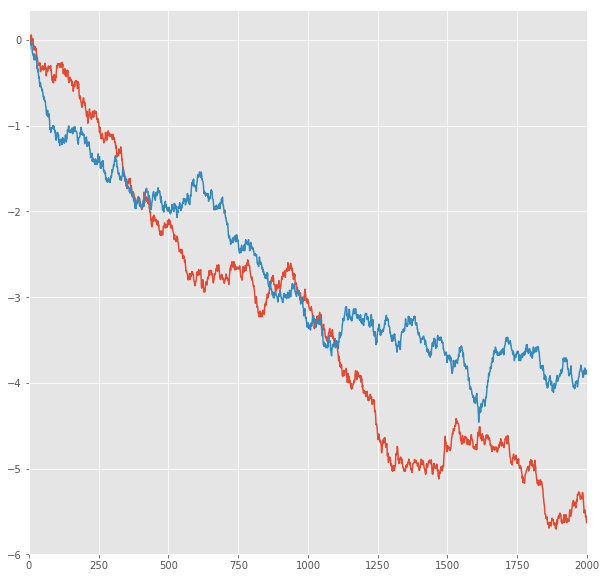

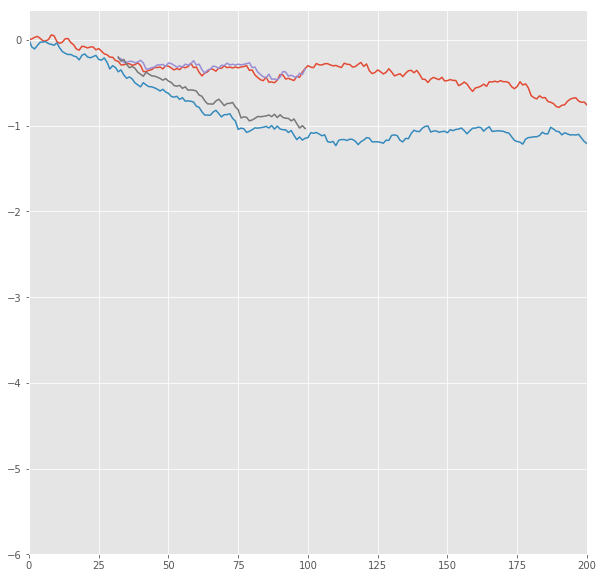

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.2238 RMSE
Predict Score for 1 -steps forecast: 0.2562 RMSE
Error Test Score for 1 -steps forecast: 0.1133 RMSE
RT Test Score for 1 -steps forecast: 0.1354 RMSE
Error Test Corr for 1 -steps forecast: 0.9656
RT Test Corr for 1 -steps forecast: 0.9425


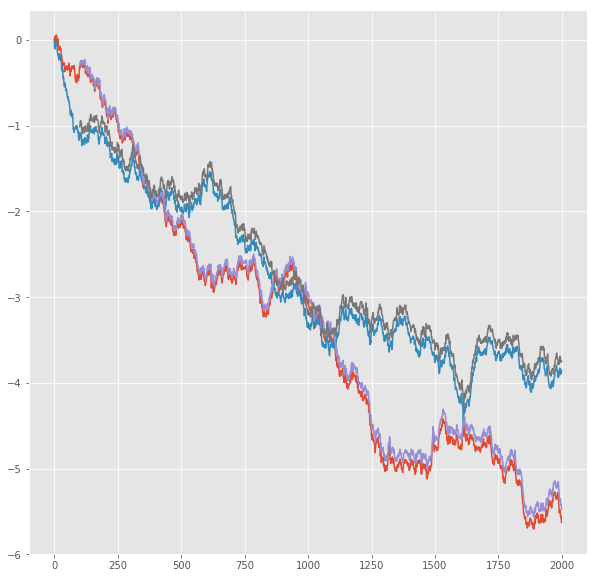

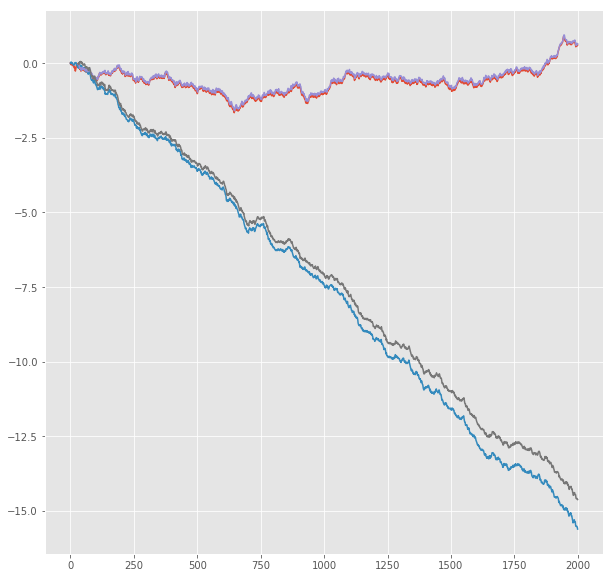

R^2 score for regression on Error: 0.9323
k = 0.9896


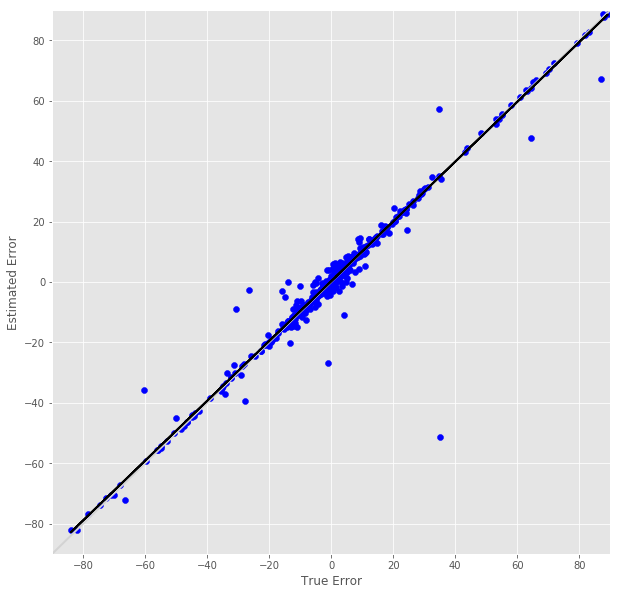

R^2 score for regression on RT: 0.8882
k = 0.9798


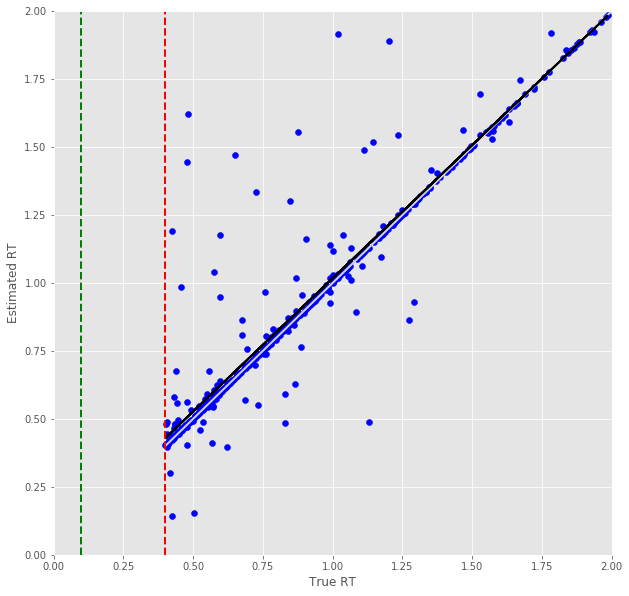

Error Prediction Score: 0.0204 RMSE
RT Prediction Score: 0.0267 RMSE
Error Prediction Corr: 0.9992
RT Prediction Corr: 0.9973
R^2 score for regression on Error: 0.9984
k = 0.9976


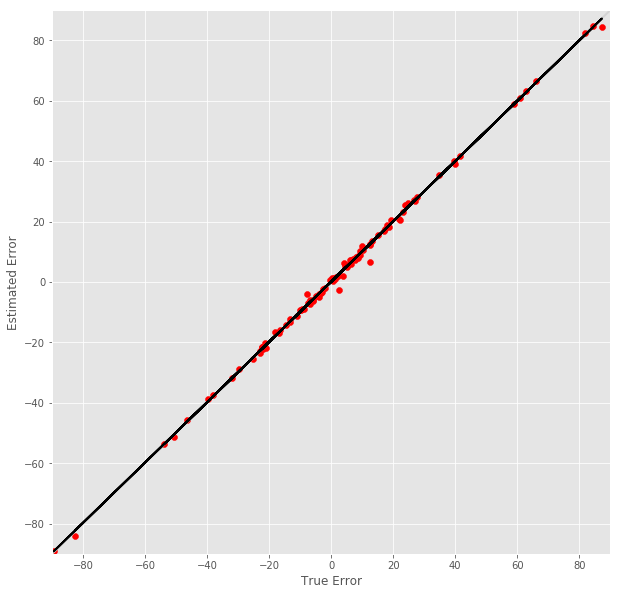

R^2 score for regression on RT: 0.9946
k = 1.0072


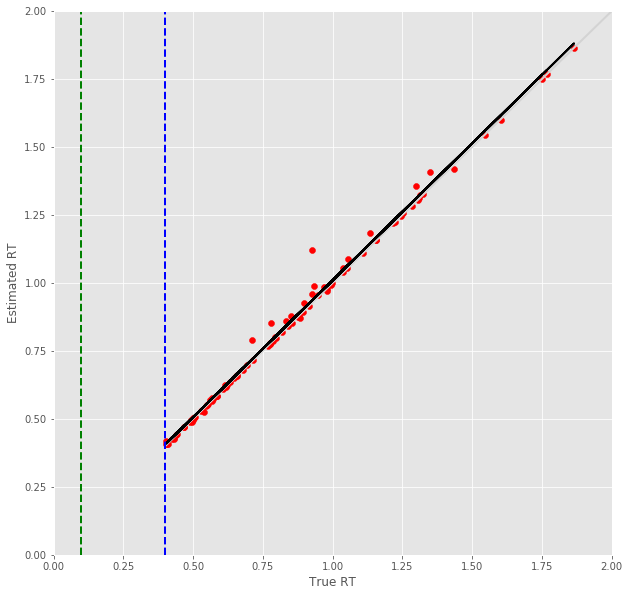

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.3563 RMSE
Predict Score for 2 -steps forecast: 0.4521 RMSE
Error Test Score for 2 -steps forecast: 0.1285 RMSE
RT Test Score for 2 -steps forecast: 0.1566 RMSE
Error Test Corr for 2 -steps forecast: 0.9582
RT Test Corr for 2 -steps forecast: 0.9234


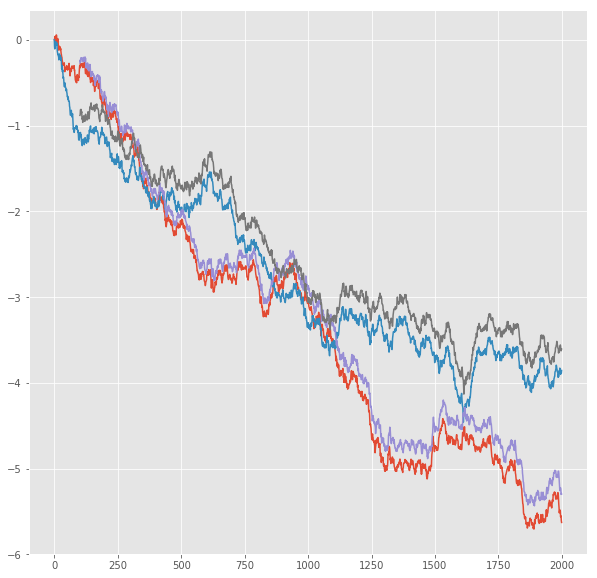

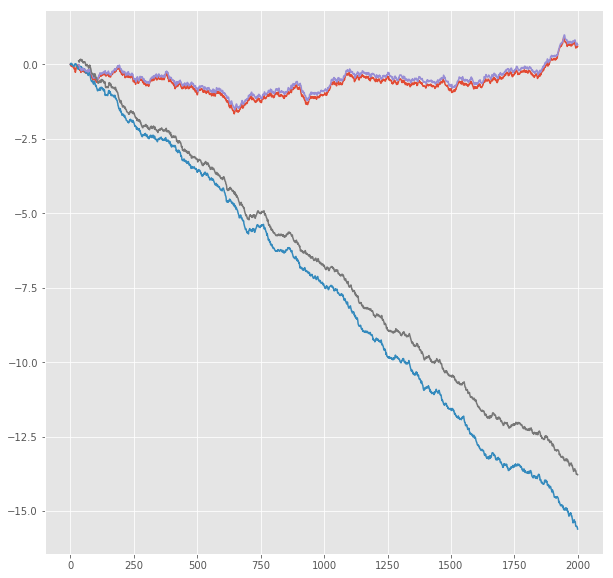

R^2 score for regression on Error: 0.9182
k = 1.0100


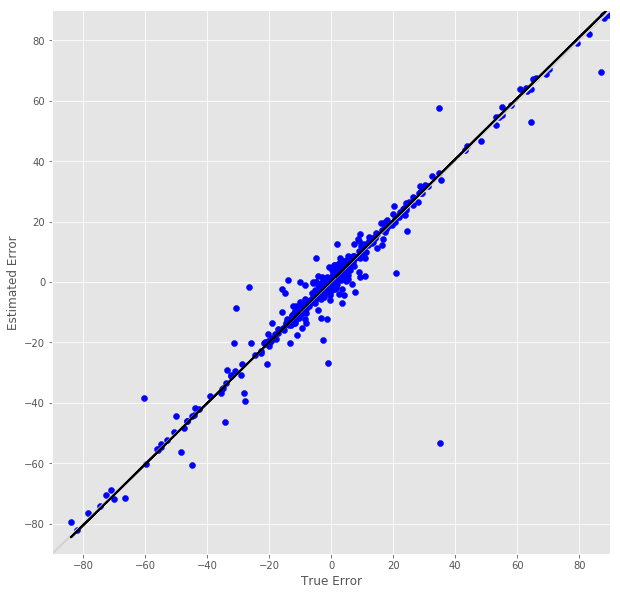

R^2 score for regression on RT: 0.8527
k = 0.9640


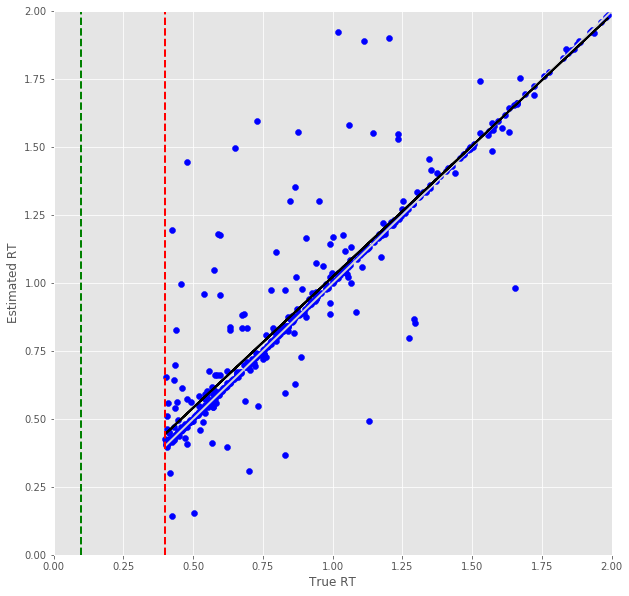

Error Prediction Score: 0.0801 RMSE
RT Prediction Score: 0.1235 RMSE
Error Prediction Corr: 0.9888
RT Prediction Corr: 0.9408
R^2 score for regression on Error: 0.9777
k = 1.0217


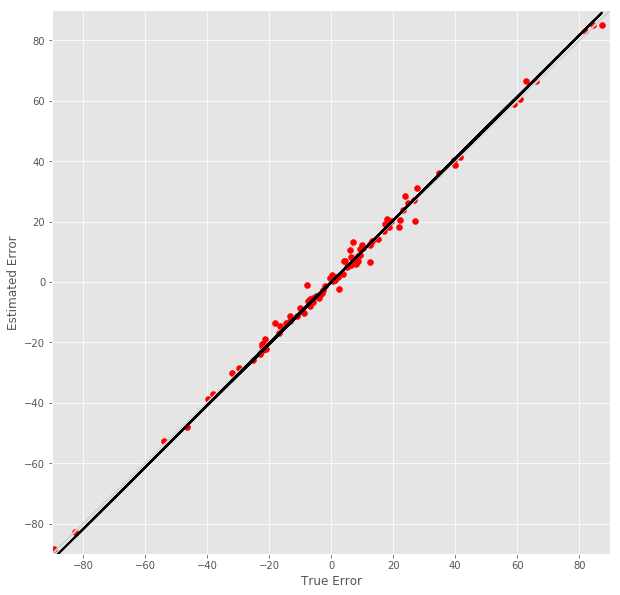

R^2 score for regression on RT: 0.8851
k = 0.9830


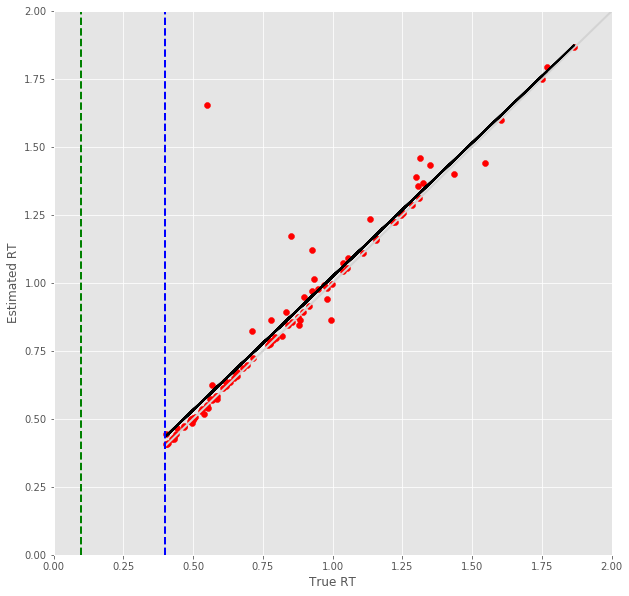

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.4799 RMSE
Predict Score for 3 -steps forecast: 0.6405 RMSE
Error Test Score for 3 -steps forecast: 0.1722 RMSE
RT Test Score for 3 -steps forecast: 0.2340 RMSE
Error Test Corr for 3 -steps forecast: 0.9306
RT Test Corr for 3 -steps forecast: 0.8315


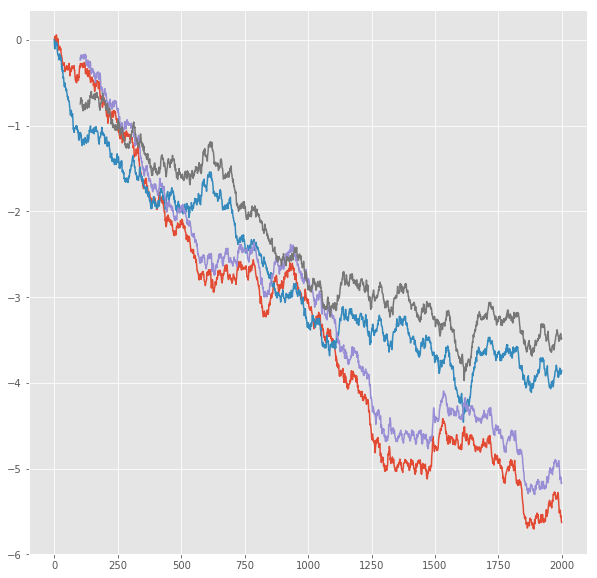

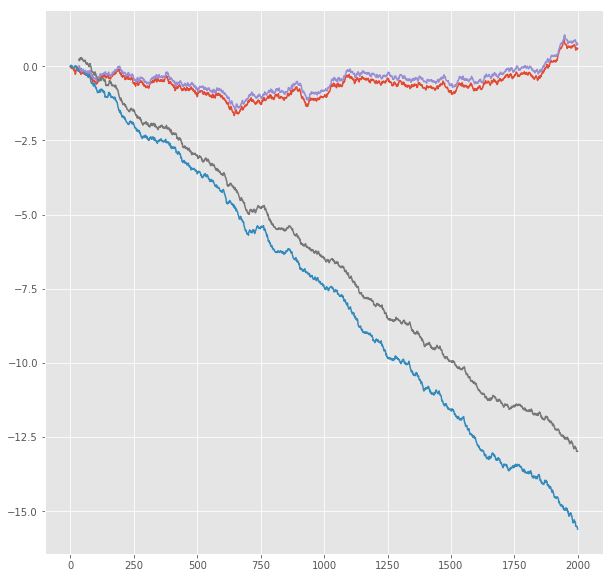

R^2 score for regression on Error: 0.8659
k = 1.0217


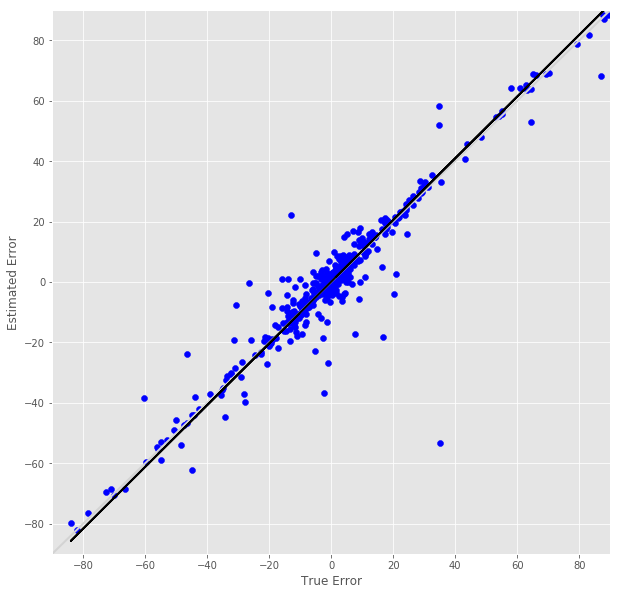

R^2 score for regression on RT: 0.6914
k = 0.8957


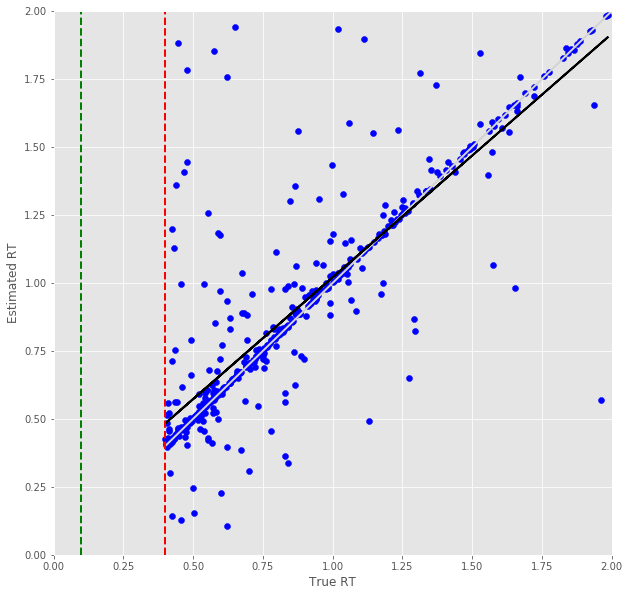

Error Prediction Score: 0.0934 RMSE
RT Prediction Score: 0.1562 RMSE
Error Prediction Corr: 0.9839
RT Prediction Corr: 0.9119
R^2 score for regression on Error: 0.9681
k = 1.0018


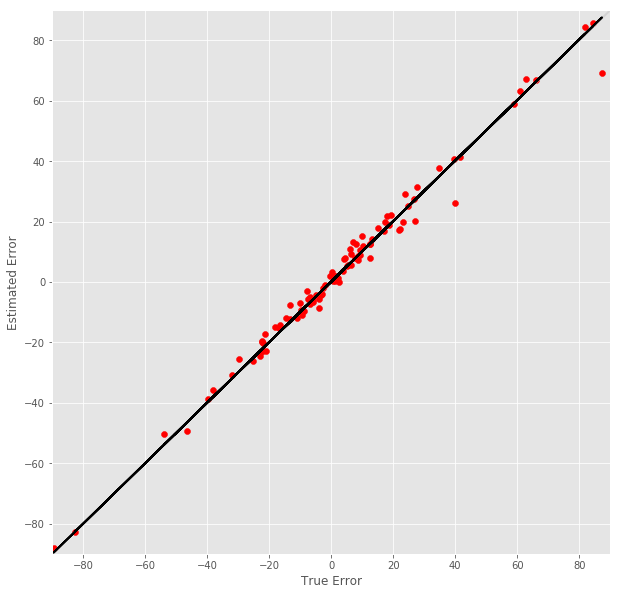

R^2 score for regression on RT: 0.8316
k = 0.9893


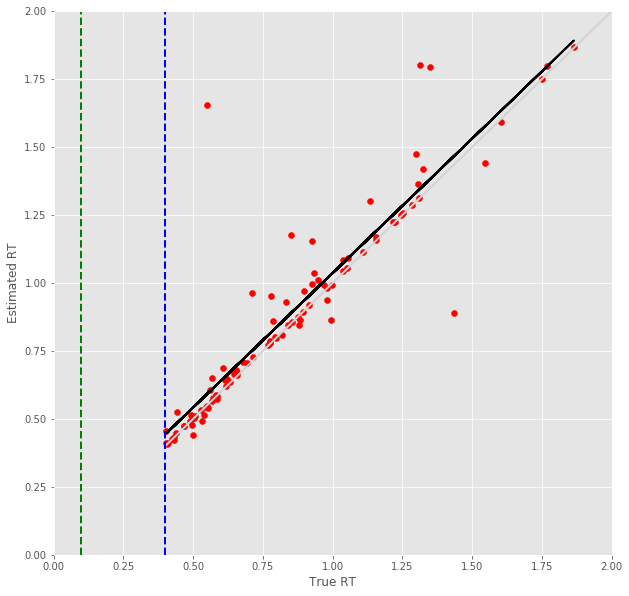

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.5993 RMSE
Predict Score for 4 -steps forecast: 0.8223 RMSE
Error Test Score for 4 -steps forecast: 0.1940 RMSE
RT Test Score for 4 -steps forecast: 0.2653 RMSE
Error Test Corr for 4 -steps forecast: 0.9148
RT Test Corr for 4 -steps forecast: 0.7920


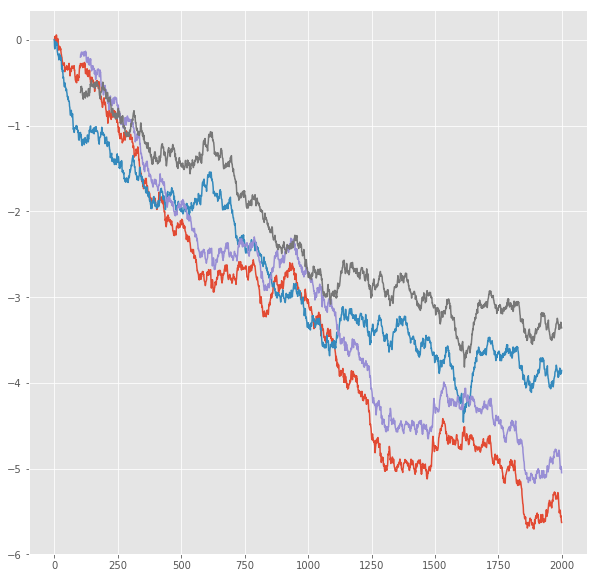

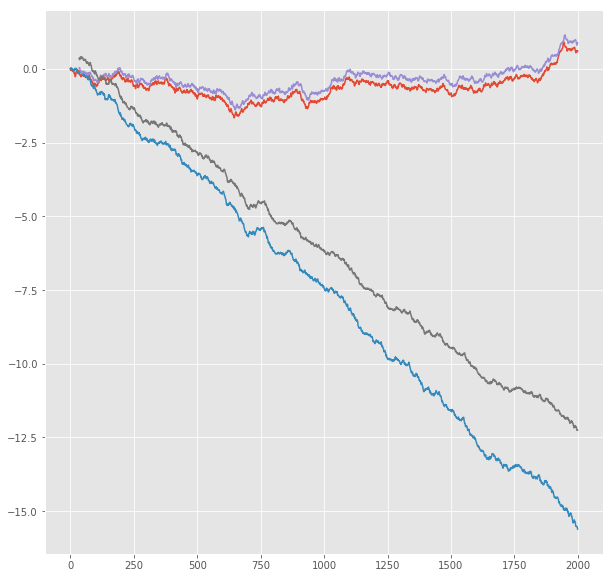

R^2 score for regression on Error: 0.8369
k = 1.0162


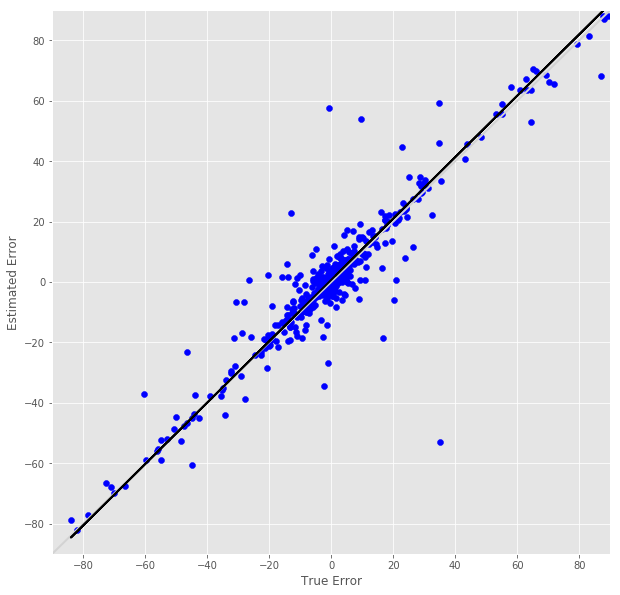

R^2 score for regression on RT: 0.6272
k = 0.8692


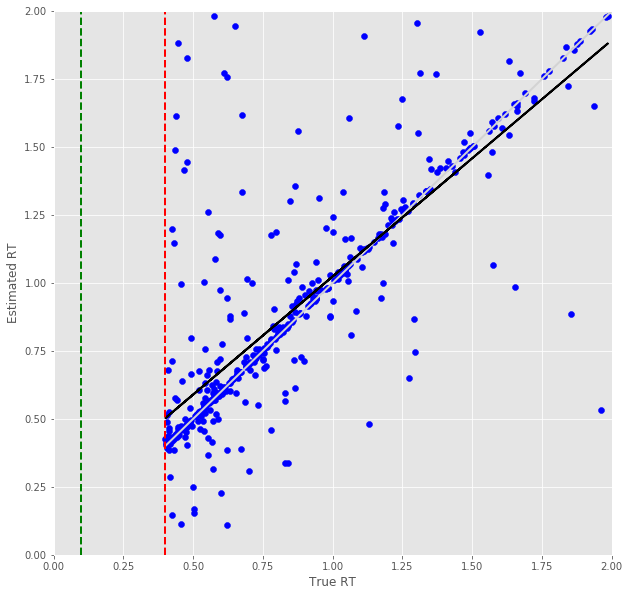

Error Prediction Score: 0.1155 RMSE
RT Prediction Score: 0.1661 RMSE
Error Prediction Corr: 0.9770
RT Prediction Corr: 0.9045
R^2 score for regression on Error: 0.9545
k = 1.0230


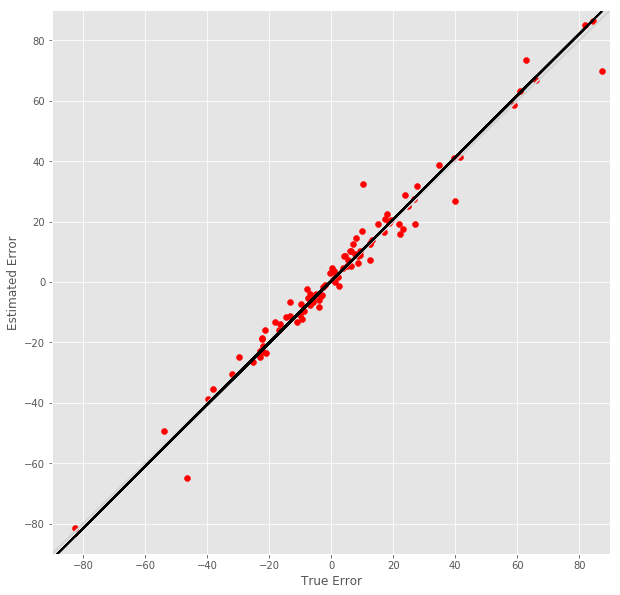

R^2 score for regression on RT: 0.8181
k = 1.0049


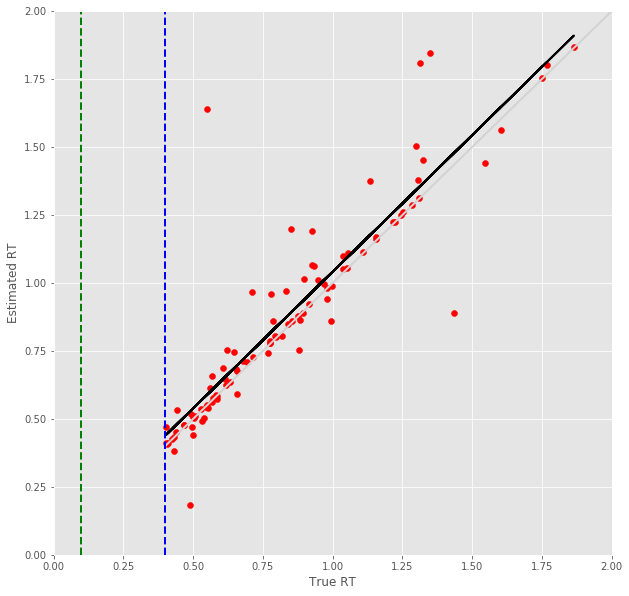

5 -step(s) forecast:
Test Score for 5 -steps forecast: 0.7156 RMSE
Predict Score for 5 -steps forecast: 0.9974 RMSE
Error Test Score for 5 -steps forecast: 0.2153 RMSE
RT Test Score for 5 -steps forecast: 0.2752 RMSE
Error Test Corr for 5 -steps forecast: 0.8964
RT Test Corr for 5 -steps forecast: 0.7779


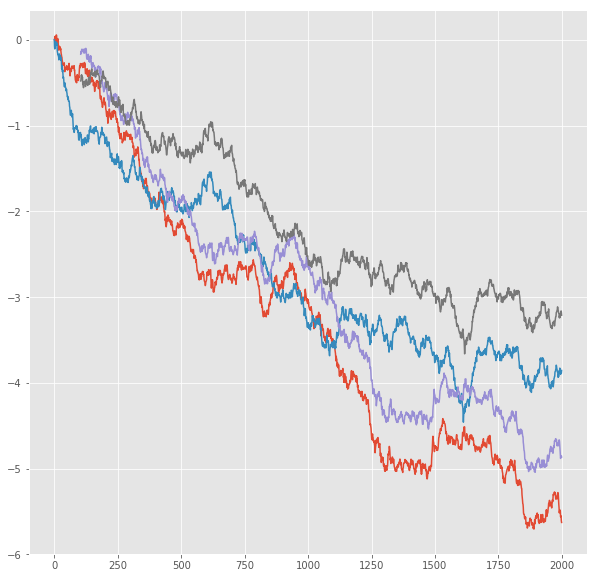

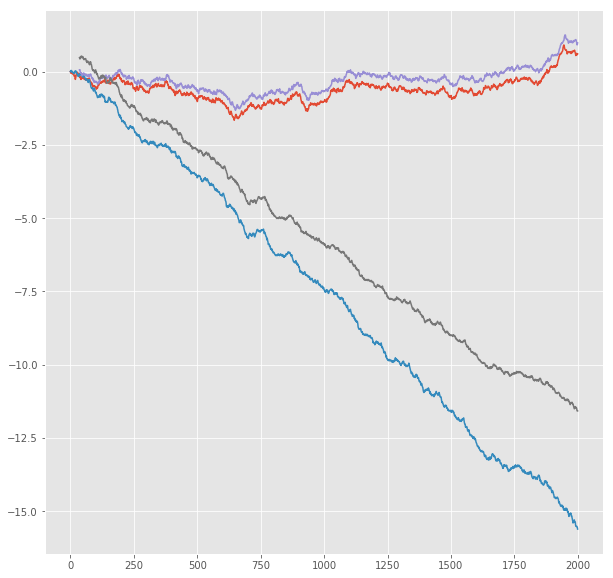

R^2 score for regression on Error: 0.8036
k = 0.9884


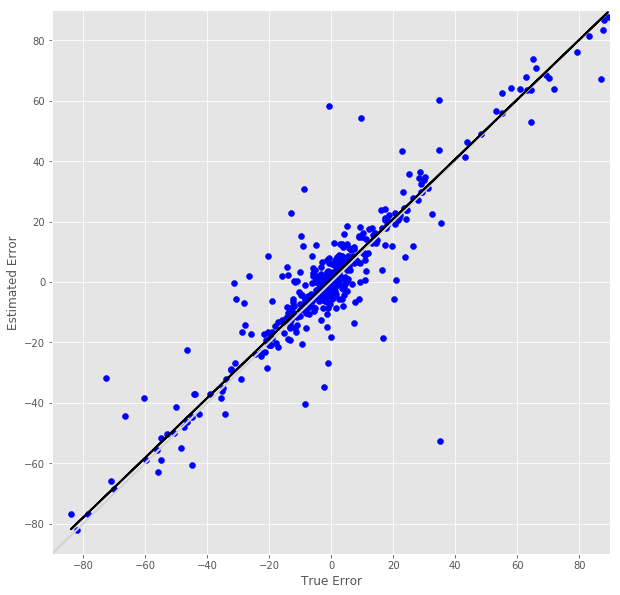

R^2 score for regression on RT: 0.6051
k = 0.8640


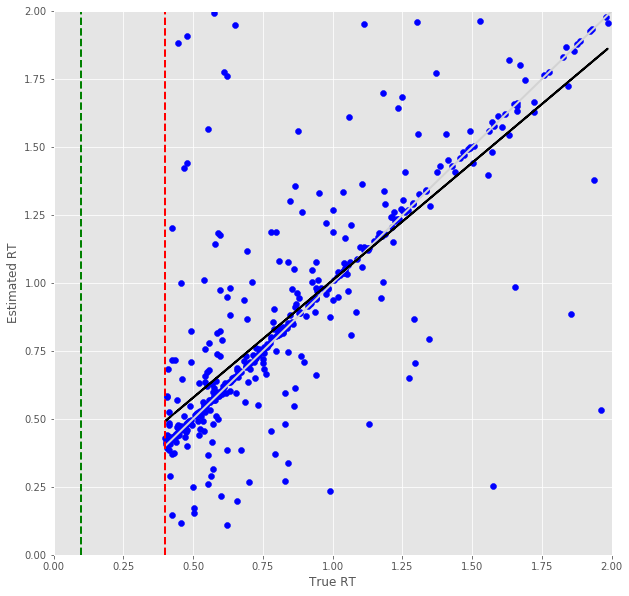

Error Prediction Score: 0.1282 RMSE
RT Prediction Score: 0.1742 RMSE
Error Prediction Corr: 0.9698
RT Prediction Corr: 0.8944
R^2 score for regression on Error: 0.9405
k = 1.0204


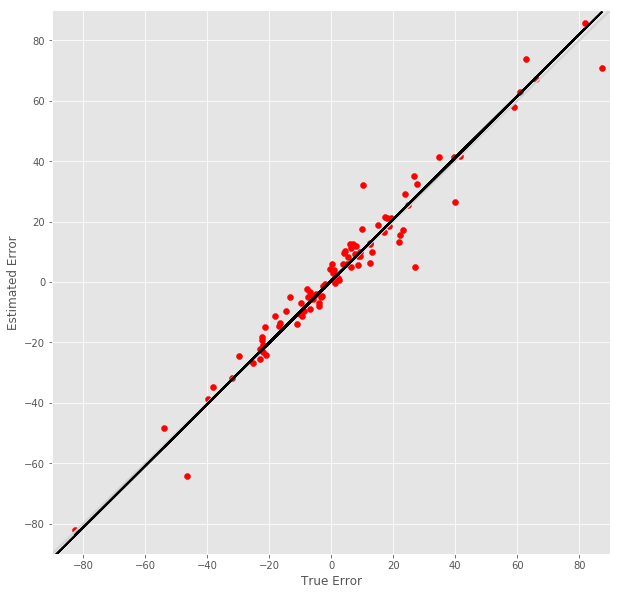

R^2 score for regression on RT: 0.8000
k = 0.9913


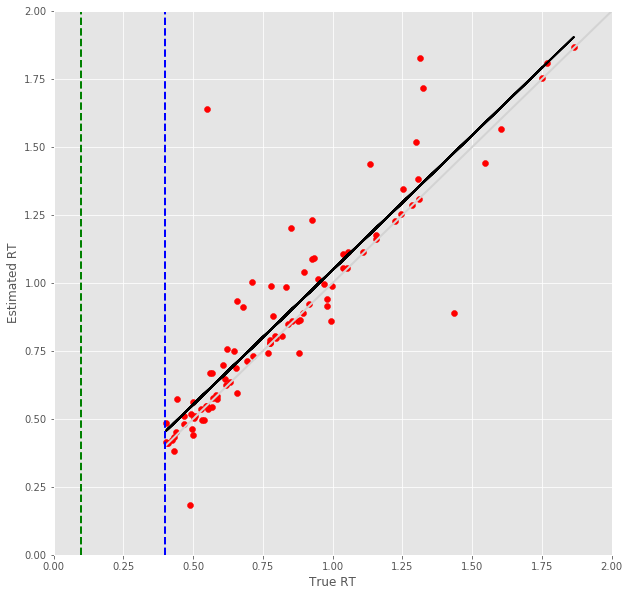

6 -step(s) forecast:
Test Score for 6 -steps forecast: 0.8293 RMSE
Predict Score for 6 -steps forecast: 1.1666 RMSE
Error Test Score for 6 -steps forecast: 0.2526 RMSE
RT Test Score for 6 -steps forecast: 0.2870 RMSE
Error Test Corr for 6 -steps forecast: 0.8650
RT Test Corr for 6 -steps forecast: 0.7530


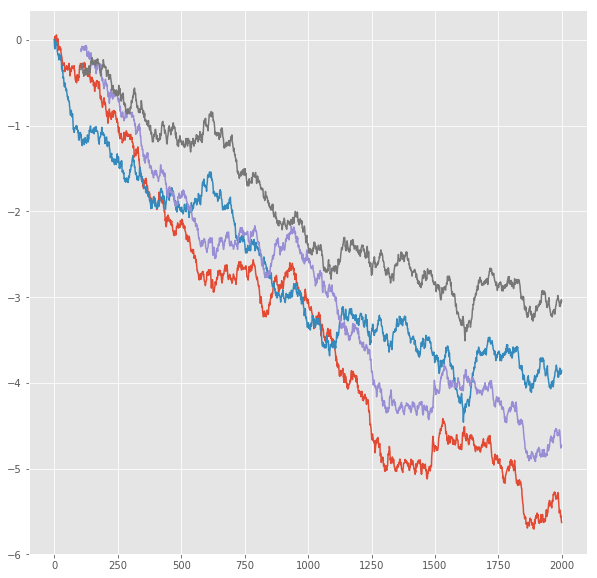

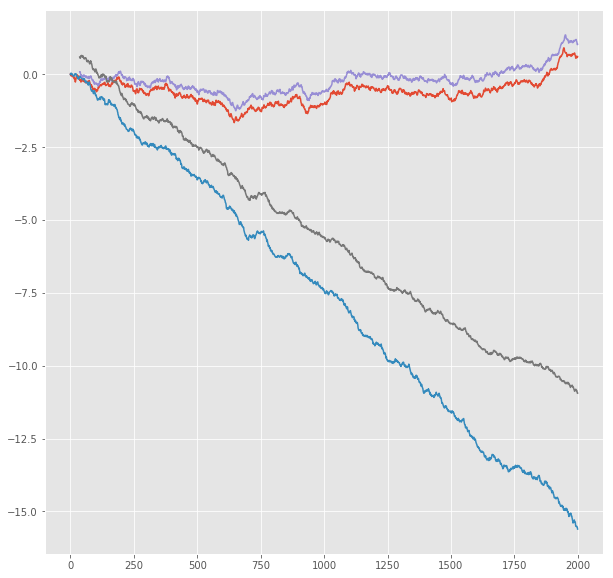

R^2 score for regression on Error: 0.7483
k = 0.9707


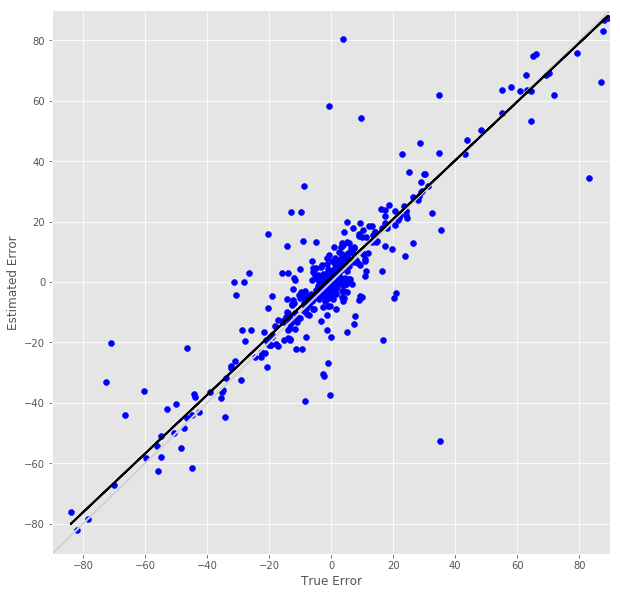

R^2 score for regression on RT: 0.5671
k = 0.8269


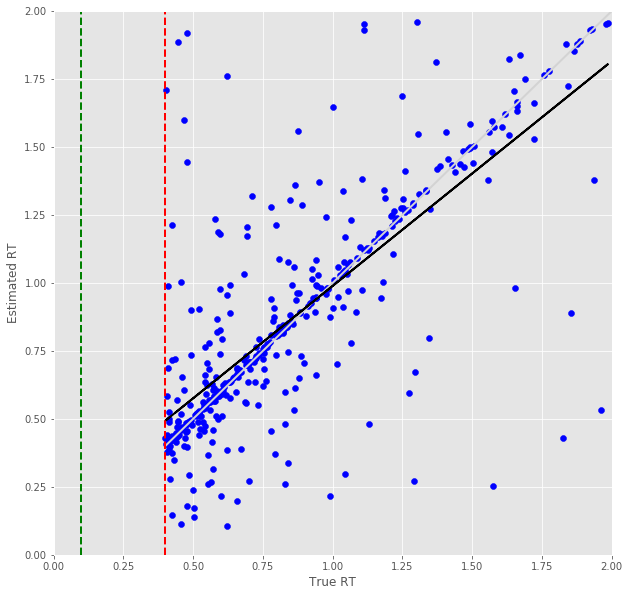

Error Prediction Score: 0.1359 RMSE
RT Prediction Score: 0.1952 RMSE
Error Prediction Corr: 0.9666
RT Prediction Corr: 0.8730
R^2 score for regression on Error: 0.9344
k = 1.0242


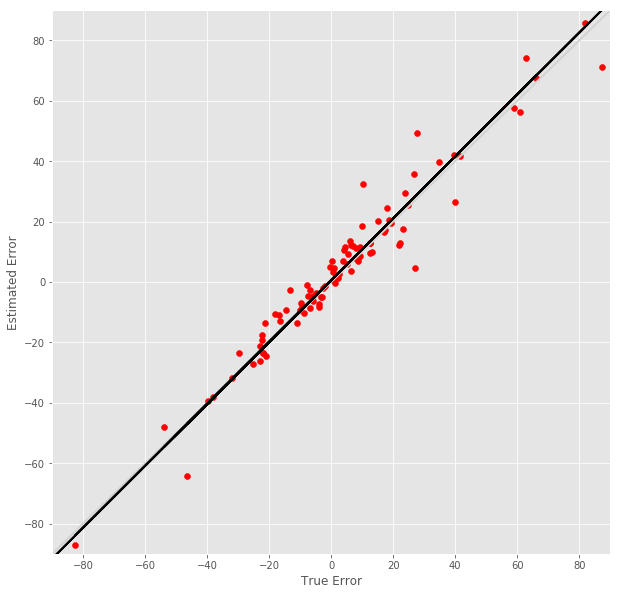

R^2 score for regression on RT: 0.7621
k = 0.9989


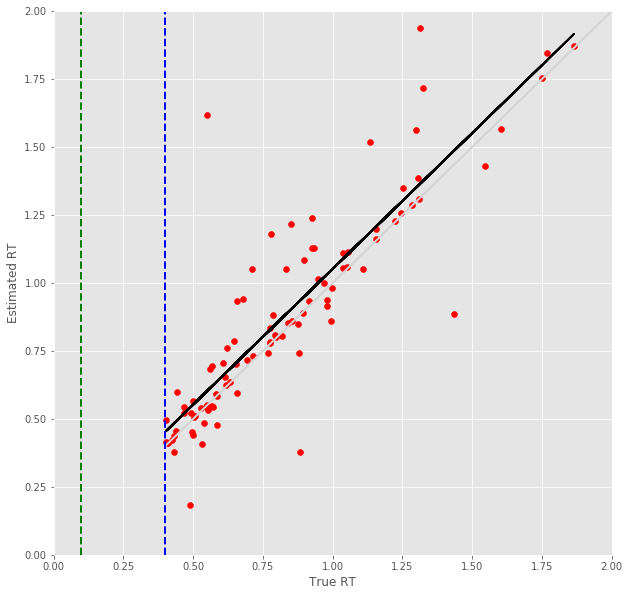

7 -step(s) forecast:
Test Score for 7 -steps forecast: 0.9411 RMSE
Predict Score for 7 -steps forecast: 1.3312 RMSE
Error Test Score for 7 -steps forecast: 0.2873 RMSE
RT Test Score for 7 -steps forecast: 0.3311 RMSE
Error Test Corr for 7 -steps forecast: 0.8346
RT Test Corr for 7 -steps forecast: 0.6844


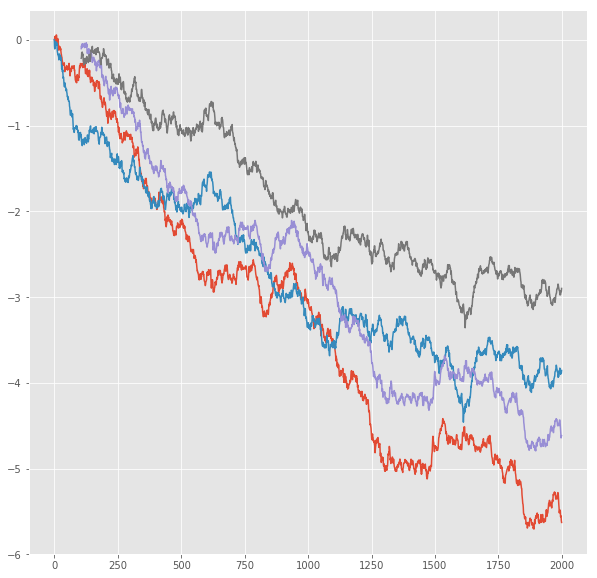

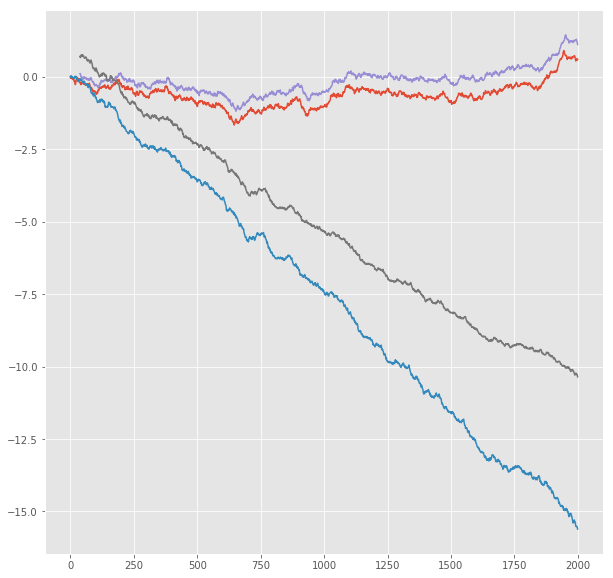

R^2 score for regression on Error: 0.6966
k = 0.9674


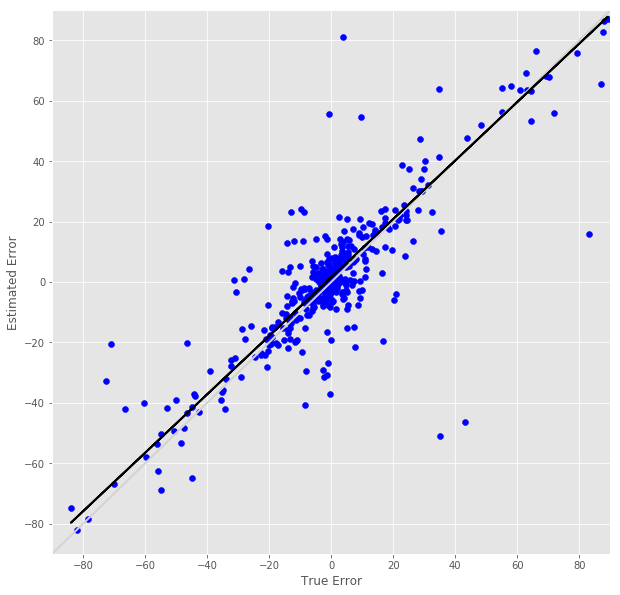

R^2 score for regression on RT: 0.4684
k = 0.7727


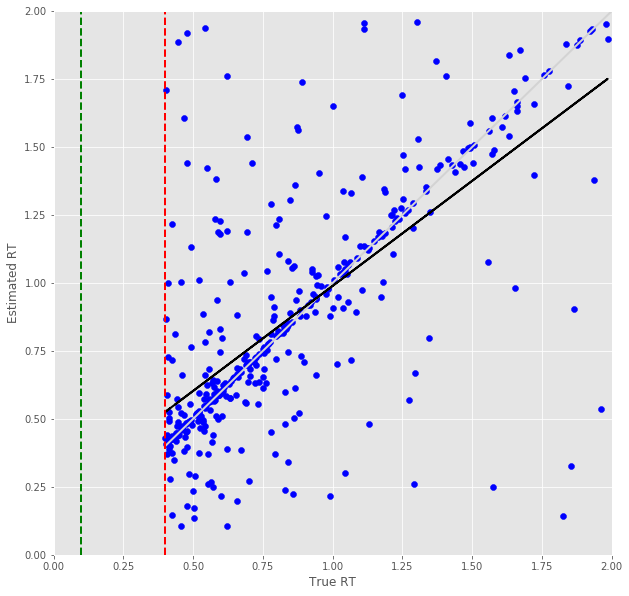

Error Prediction Score: 0.1451 RMSE
RT Prediction Score: 0.2041 RMSE
Error Prediction Corr: 0.9619
RT Prediction Corr: 0.8651
R^2 score for regression on Error: 0.9252
k = 1.0226


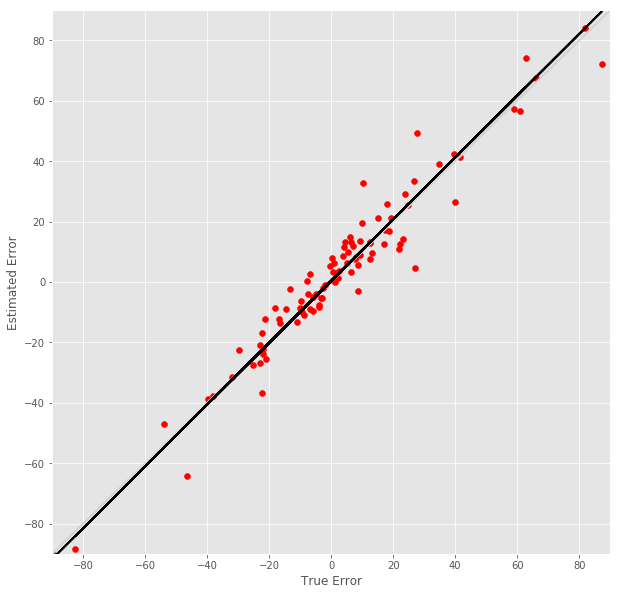

R^2 score for regression on RT: 0.7484
k = 1.0067


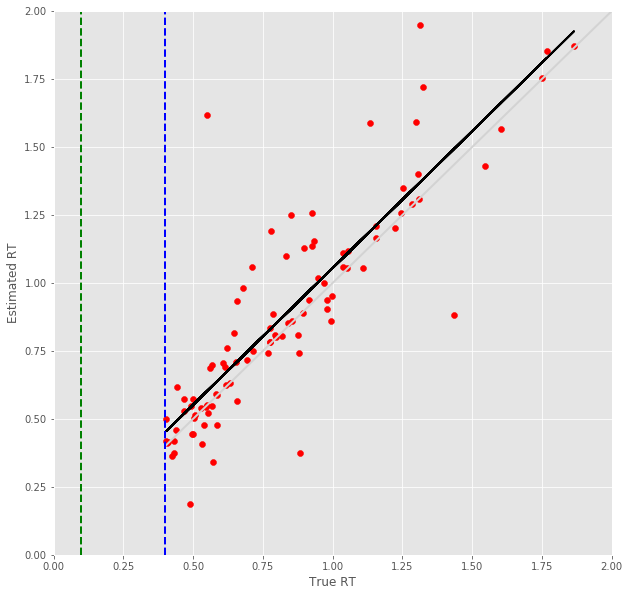

8 -step(s) forecast:
Test Score for 8 -steps forecast: 1.0513 RMSE
Predict Score for 8 -steps forecast: 1.4923 RMSE
Error Test Score for 8 -steps forecast: 0.3311 RMSE
RT Test Score for 8 -steps forecast: 0.3675 RMSE
Error Test Corr for 8 -steps forecast: 0.7951
RT Test Corr for 8 -steps forecast: 0.6308


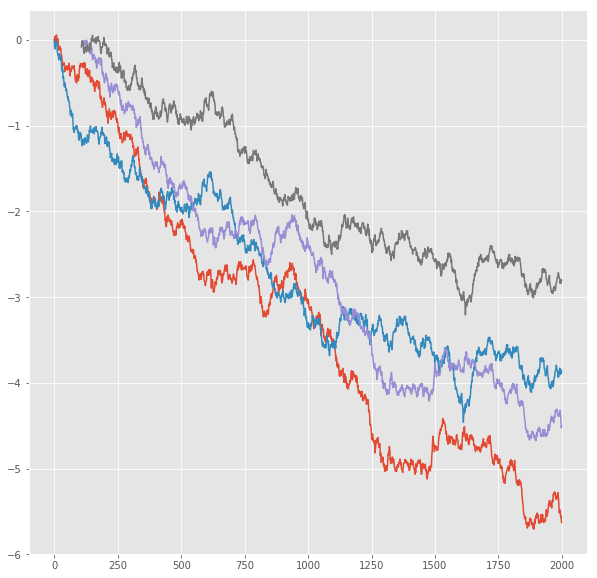

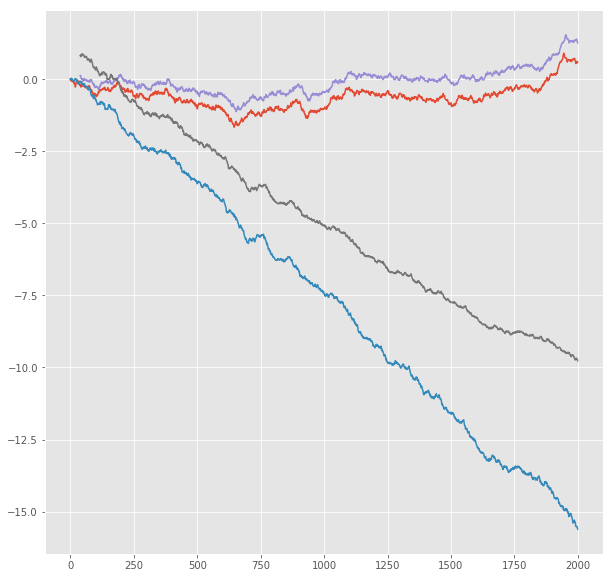

R^2 score for regression on Error: 0.6322
k = 0.9580


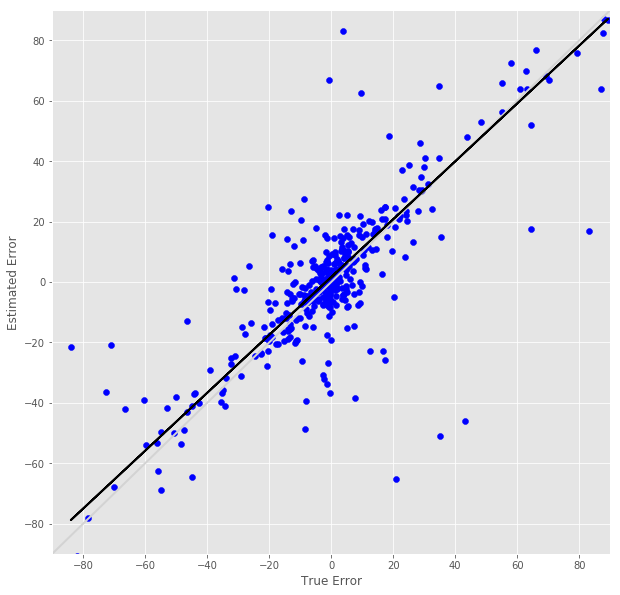

R^2 score for regression on RT: 0.3980
k = 0.7401


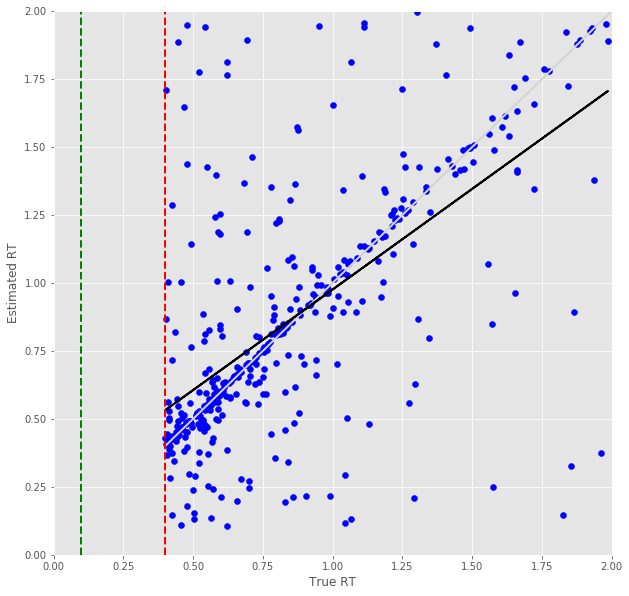

Error Prediction Score: 0.1707 RMSE
RT Prediction Score: 0.2350 RMSE
Error Prediction Corr: 0.9480
RT Prediction Corr: 0.8192
R^2 score for regression on Error: 0.8987
k = 1.0178


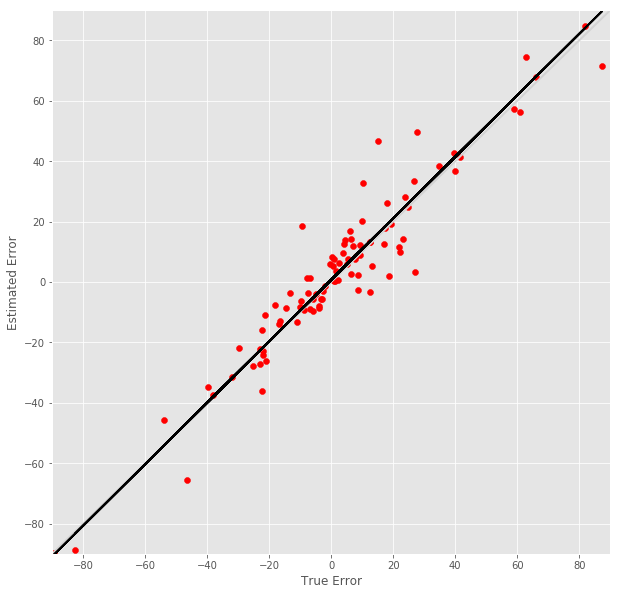

R^2 score for regression on RT: 0.6710
k = 0.9577


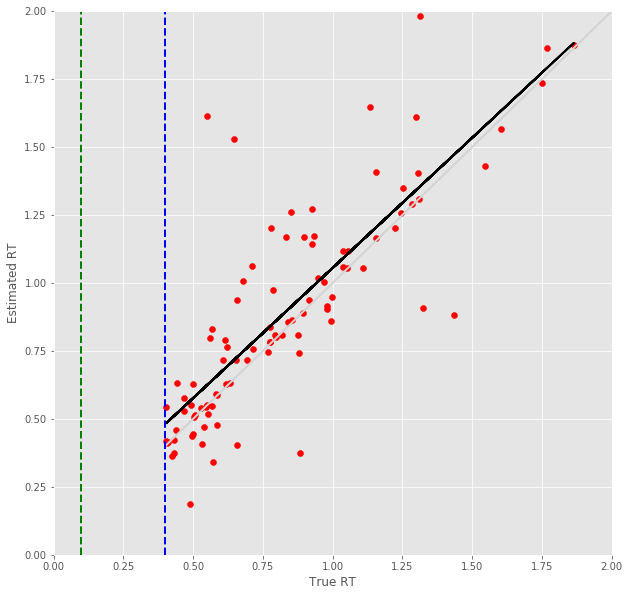

9 -step(s) forecast:
Test Score for 9 -steps forecast: 1.1600 RMSE
Predict Score for 9 -steps forecast: 1.6504 RMSE
Error Test Score for 9 -steps forecast: 0.3519 RMSE
RT Test Score for 9 -steps forecast: 0.3859 RMSE
Error Test Corr for 9 -steps forecast: 0.7702
RT Test Corr for 9 -steps forecast: 0.5916


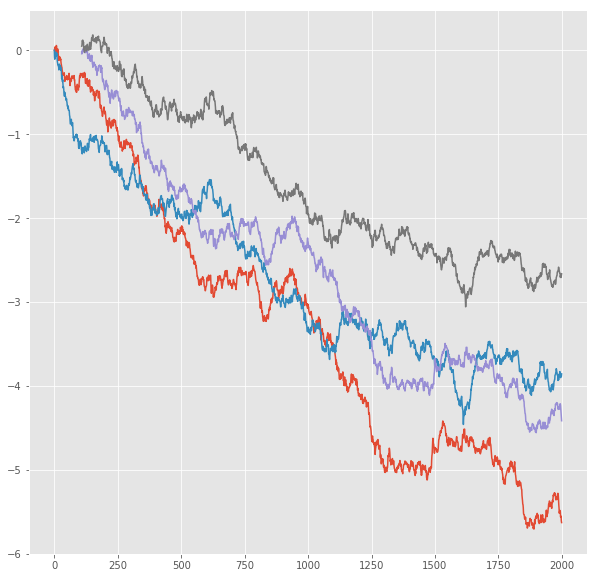

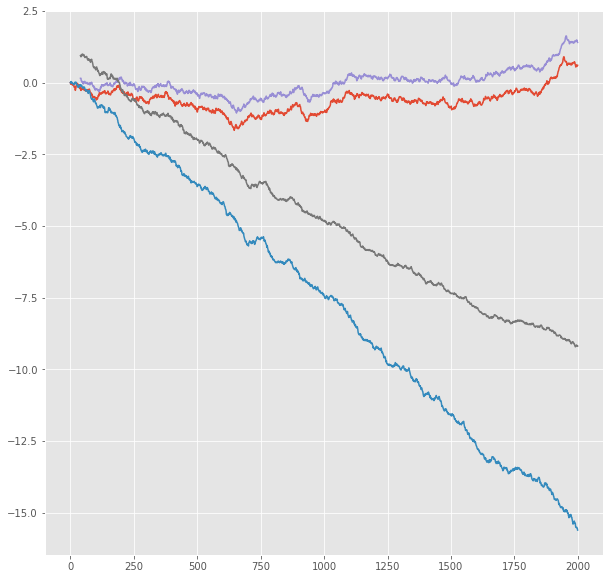

R^2 score for regression on Error: 0.5932
k = 0.9146


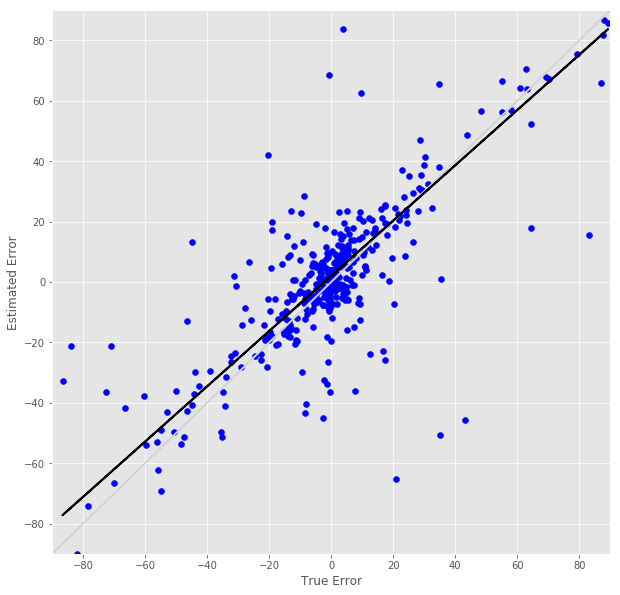

R^2 score for regression on RT: 0.3500
k = 0.6985


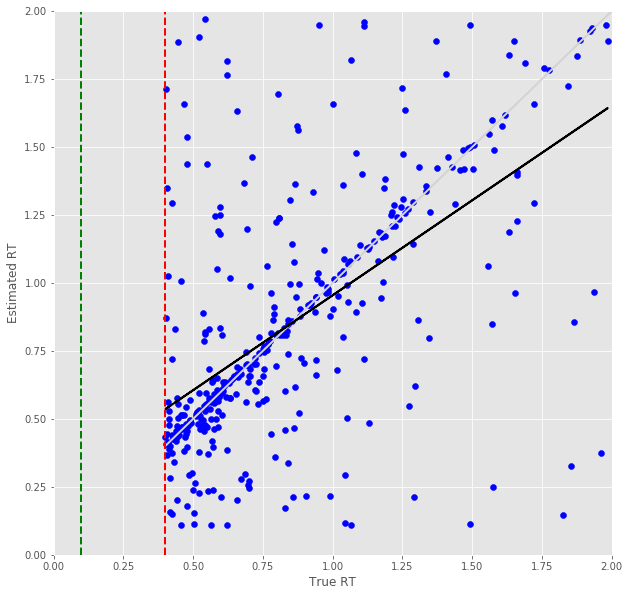

Error Prediction Score: 0.1920 RMSE
RT Prediction Score: 0.2661 RMSE
Error Prediction Corr: 0.9326
RT Prediction Corr: 0.7665
R^2 score for regression on Error: 0.8697
k = 0.9913


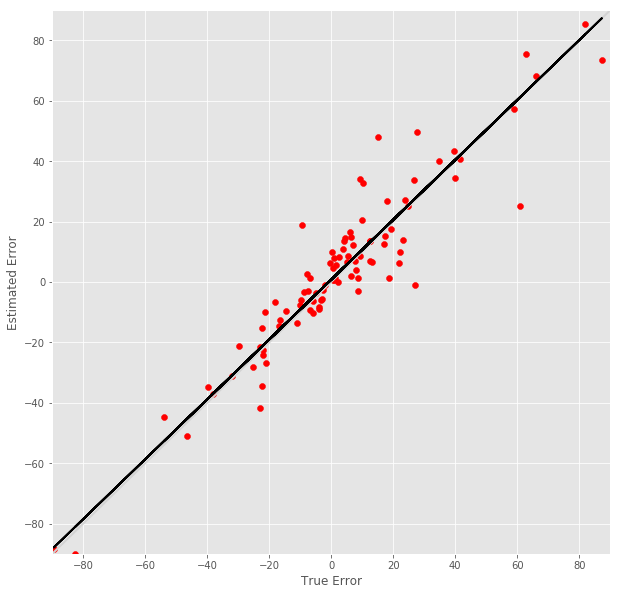

R^2 score for regression on RT: 0.5875
k = 0.9091


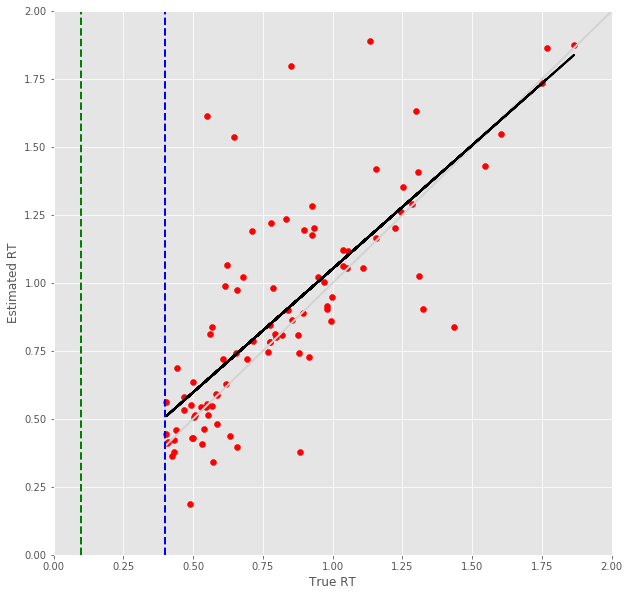

10 -step(s) forecast:
Test Score for 10 -steps forecast: 1.2675 RMSE
Predict Score for 10 -steps forecast: 1.8061 RMSE
Error Test Score for 10 -steps forecast: 0.3718 RMSE
RT Test Score for 10 -steps forecast: 0.4058 RMSE
Error Test Corr for 10 -steps forecast: 0.7479
RT Test Corr for 10 -steps forecast: 0.5558


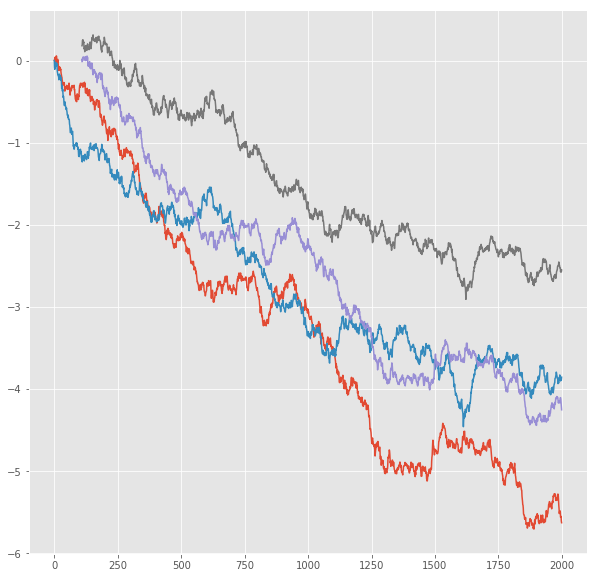

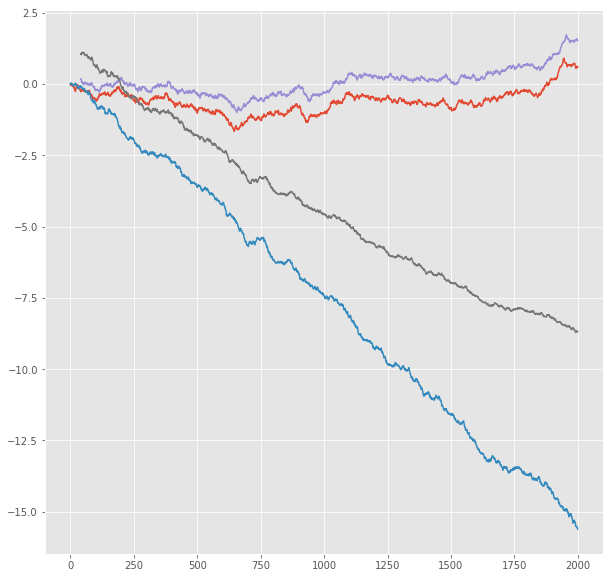

R^2 score for regression on Error: 0.5593
k = 0.8953


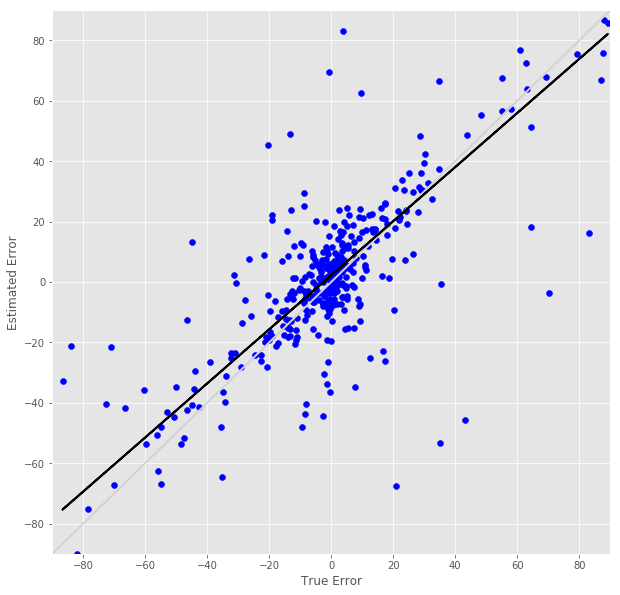

R^2 score for regression on RT: 0.3089
k = 0.6533


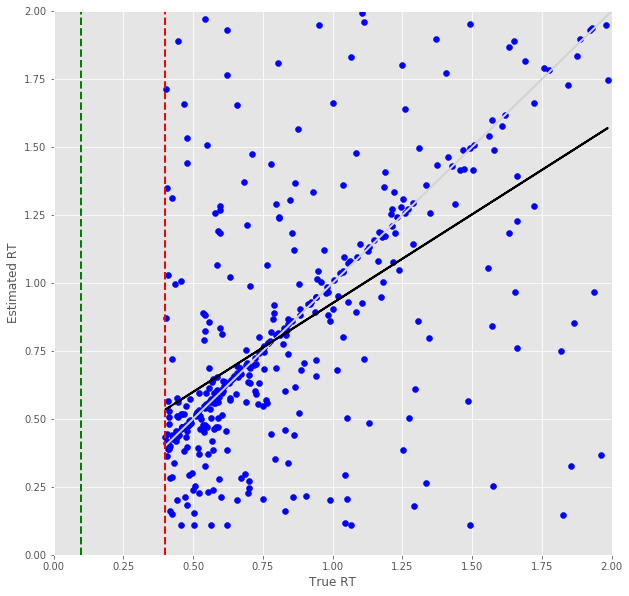

Error Prediction Score: 0.2208 RMSE
RT Prediction Score: 0.2861 RMSE
Error Prediction Corr: 0.9137
RT Prediction Corr: 0.7426
R^2 score for regression on Error: 0.8349
k = 0.9935


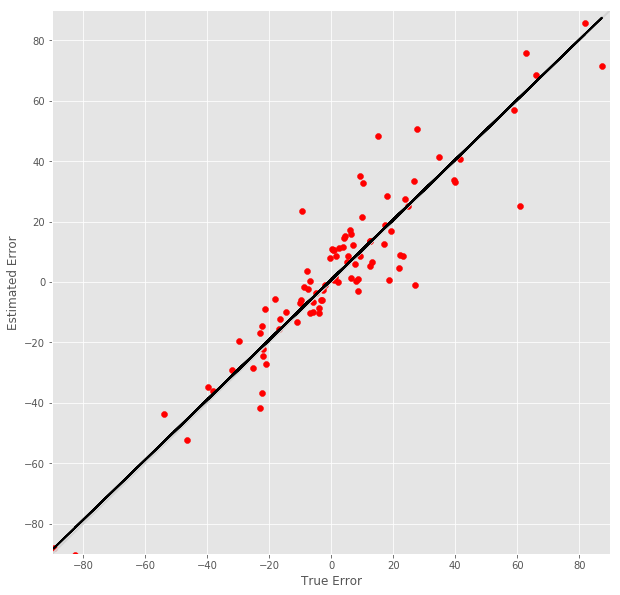

R^2 score for regression on RT: 0.5515
k = 0.9054


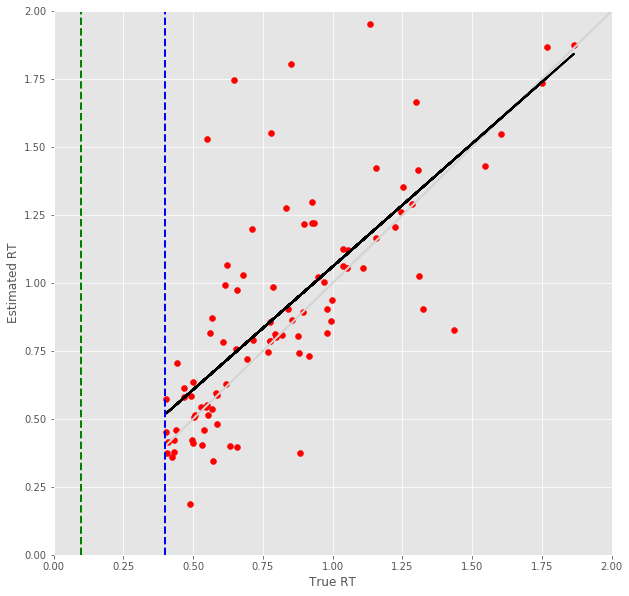

11 -step(s) forecast:
Test Score for 11 -steps forecast: 1.3737 RMSE
Predict Score for 11 -steps forecast: 1.9596 RMSE
Error Test Score for 11 -steps forecast: 0.3868 RMSE
RT Test Score for 11 -steps forecast: 0.4174 RMSE
Error Test Corr for 11 -steps forecast: 0.7359
RT Test Corr for 11 -steps forecast: 0.5427


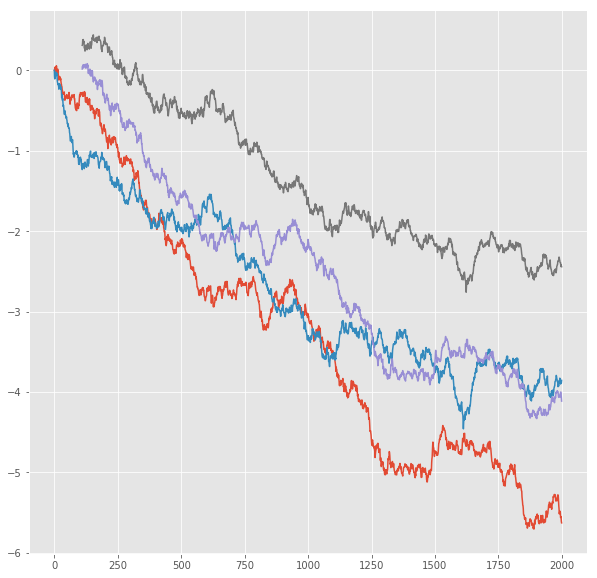

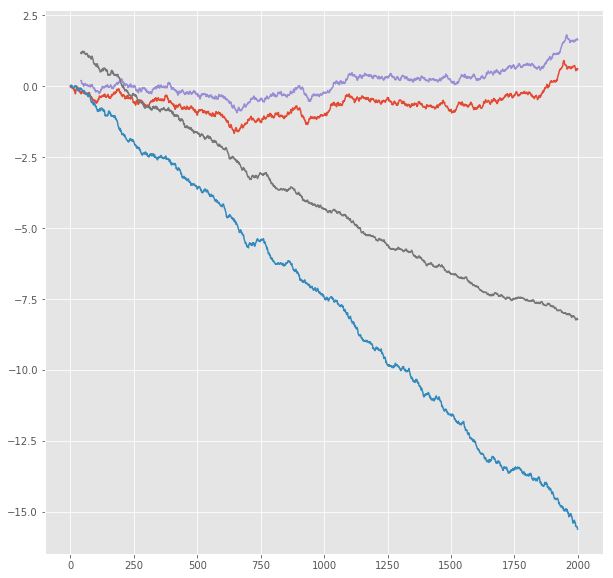

R^2 score for regression on Error: 0.5416
k = 0.8858


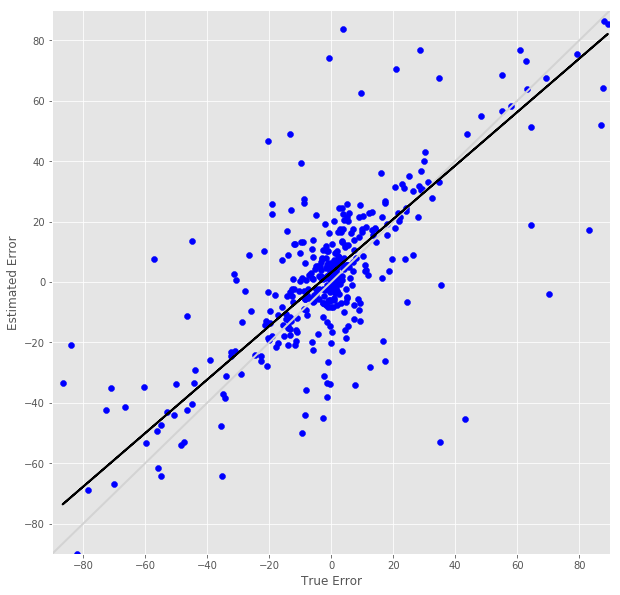

R^2 score for regression on RT: 0.2945
k = 0.6320


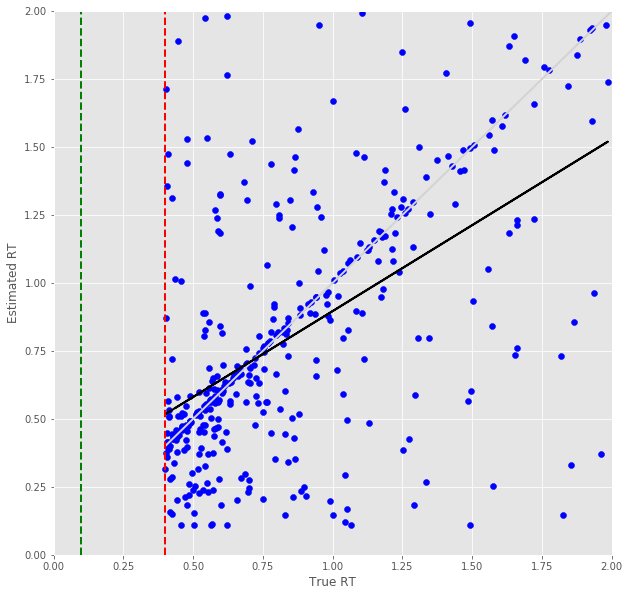

Error Prediction Score: 0.2316 RMSE
RT Prediction Score: 0.2883 RMSE
Error Prediction Corr: 0.9077
RT Prediction Corr: 0.7296
R^2 score for regression on Error: 0.8239
k = 0.9962


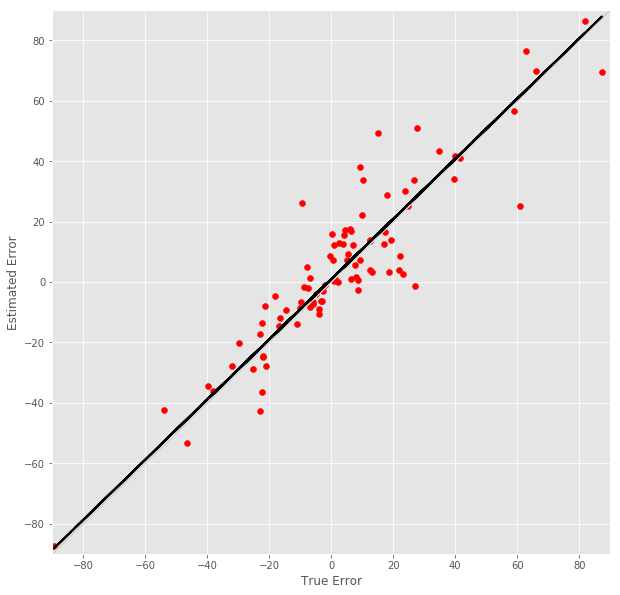

R^2 score for regression on RT: 0.5323
k = 0.8777


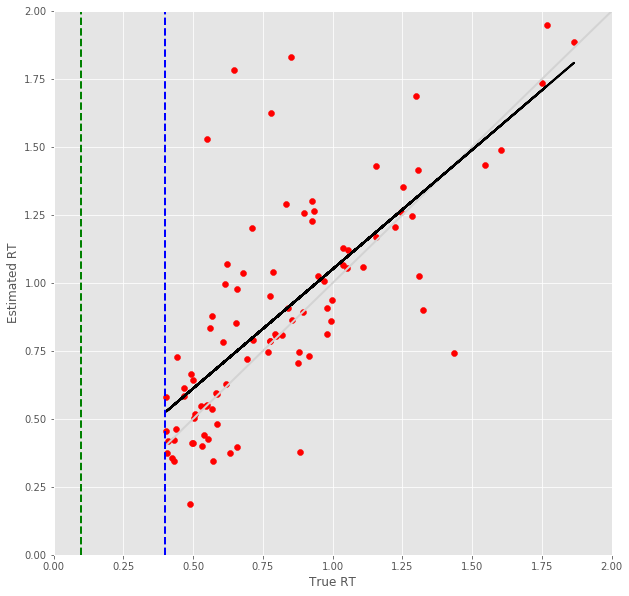

12 -step(s) forecast:
Test Score for 12 -steps forecast: 1.4785 RMSE
Predict Score for 12 -steps forecast: 2.1113 RMSE
Error Test Score for 12 -steps forecast: 0.4038 RMSE
RT Test Score for 12 -steps forecast: 0.4269 RMSE
Error Test Corr for 12 -steps forecast: 0.7199
RT Test Corr for 12 -steps forecast: 0.5173


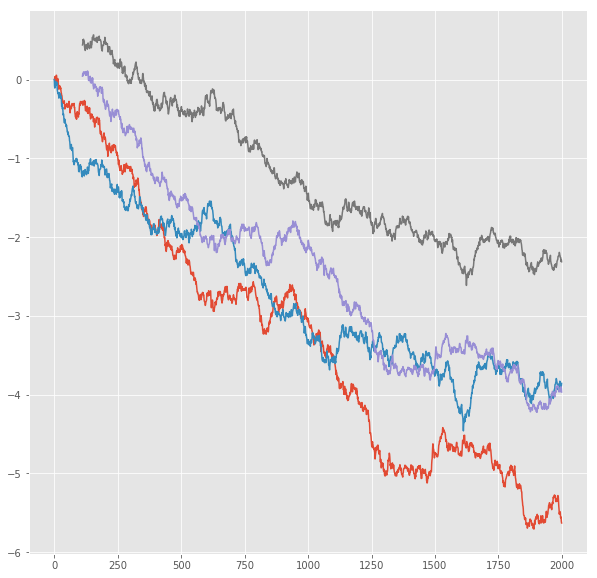

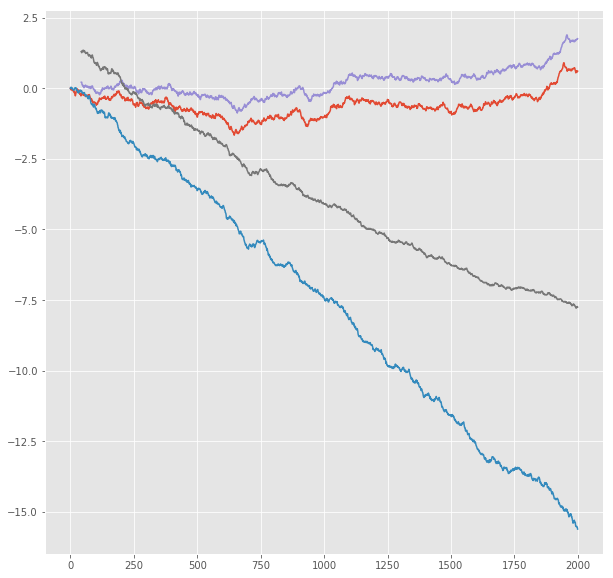

R^2 score for regression on Error: 0.5182
k = 0.8726


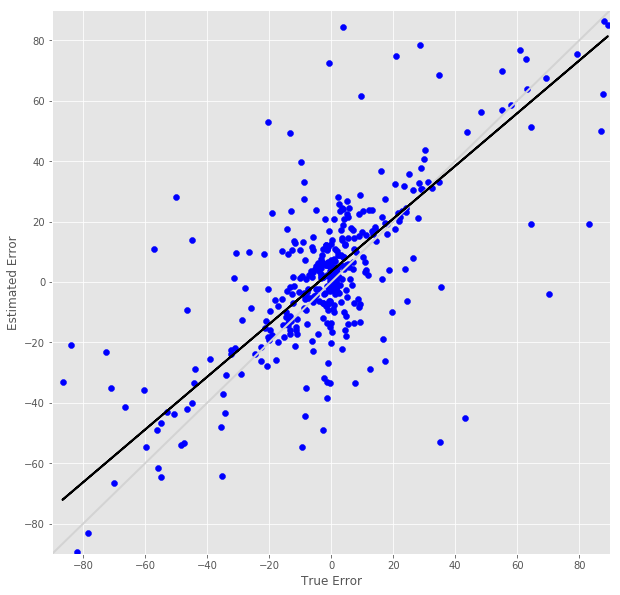

R^2 score for regression on RT: 0.2676
k = 0.5884


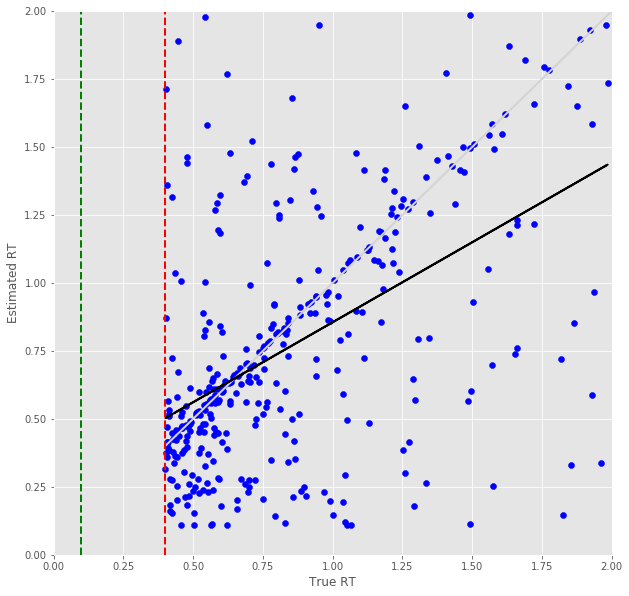

Error Prediction Score: 0.2686 RMSE
RT Prediction Score: 0.3094 RMSE
Error Prediction Corr: 0.8949
RT Prediction Corr: 0.6861
R^2 score for regression on Error: 0.8008
k = 1.0616


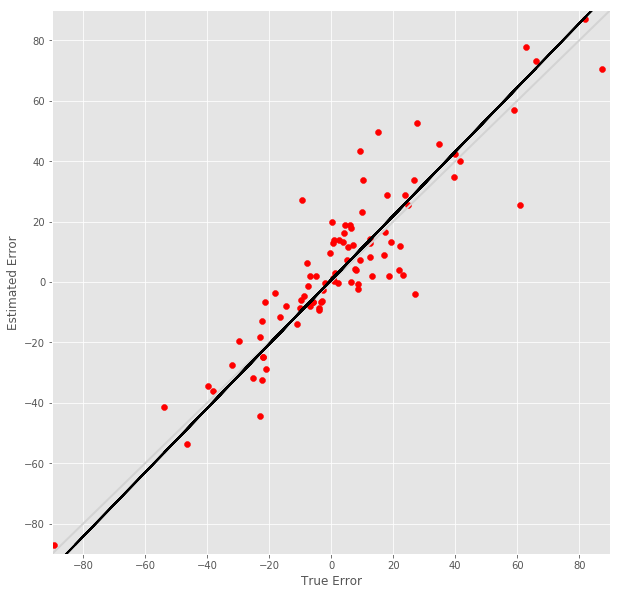

R^2 score for regression on RT: 0.4707
k = 0.8244


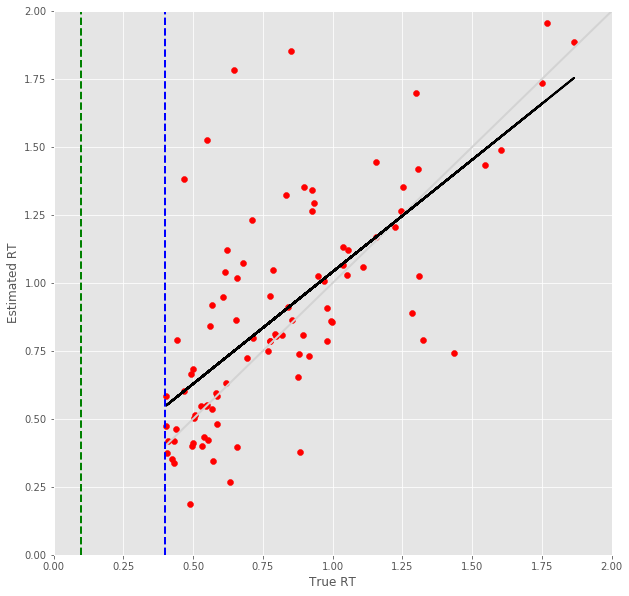

13 -step(s) forecast:
Test Score for 13 -steps forecast: 1.5819 RMSE
Predict Score for 13 -steps forecast: 2.2613 RMSE
Error Test Score for 13 -steps forecast: 0.4259 RMSE
RT Test Score for 13 -steps forecast: 0.4371 RMSE
Error Test Corr for 13 -steps forecast: 0.7034
RT Test Corr for 13 -steps forecast: 0.5085


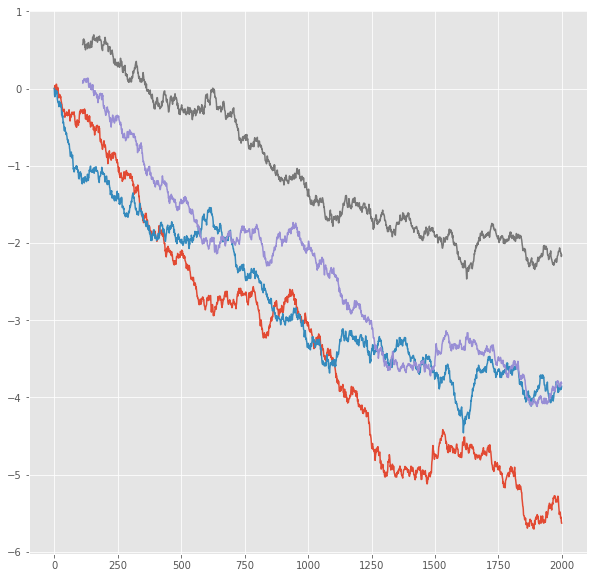

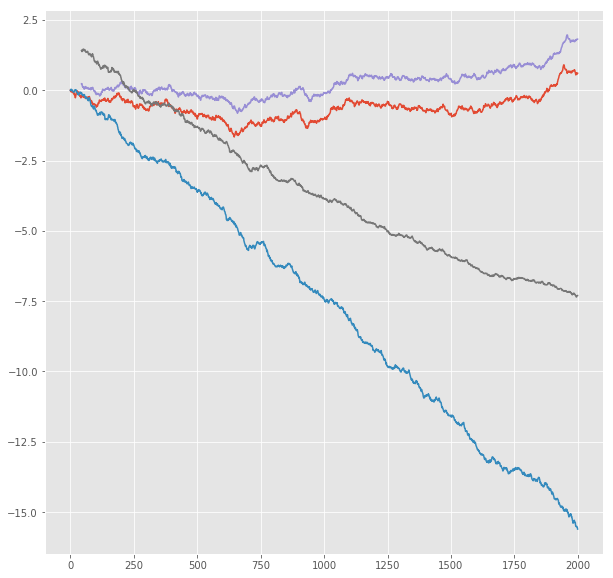

R^2 score for regression on Error: 0.4947
k = 0.8631


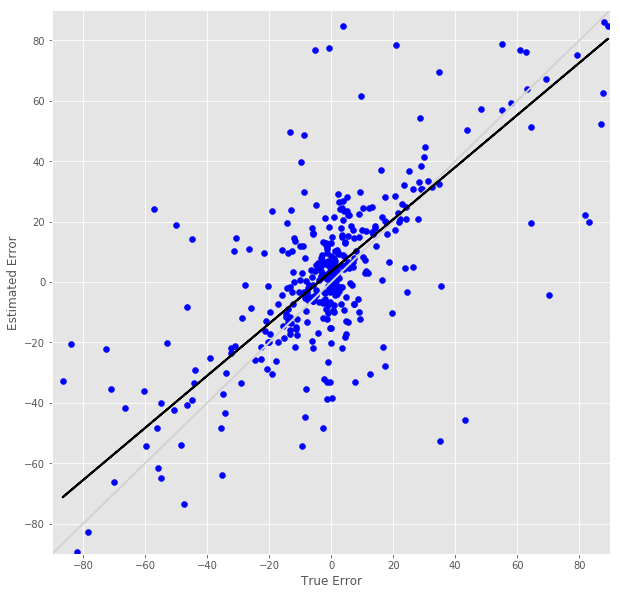

R^2 score for regression on RT: 0.2586
k = 0.5710


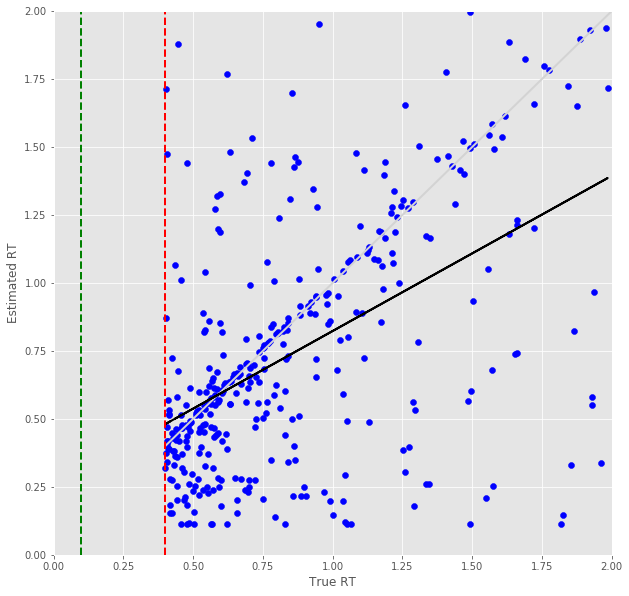

Error Prediction Score: 0.2790 RMSE
RT Prediction Score: 0.3262 RMSE
Error Prediction Corr: 0.8835
RT Prediction Corr: 0.6656
R^2 score for regression on Error: 0.7806
k = 1.0416


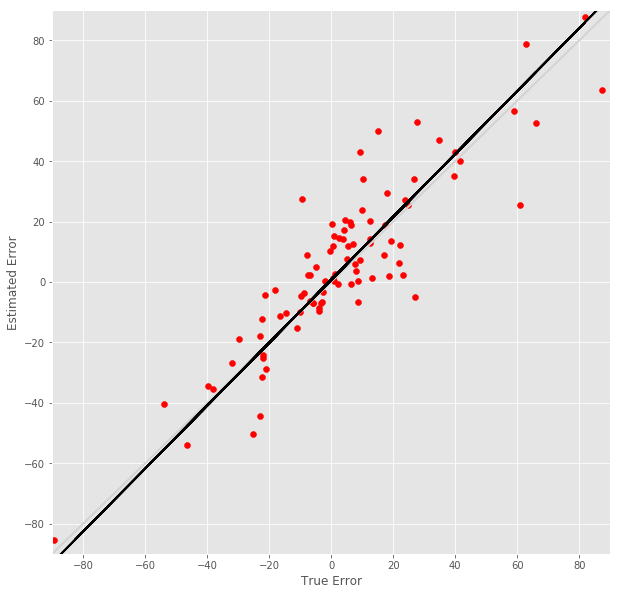

R^2 score for regression on RT: 0.4430
k = 0.8284


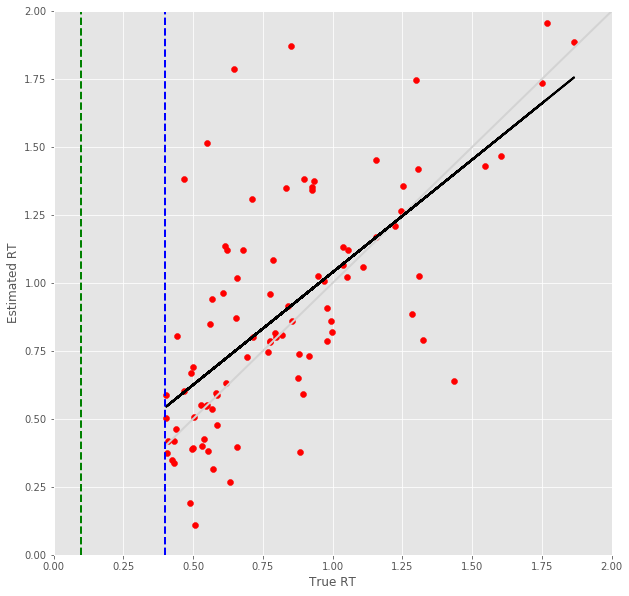

14 -step(s) forecast:
Test Score for 14 -steps forecast: 1.6839 RMSE
Predict Score for 14 -steps forecast: 2.4099 RMSE
Error Test Score for 14 -steps forecast: 0.4364 RMSE
RT Test Score for 14 -steps forecast: 0.4516 RMSE
Error Test Corr for 14 -steps forecast: 0.7047
RT Test Corr for 14 -steps forecast: 0.4810


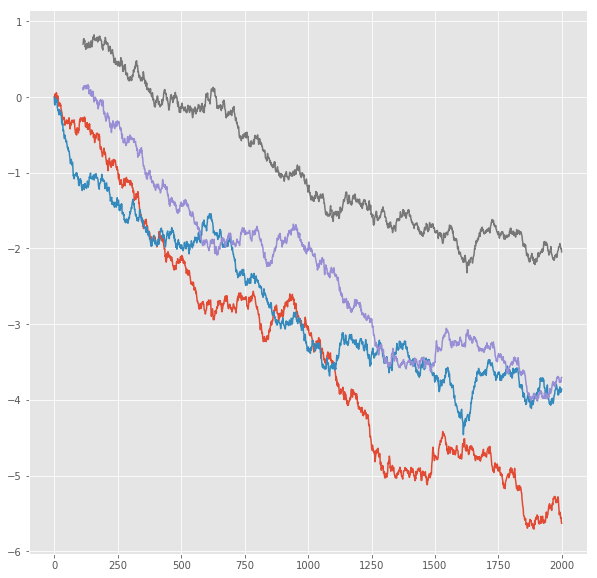

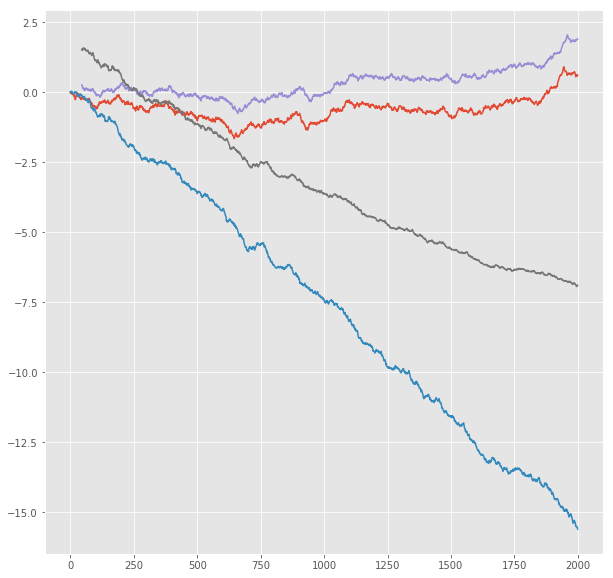

R^2 score for regression on Error: 0.4966
k = 0.8891


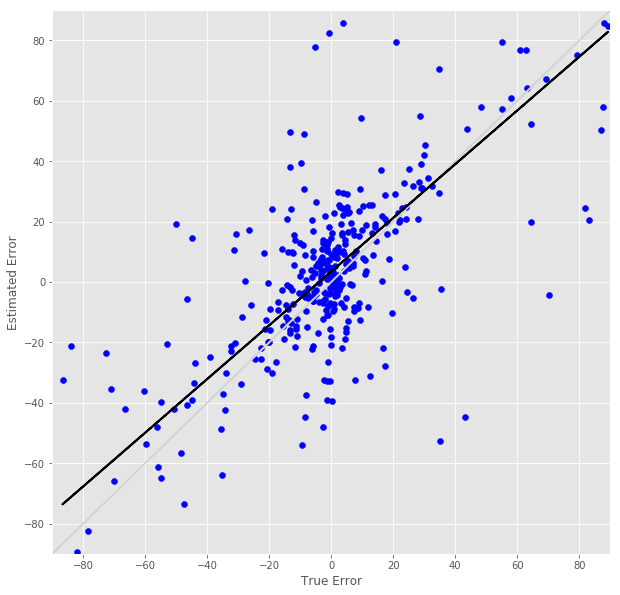

R^2 score for regression on RT: 0.2313
k = 0.5419


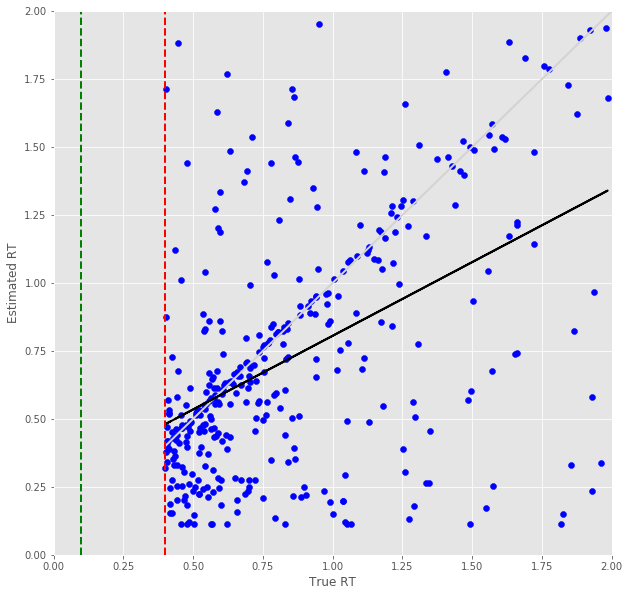

Error Prediction Score: 0.2875 RMSE
RT Prediction Score: 0.3374 RMSE
Error Prediction Corr: 0.8770
RT Prediction Corr: 0.6547
R^2 score for regression on Error: 0.7691
k = 1.0390


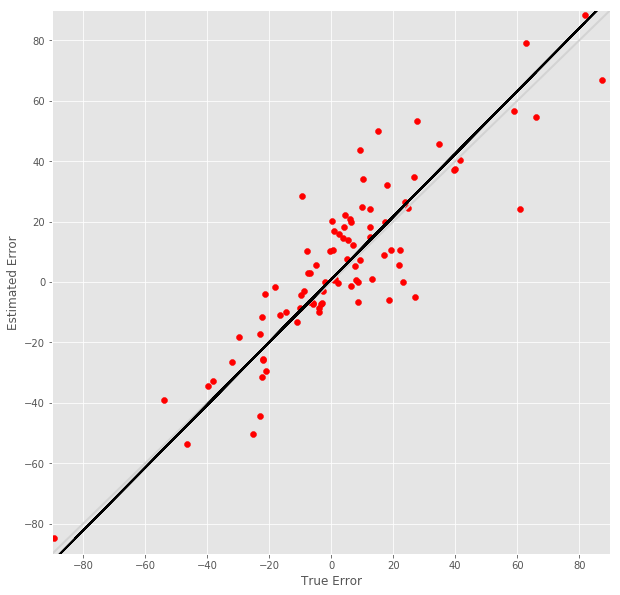

R^2 score for regression on RT: 0.4286
k = 0.8317


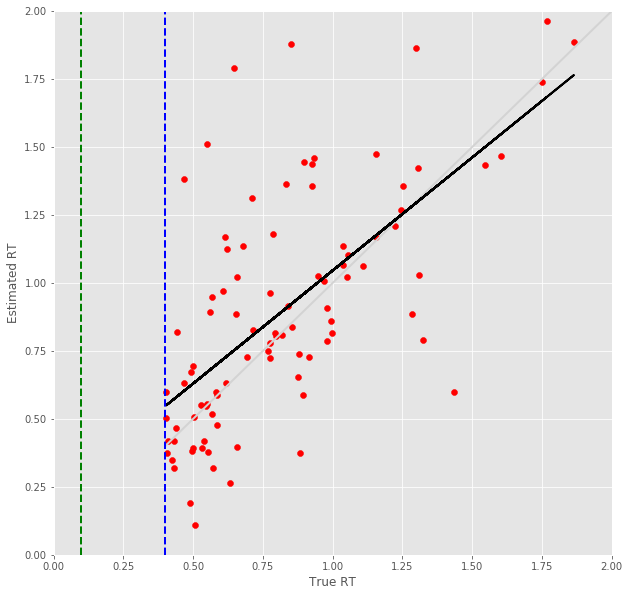

15 -step(s) forecast:
Test Score for 15 -steps forecast: 1.7846 RMSE
Predict Score for 15 -steps forecast: 2.5575 RMSE
Error Test Score for 15 -steps forecast: 0.4421 RMSE
RT Test Score for 15 -steps forecast: 0.4614 RMSE
Error Test Corr for 15 -steps forecast: 0.7003
RT Test Corr for 15 -steps forecast: 0.4631


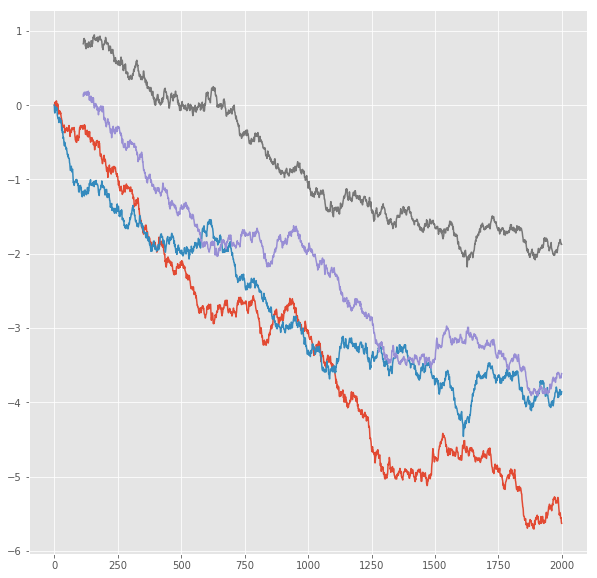

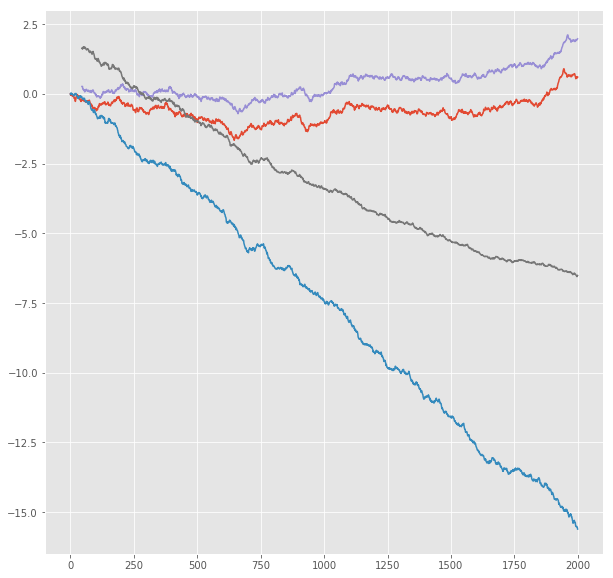

R^2 score for regression on Error: 0.4904
k = 0.8917


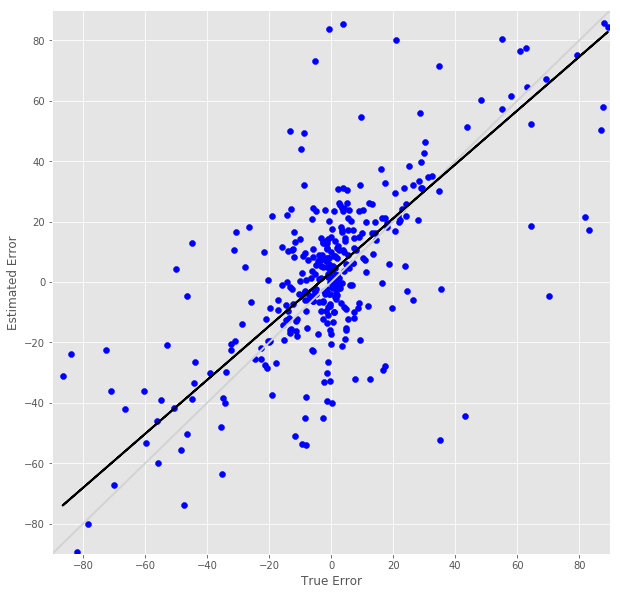

R^2 score for regression on RT: 0.2145
k = 0.5184


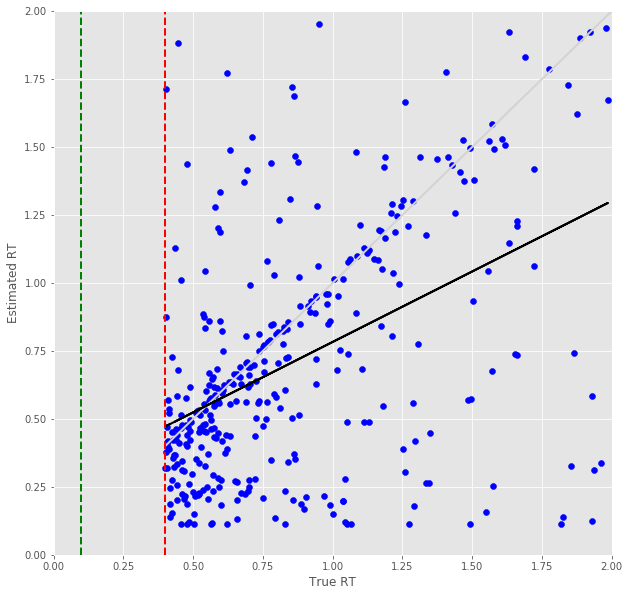

Error Prediction Score: 0.2919 RMSE
RT Prediction Score: 0.3885 RMSE
Error Prediction Corr: 0.8733
RT Prediction Corr: 0.5900
R^2 score for regression on Error: 0.7627
k = 1.0360


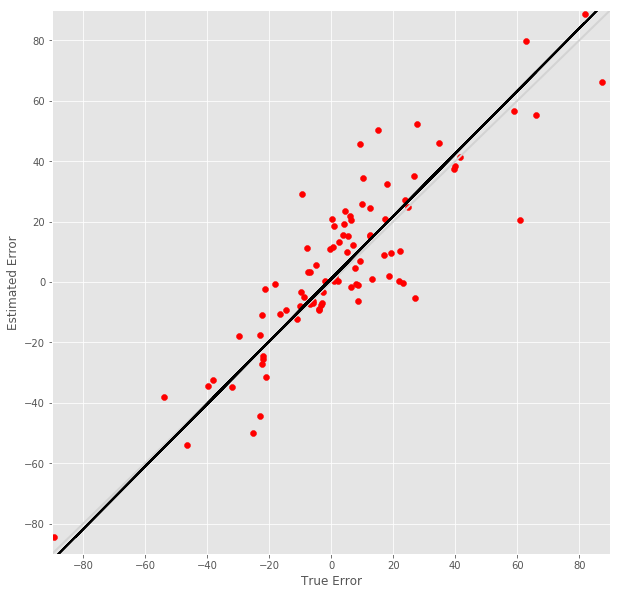

R^2 score for regression on RT: 0.3481
k = 0.8032


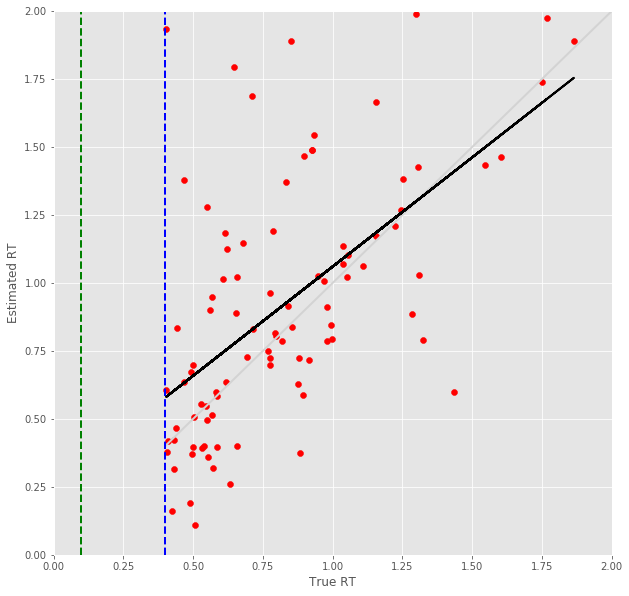

16 -step(s) forecast:
Test Score for 16 -steps forecast: 1.8838 RMSE
Predict Score for 16 -steps forecast: 2.7044 RMSE
Error Test Score for 16 -steps forecast: 0.4554 RMSE
RT Test Score for 16 -steps forecast: 0.4755 RMSE
Error Test Corr for 16 -steps forecast: 0.6762
RT Test Corr for 16 -steps forecast: 0.4368


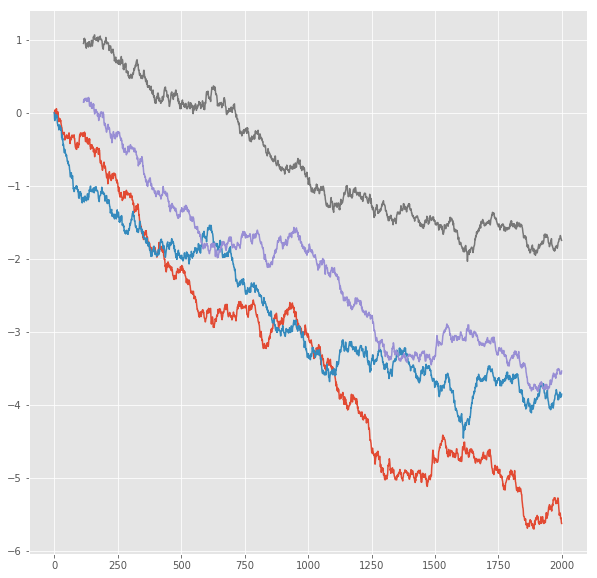

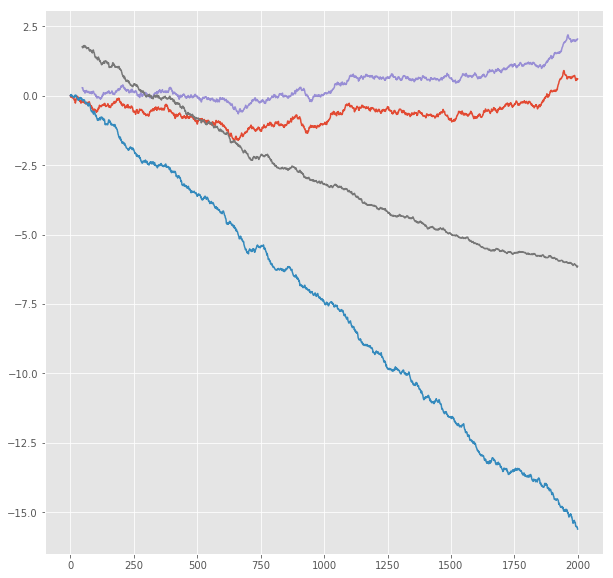

R^2 score for regression on Error: 0.4572
k = 0.8593


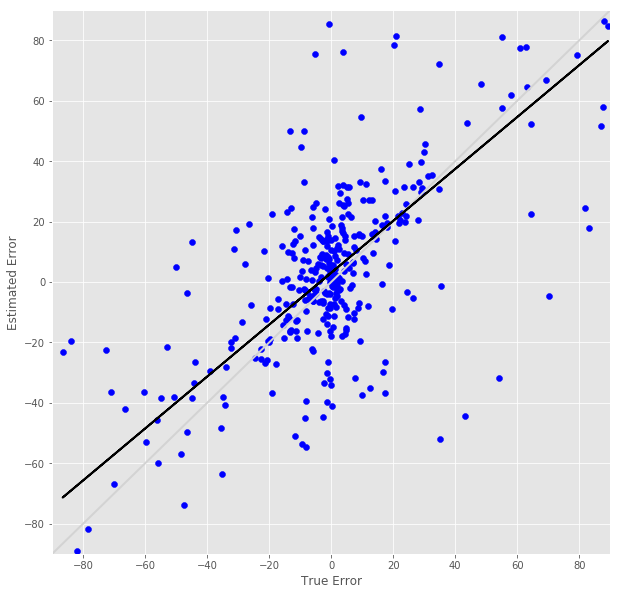

R^2 score for regression on RT: 0.1908
k = 0.4912


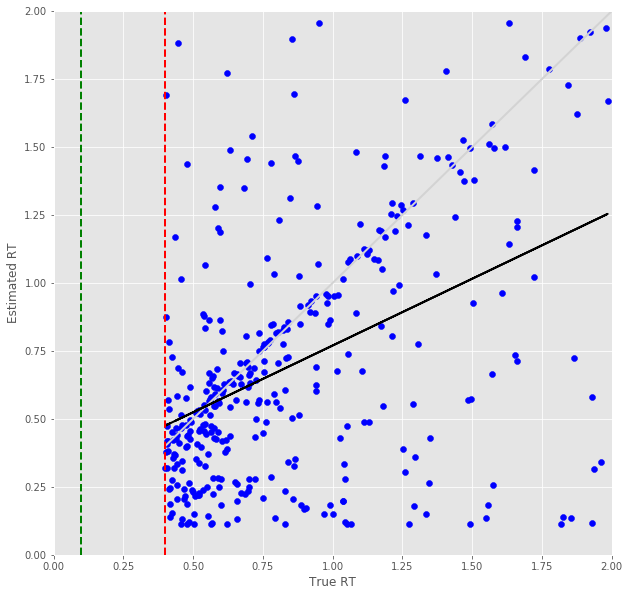

Error Prediction Score: 0.3338 RMSE
RT Prediction Score: 0.3558 RMSE
Error Prediction Corr: 0.8342
RT Prediction Corr: 0.6310
R^2 score for regression on Error: 0.6958
k = 0.9844


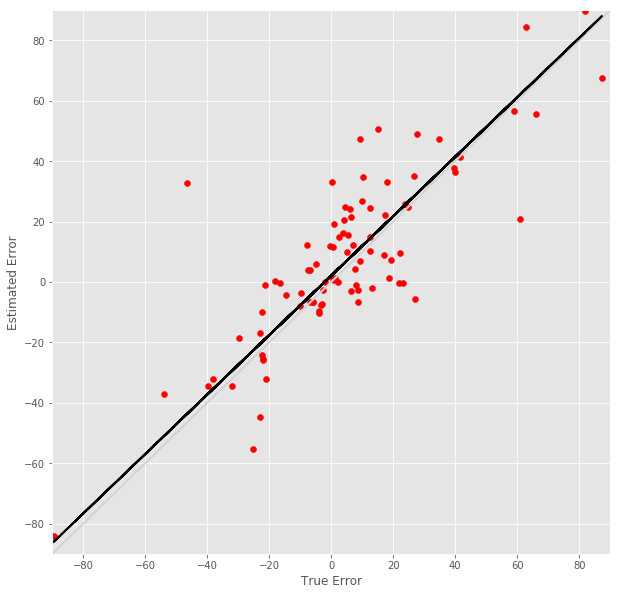

R^2 score for regression on RT: 0.3981
k = 0.8453


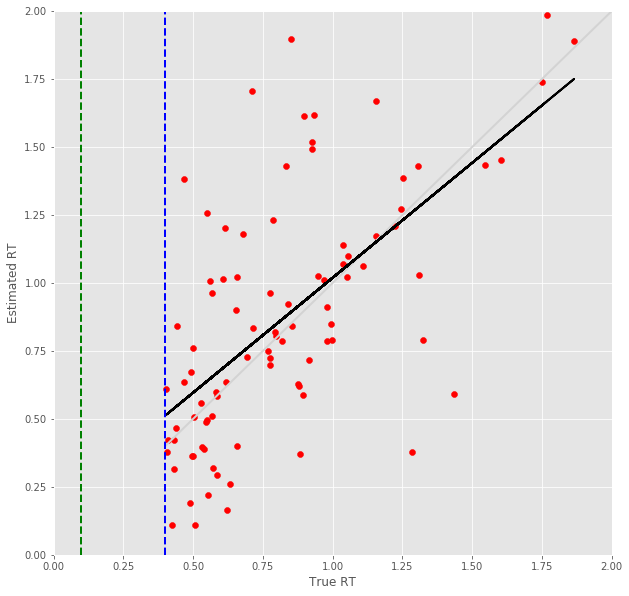

17 -step(s) forecast:
Test Score for 17 -steps forecast: 1.9816 RMSE
Predict Score for 17 -steps forecast: 2.8512 RMSE
Error Test Score for 17 -steps forecast: 0.4672 RMSE
RT Test Score for 17 -steps forecast: 0.4896 RMSE
Error Test Corr for 17 -steps forecast: 0.6750
RT Test Corr for 17 -steps forecast: 0.4089


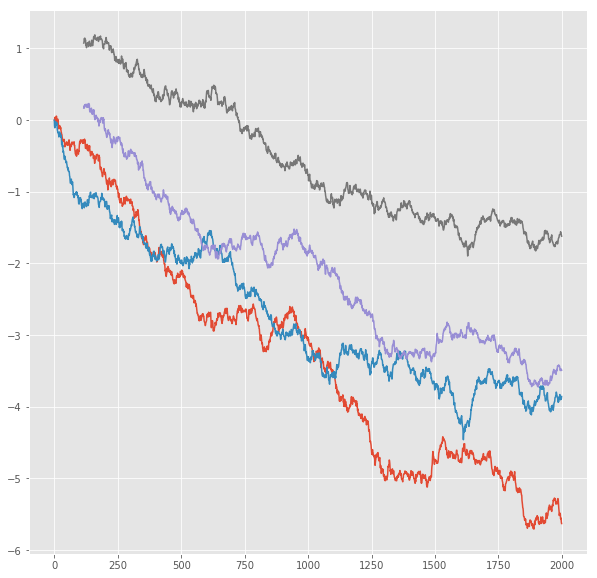

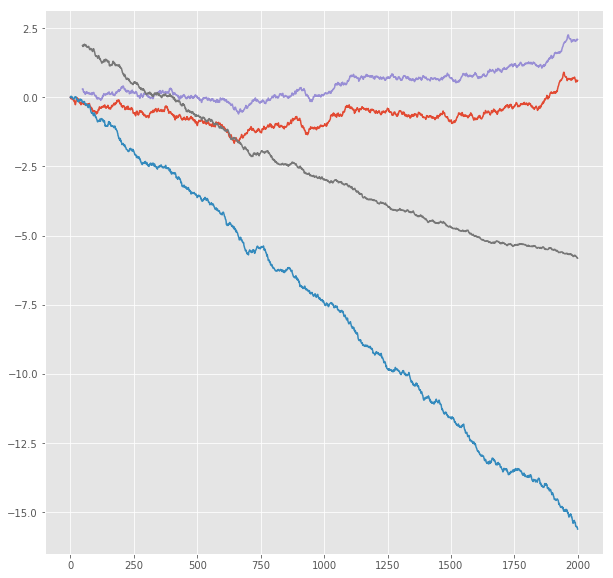

R^2 score for regression on Error: 0.4556
k = 0.8793


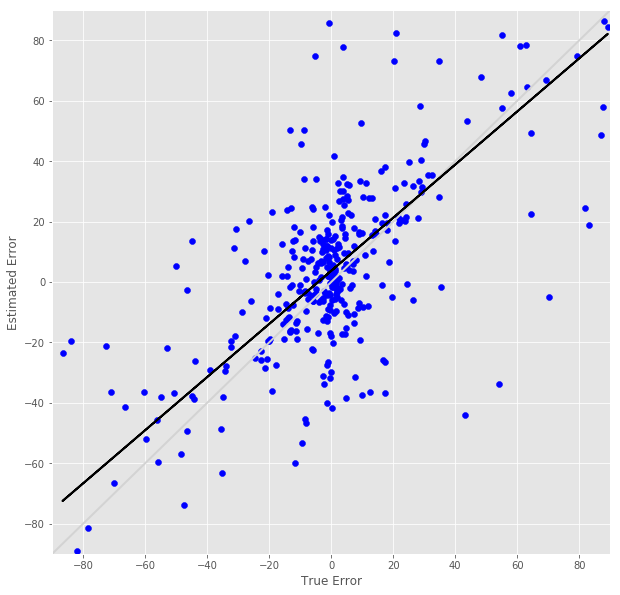

R^2 score for regression on RT: 0.1672
k = 0.4578


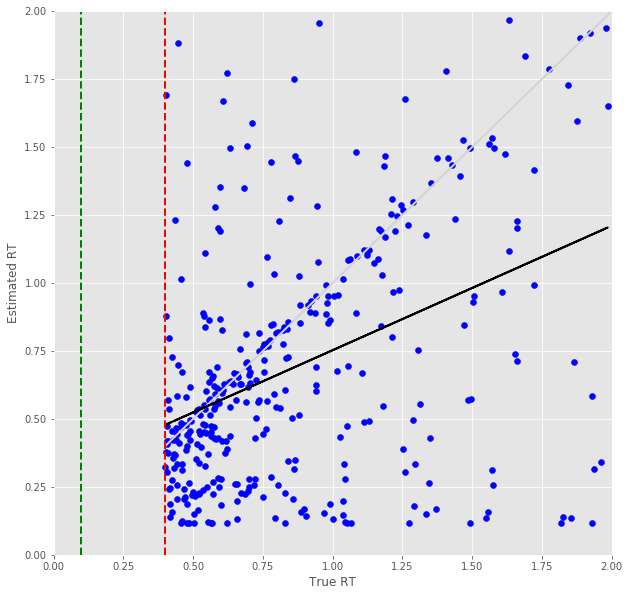

Error Prediction Score: 0.3287 RMSE
RT Prediction Score: 0.3573 RMSE
Error Prediction Corr: 0.8384
RT Prediction Corr: 0.5945
R^2 score for regression on Error: 0.7029
k = 0.9784


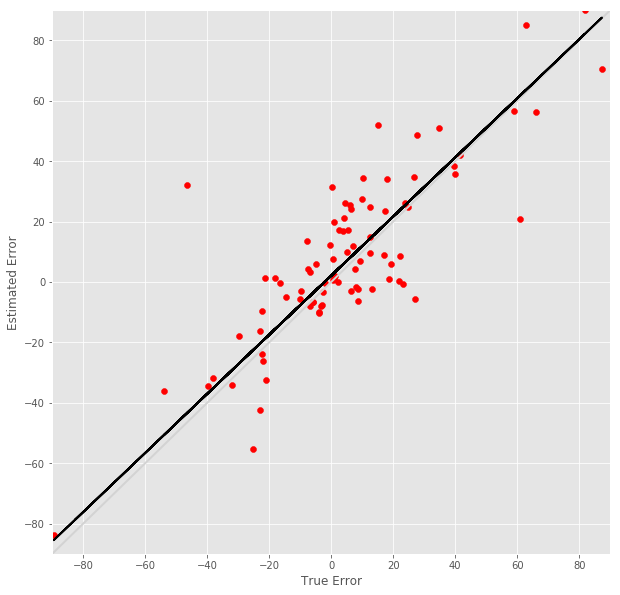

R^2 score for regression on RT: 0.3534
k = 0.7960


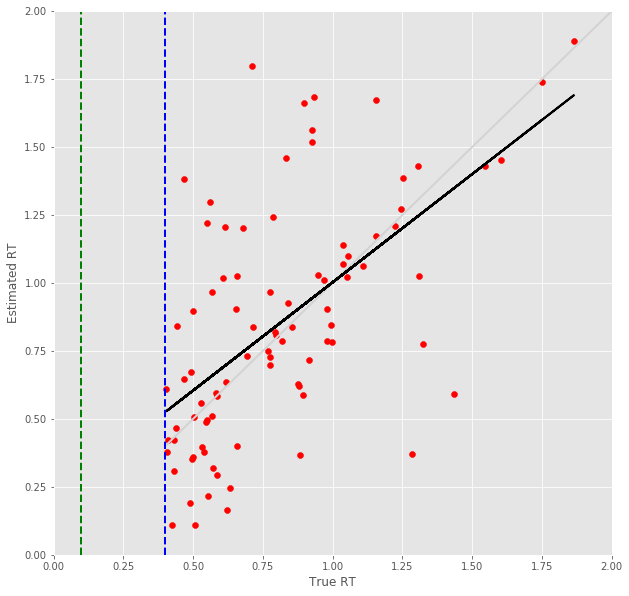

18 -step(s) forecast:
Test Score for 18 -steps forecast: 2.0781 RMSE
Predict Score for 18 -steps forecast: 2.9983 RMSE
Error Test Score for 18 -steps forecast: 0.4851 RMSE
RT Test Score for 18 -steps forecast: 0.5087 RMSE
Error Test Corr for 18 -steps forecast: 0.6537
RT Test Corr for 18 -steps forecast: 0.3772


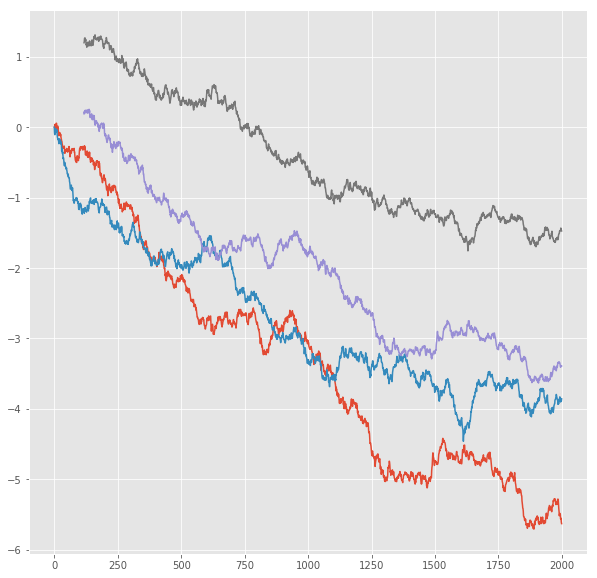

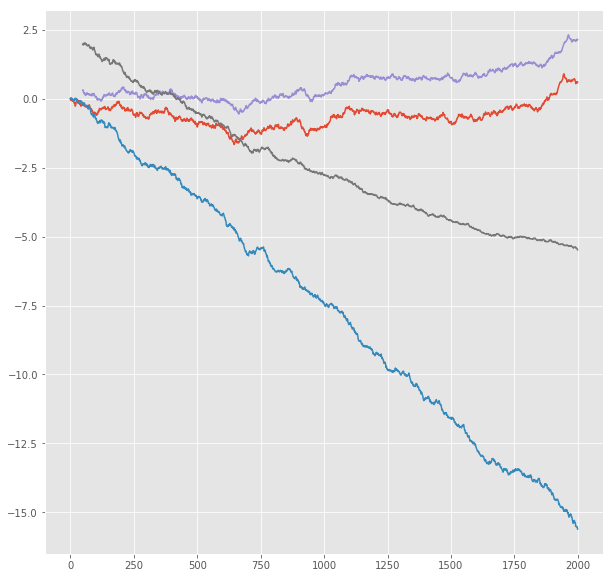

R^2 score for regression on Error: 0.4273
k = 0.8611


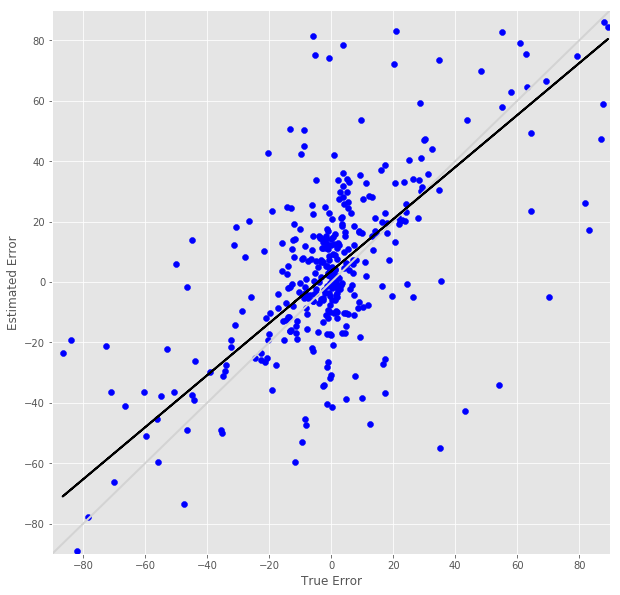

R^2 score for regression on RT: 0.1423
k = 0.4316


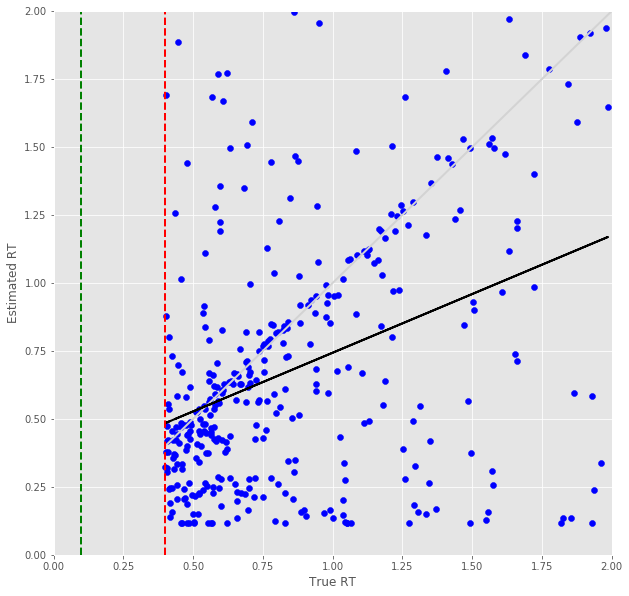

Error Prediction Score: 0.3366 RMSE
RT Prediction Score: 0.3805 RMSE
Error Prediction Corr: 0.8328
RT Prediction Corr: 0.5604
R^2 score for regression on Error: 0.6935
k = 0.9722


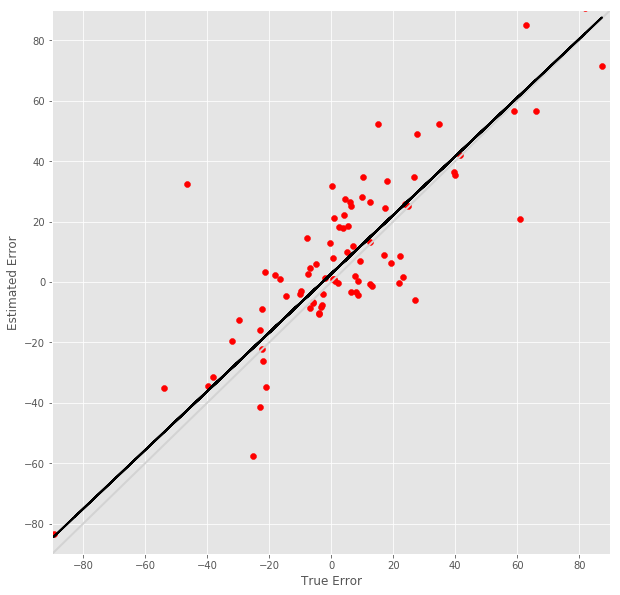

R^2 score for regression on RT: 0.3140
k = 0.7772


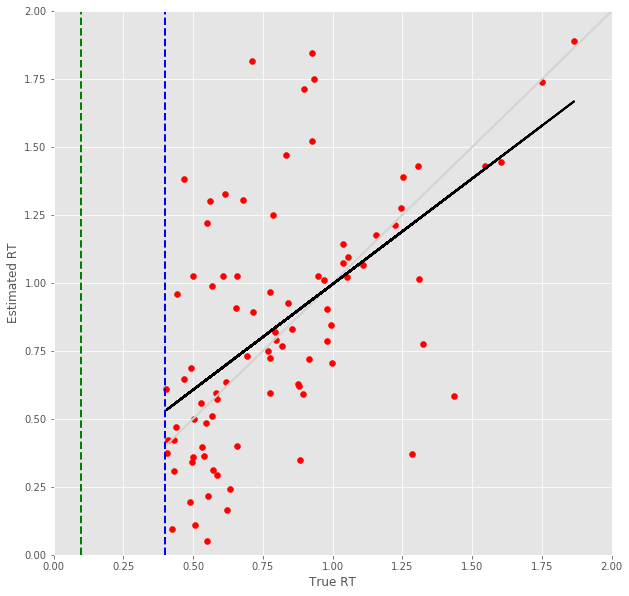

19 -step(s) forecast:
Test Score for 19 -steps forecast: 2.1732 RMSE
Predict Score for 19 -steps forecast: 3.1461 RMSE
Error Test Score for 19 -steps forecast: 0.4884 RMSE
RT Test Score for 19 -steps forecast: 0.5183 RMSE
Error Test Corr for 19 -steps forecast: 0.6587
RT Test Corr for 19 -steps forecast: 0.3622


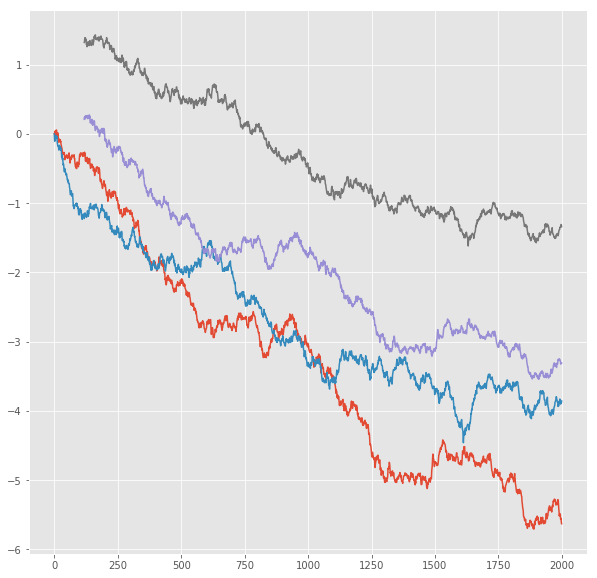

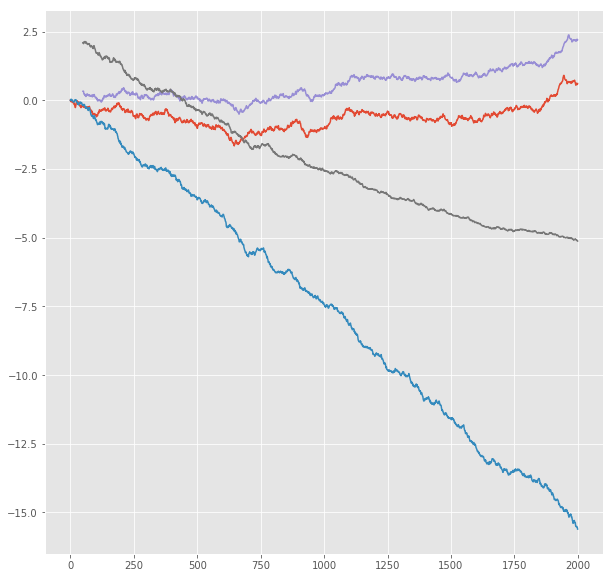

R^2 score for regression on Error: 0.4339
k = 0.8802


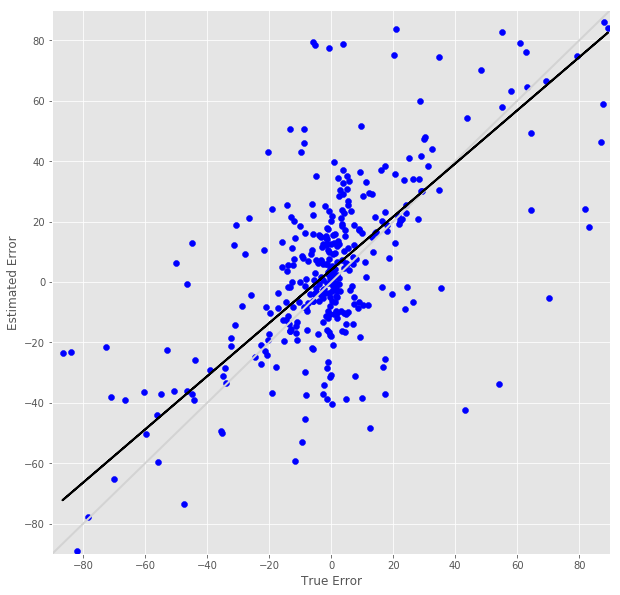

R^2 score for regression on RT: 0.1312
k = 0.4171


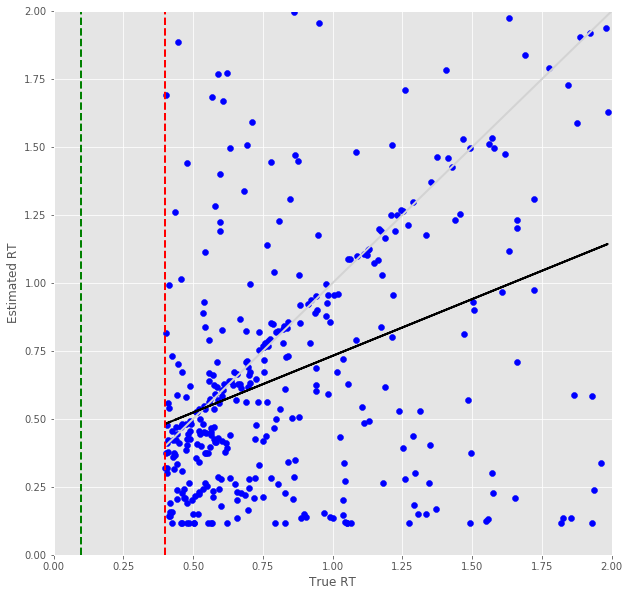

Error Prediction Score: 0.3456 RMSE
RT Prediction Score: 0.3977 RMSE
Error Prediction Corr: 0.8255
RT Prediction Corr: 0.5337
R^2 score for regression on Error: 0.6815
k = 0.9703


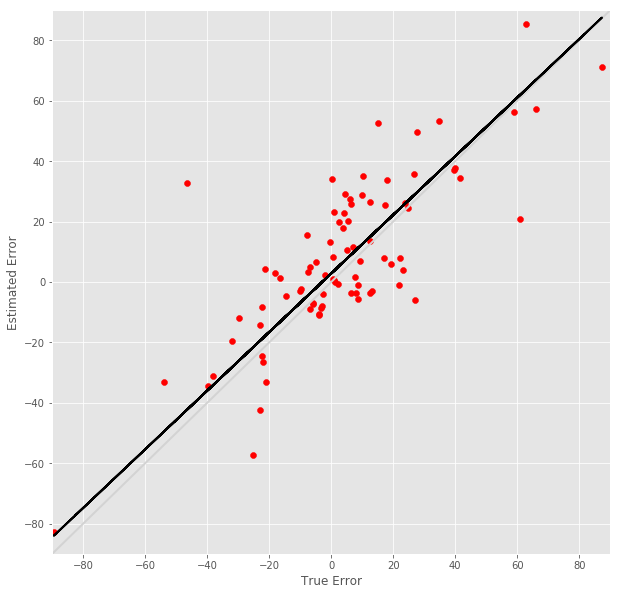

R^2 score for regression on RT: 0.2848
k = 0.7574


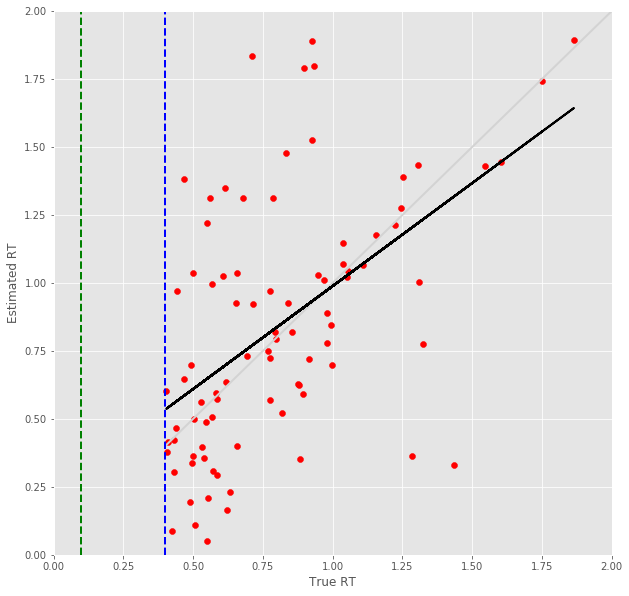

20 -step(s) forecast:
Test Score for 20 -steps forecast: 2.2670 RMSE
Predict Score for 20 -steps forecast: 3.2956 RMSE
Error Test Score for 20 -steps forecast: 0.5004 RMSE
RT Test Score for 20 -steps forecast: 0.5236 RMSE
Error Test Corr for 20 -steps forecast: 0.6480
RT Test Corr for 20 -steps forecast: 0.3583


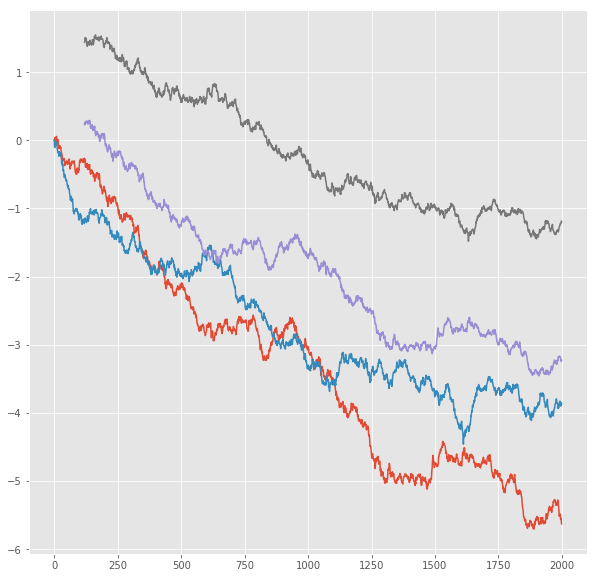

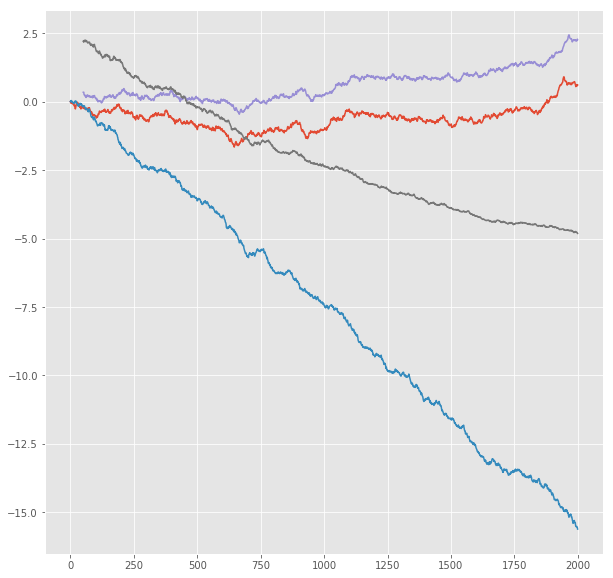

R^2 score for regression on Error: 0.4199
k = 0.8739


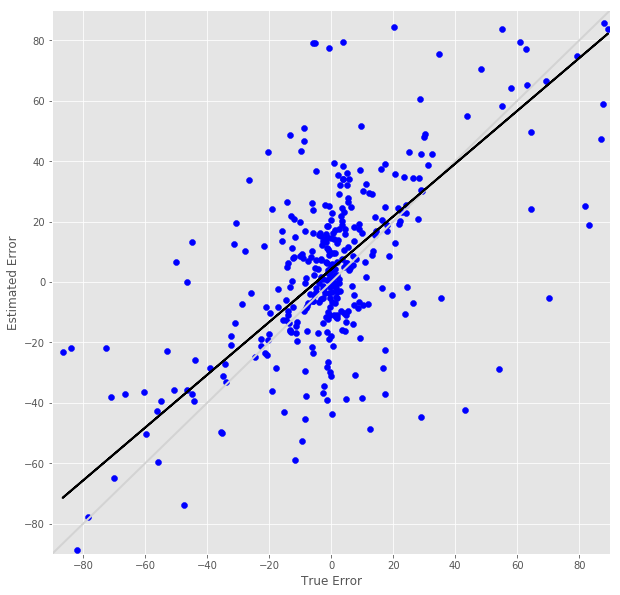

R^2 score for regression on RT: 0.1284
k = 0.4075


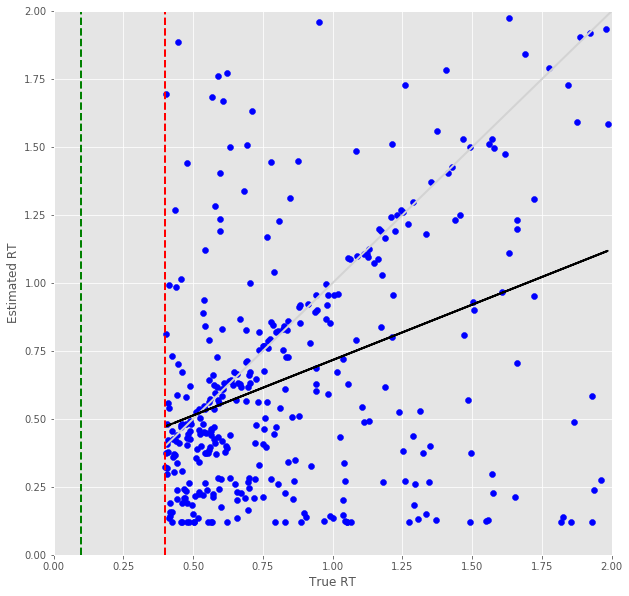

Error Prediction Score: 0.3550 RMSE
RT Prediction Score: 0.4229 RMSE
Error Prediction Corr: 0.8202
RT Prediction Corr: 0.4915
R^2 score for regression on Error: 0.6727
k = 0.9763


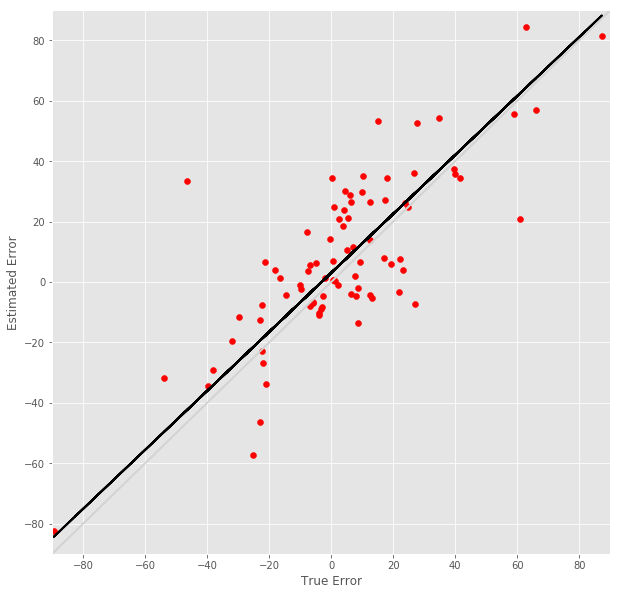

R^2 score for regression on RT: 0.2415
k = 0.7186


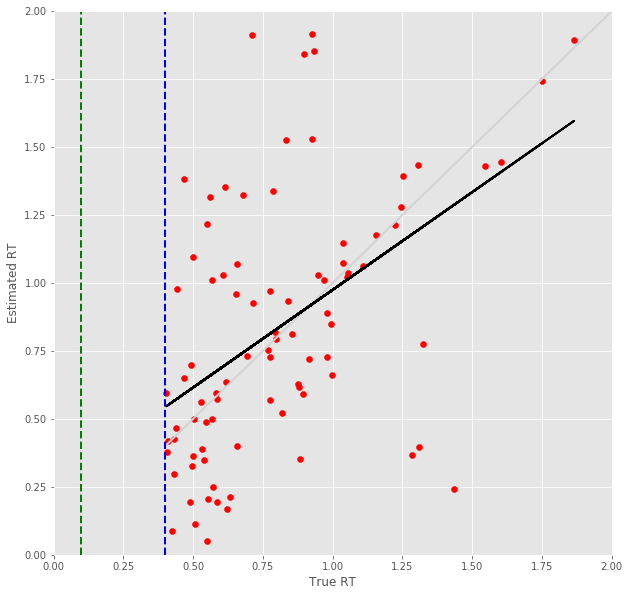

21 -step(s) forecast:
Test Score for 21 -steps forecast: 2.3596 RMSE
Predict Score for 21 -steps forecast: 3.4473 RMSE
Error Test Score for 21 -steps forecast: 0.5131 RMSE
RT Test Score for 21 -steps forecast: 0.5399 RMSE
Error Test Corr for 21 -steps forecast: 0.6356
RT Test Corr for 21 -steps forecast: 0.3146


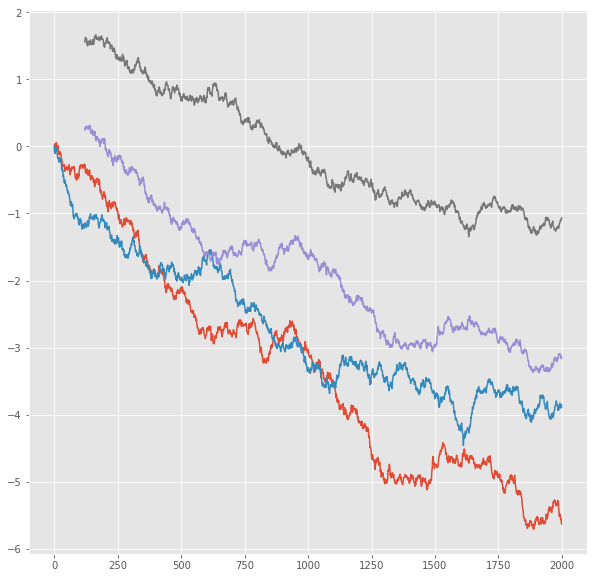

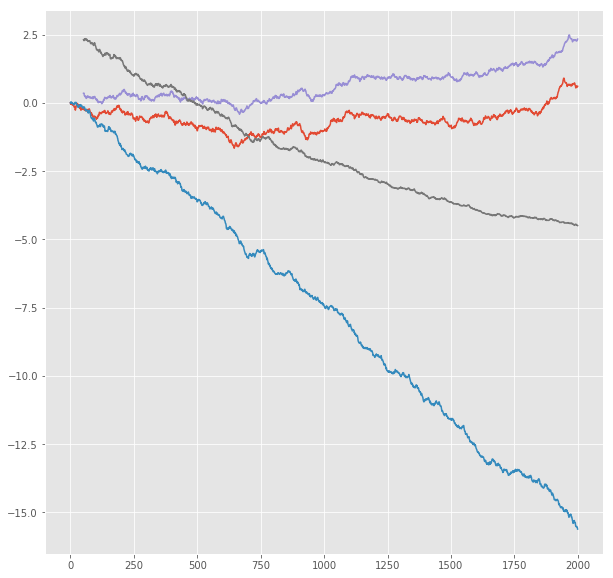

R^2 score for regression on Error: 0.4040
k = 0.8720


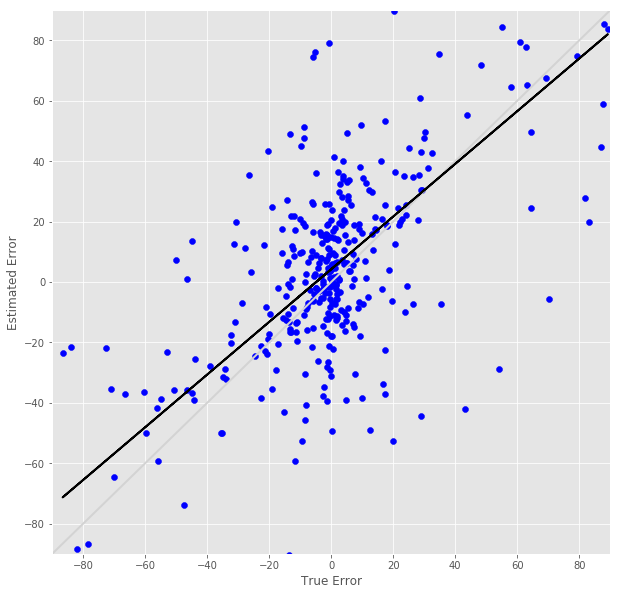

R^2 score for regression on RT: 0.0990
k = 0.3537


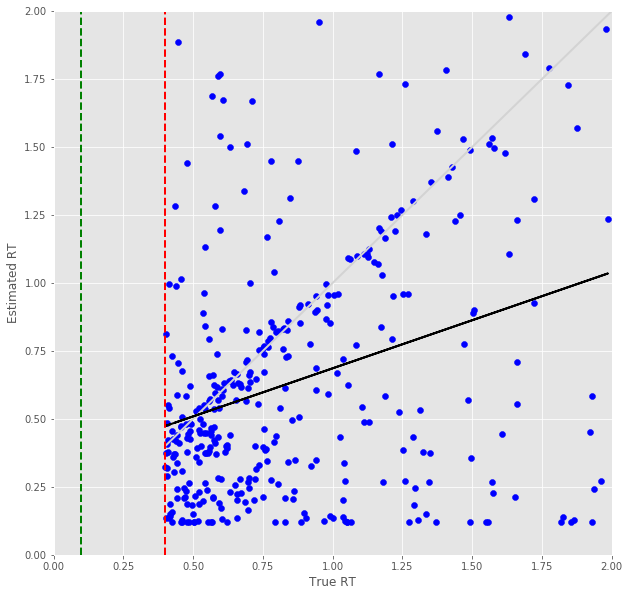

Error Prediction Score: 0.3702 RMSE
RT Prediction Score: 0.4466 RMSE
Error Prediction Corr: 0.8082
RT Prediction Corr: 0.4640
R^2 score for regression on Error: 0.6532
k = 0.9756


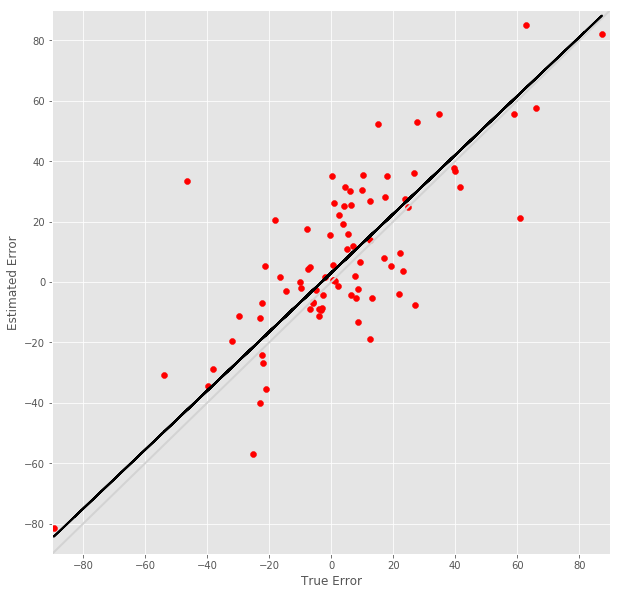

R^2 score for regression on RT: 0.2153
k = 0.7035


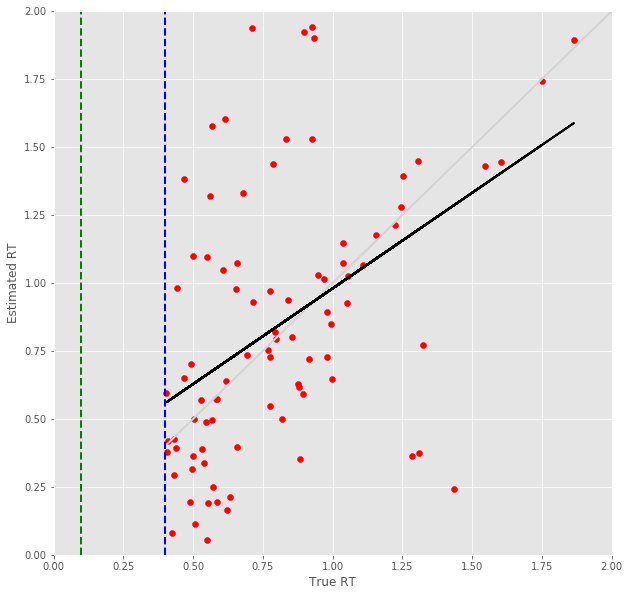

22 -step(s) forecast:
Test Score for 22 -steps forecast: 2.4510 RMSE
Predict Score for 22 -steps forecast: 3.6023 RMSE
Error Test Score for 22 -steps forecast: 0.5130 RMSE
RT Test Score for 22 -steps forecast: 0.5466 RMSE
Error Test Corr for 22 -steps forecast: 0.6224
RT Test Corr for 22 -steps forecast: 0.3065


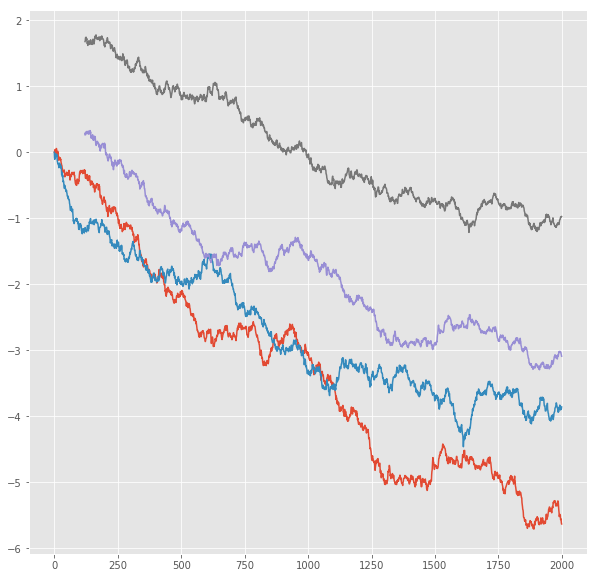

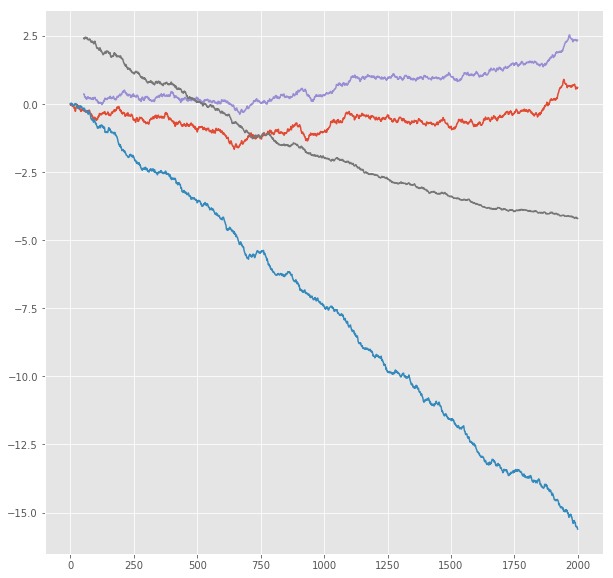

R^2 score for regression on Error: 0.3873
k = 0.8361


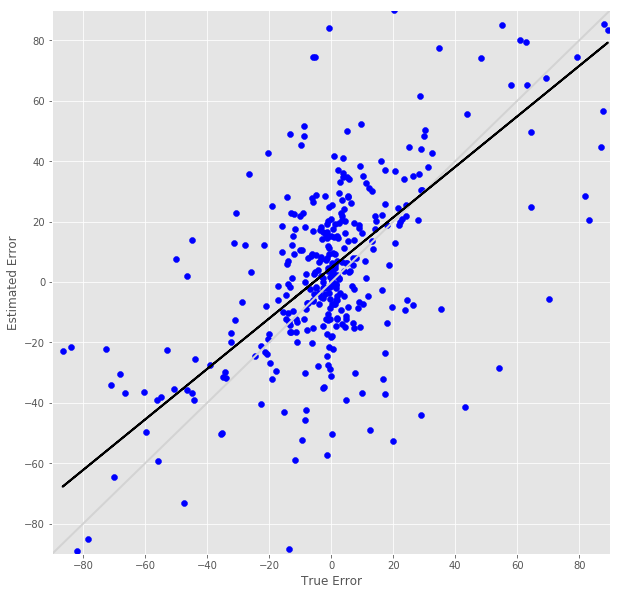

R^2 score for regression on RT: 0.0939
k = 0.3443


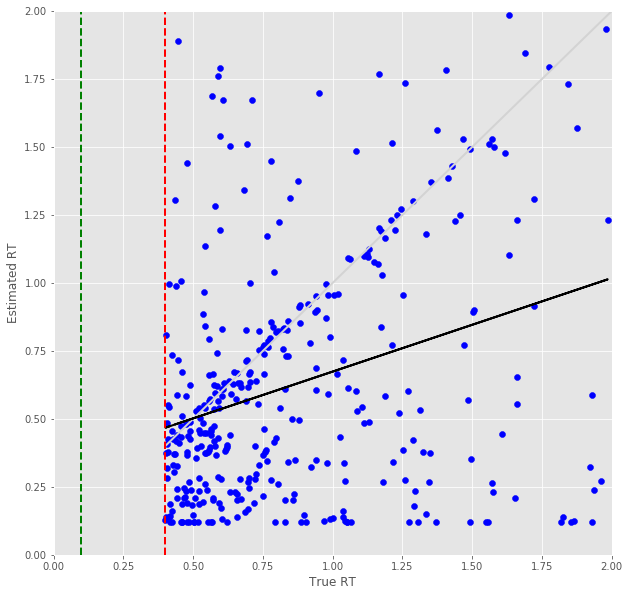

Error Prediction Score: 0.3781 RMSE
RT Prediction Score: 0.4351 RMSE
Error Prediction Corr: 0.8196
RT Prediction Corr: 0.4726
R^2 score for regression on Error: 0.6717
k = 0.9870


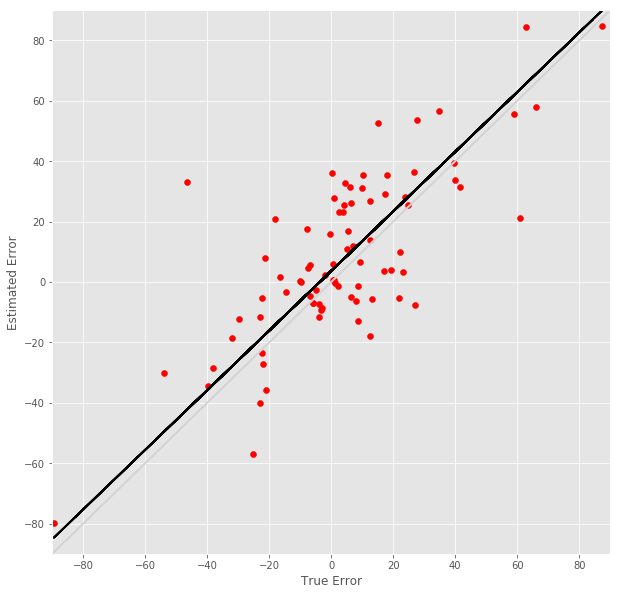

R^2 score for regression on RT: 0.2234
k = 0.6920


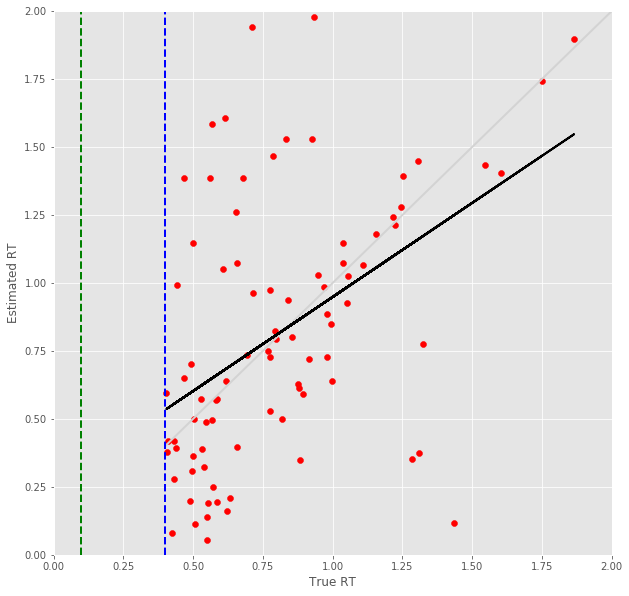

23 -step(s) forecast:
Test Score for 23 -steps forecast: 2.5412 RMSE
Predict Score for 23 -steps forecast: 3.7615 RMSE
Error Test Score for 23 -steps forecast: 0.5216 RMSE
RT Test Score for 23 -steps forecast: 0.5503 RMSE
Error Test Corr for 23 -steps forecast: 0.6220
RT Test Corr for 23 -steps forecast: 0.2997


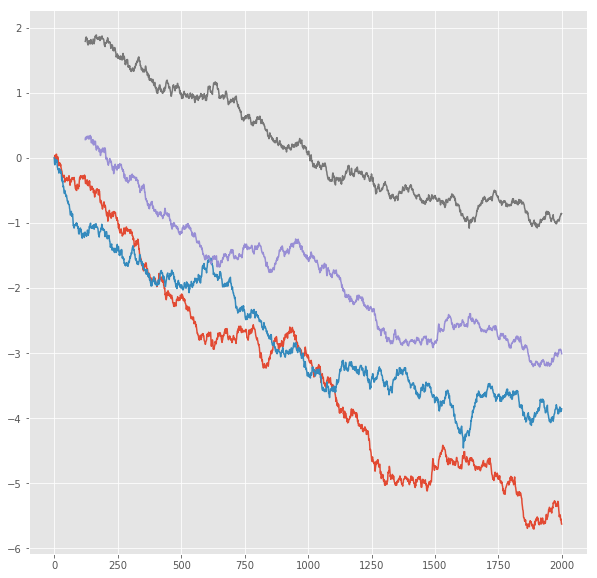

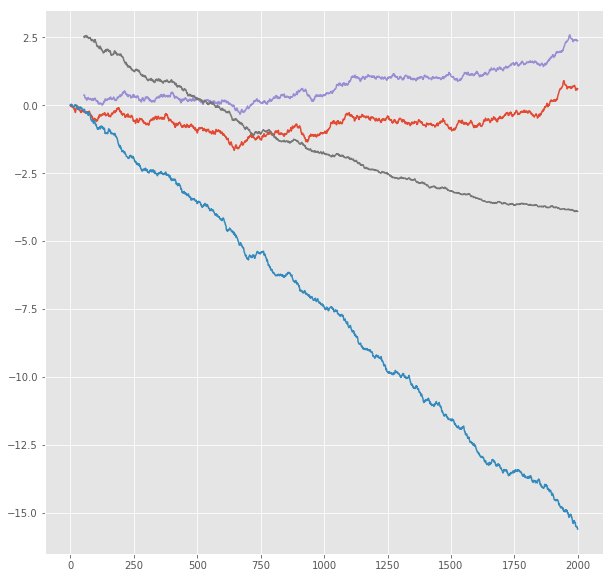

R^2 score for regression on Error: 0.3869
k = 0.8430


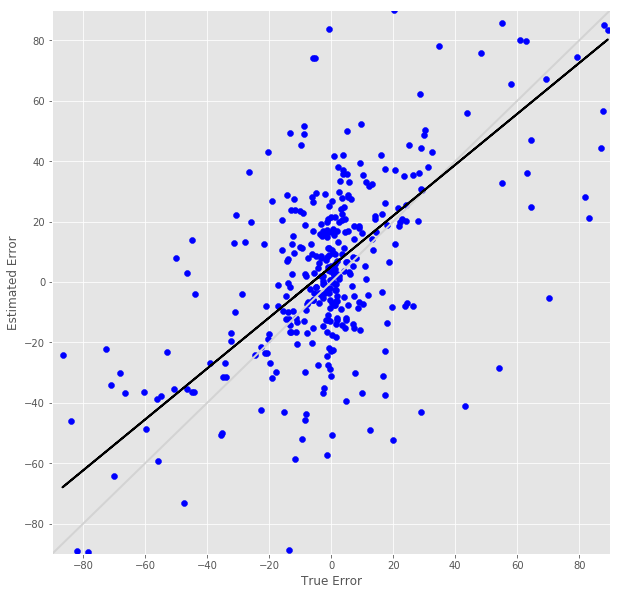

R^2 score for regression on RT: 0.0898
k = 0.3262


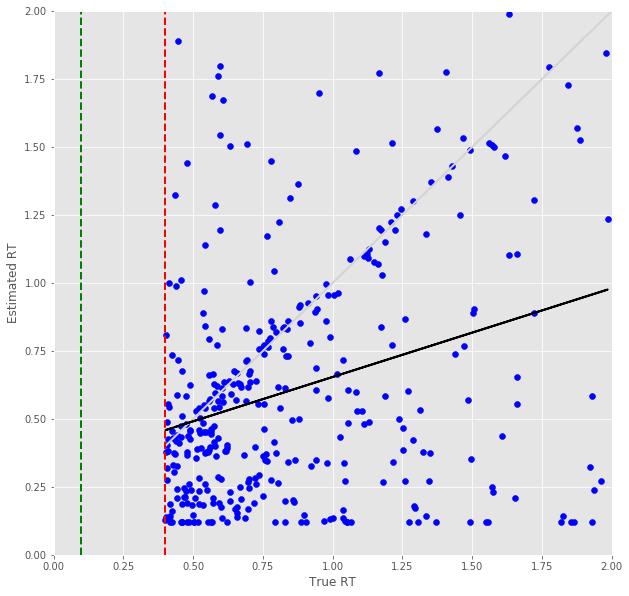

Error Prediction Score: 0.3894 RMSE
RT Prediction Score: 0.4576 RMSE
Error Prediction Corr: 0.8120
RT Prediction Corr: 0.3942
R^2 score for regression on Error: 0.6593
k = 0.9788


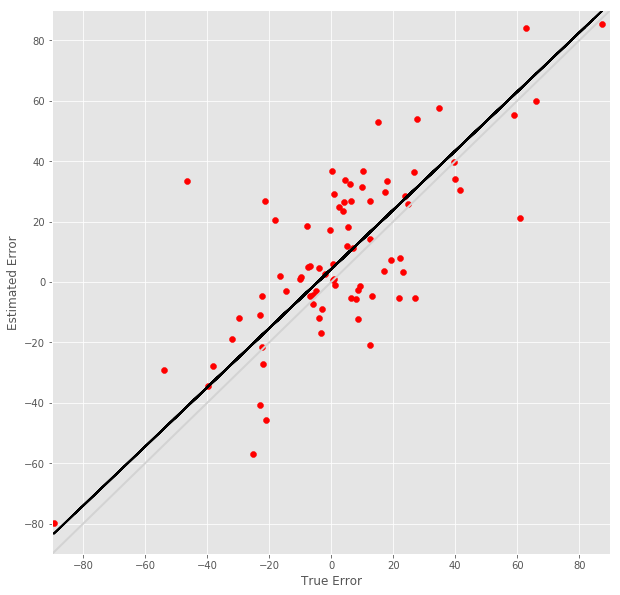

R^2 score for regression on RT: 0.1554
k = 0.5650


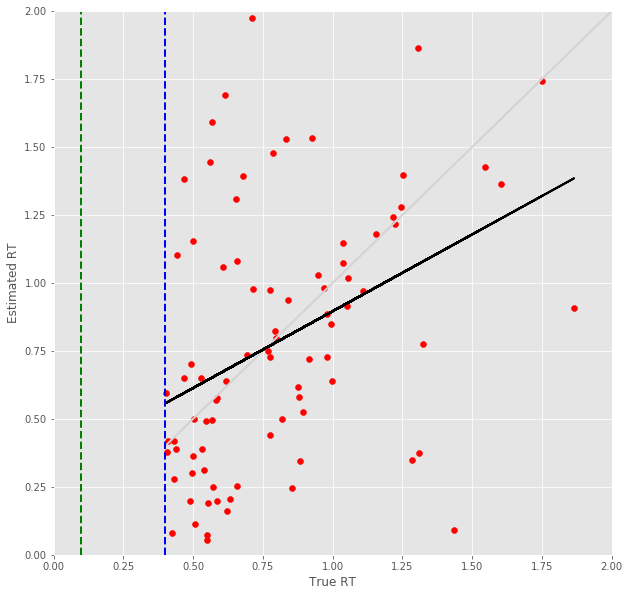

24 -step(s) forecast:
Test Score for 24 -steps forecast: 2.6304 RMSE
Predict Score for 24 -steps forecast: 3.9265 RMSE
Error Test Score for 24 -steps forecast: 0.5365 RMSE
RT Test Score for 24 -steps forecast: 0.5552 RMSE
Error Test Corr for 24 -steps forecast: 0.6130
RT Test Corr for 24 -steps forecast: 0.3061


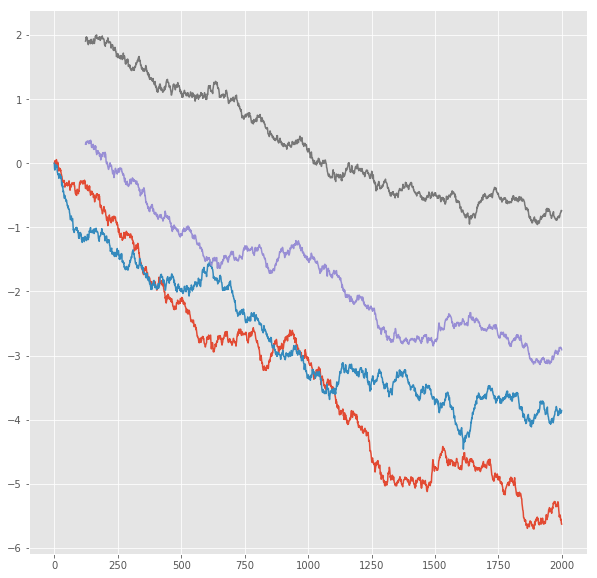

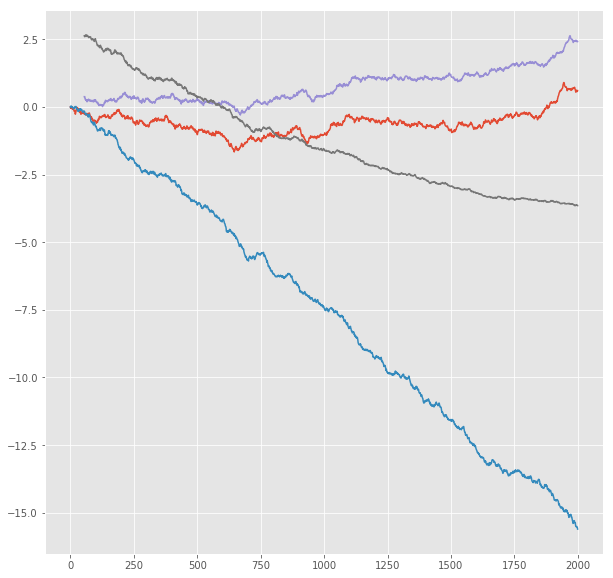

R^2 score for regression on Error: 0.3758
k = 0.8428


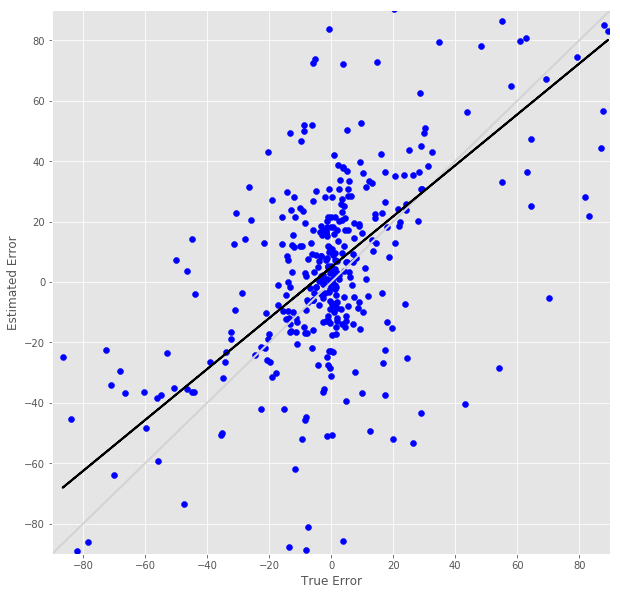

R^2 score for regression on RT: 0.0937
k = 0.3322


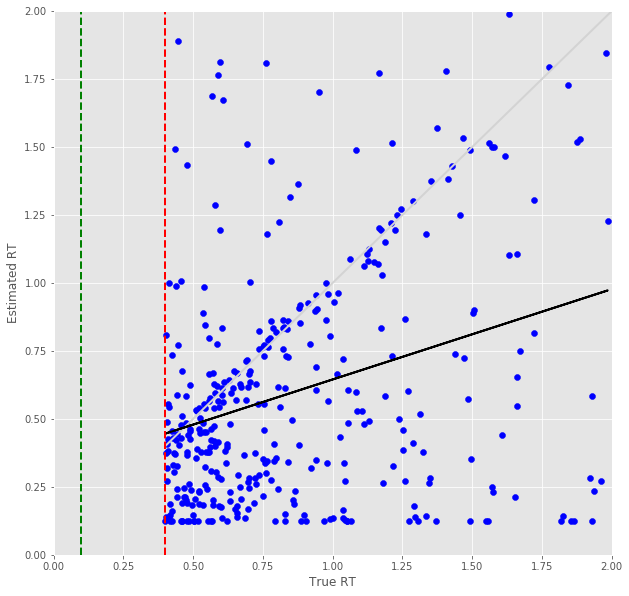

Error Prediction Score: 0.4455 RMSE
RT Prediction Score: 0.4738 RMSE
Error Prediction Corr: 0.7869
RT Prediction Corr: 0.3677
R^2 score for regression on Error: 0.6192
k = 1.0350


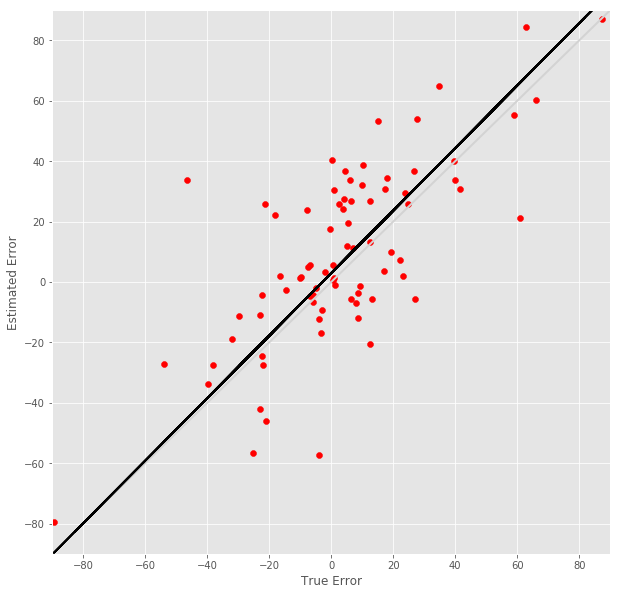

R^2 score for regression on RT: 0.1352
k = 0.5042


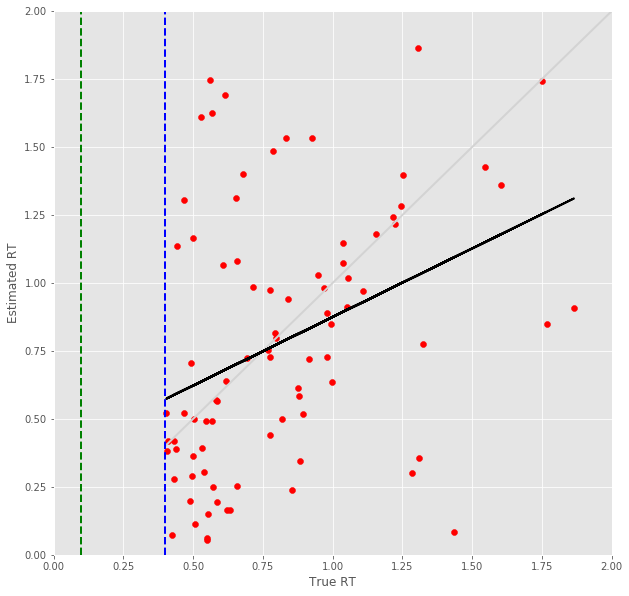

25 -step(s) forecast:
Test Score for 25 -steps forecast: 2.7186 RMSE
Predict Score for 25 -steps forecast: 4.0985 RMSE
Error Test Score for 25 -steps forecast: 0.5495 RMSE
RT Test Score for 25 -steps forecast: 0.5644 RMSE
Error Test Corr for 25 -steps forecast: 0.6036
RT Test Corr for 25 -steps forecast: 0.2771


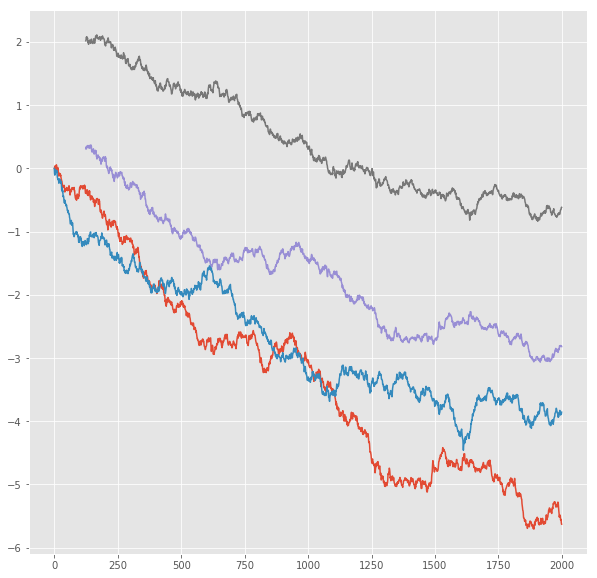

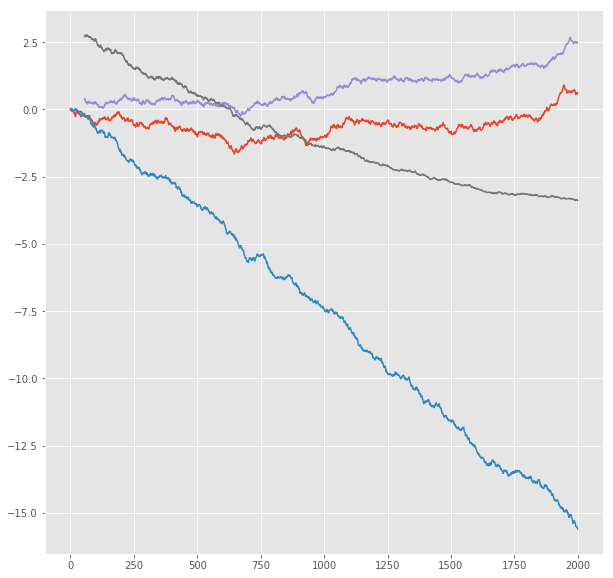

R^2 score for regression on Error: 0.3643
k = 0.8401


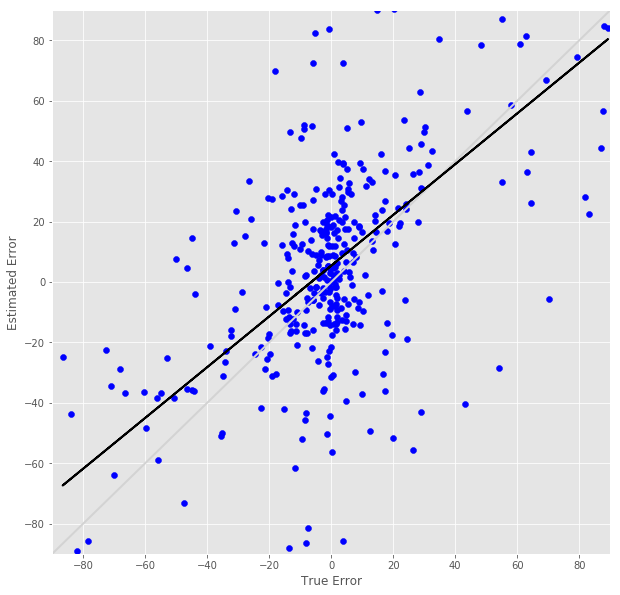

R^2 score for regression on RT: 0.0768
k = 0.3004


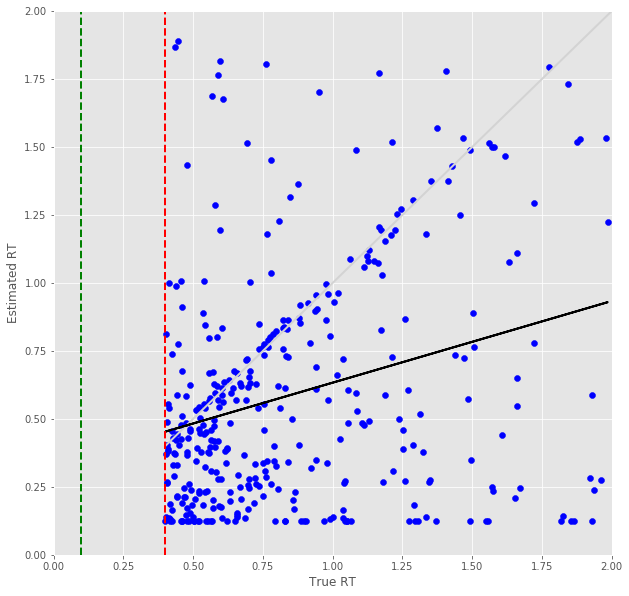

Error Prediction Score: 0.4624 RMSE
RT Prediction Score: 0.4658 RMSE
Error Prediction Corr: 0.7780
RT Prediction Corr: 0.3965
R^2 score for regression on Error: 0.6053
k = 1.0432


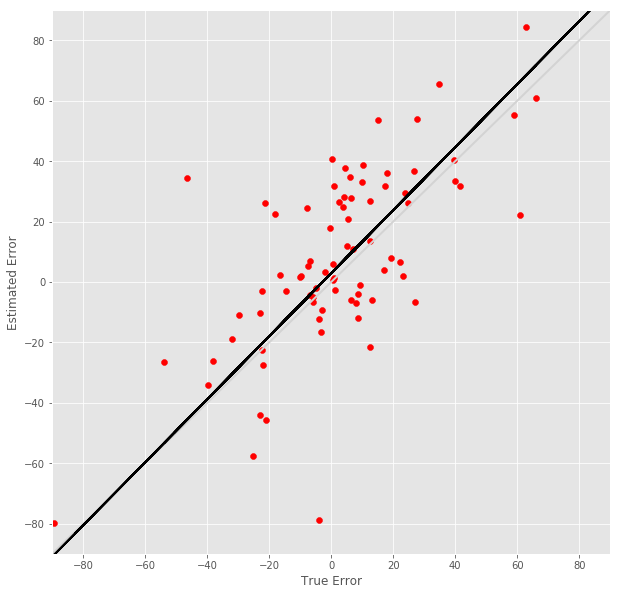

R^2 score for regression on RT: 0.1573
k = 0.5443


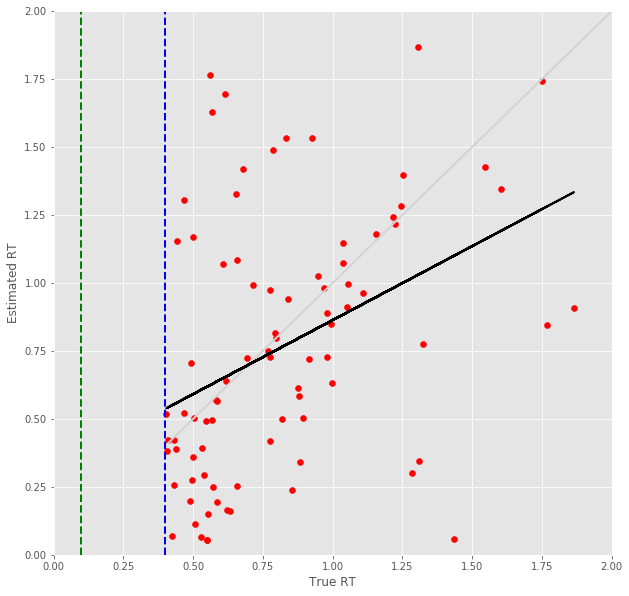

26 -step(s) forecast:
Test Score for 26 -steps forecast: 2.8058 RMSE
Predict Score for 26 -steps forecast: 4.2797 RMSE
Error Test Score for 26 -steps forecast: 0.5526 RMSE
RT Test Score for 26 -steps forecast: 0.5718 RMSE
Error Test Corr for 26 -steps forecast: 0.5928
RT Test Corr for 26 -steps forecast: 0.2724


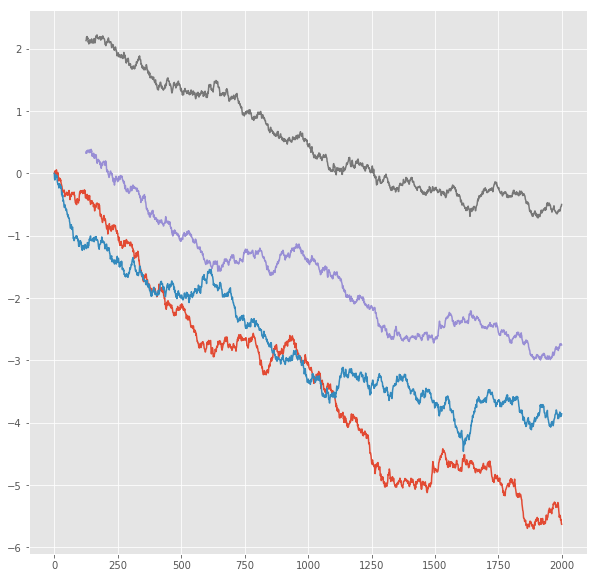

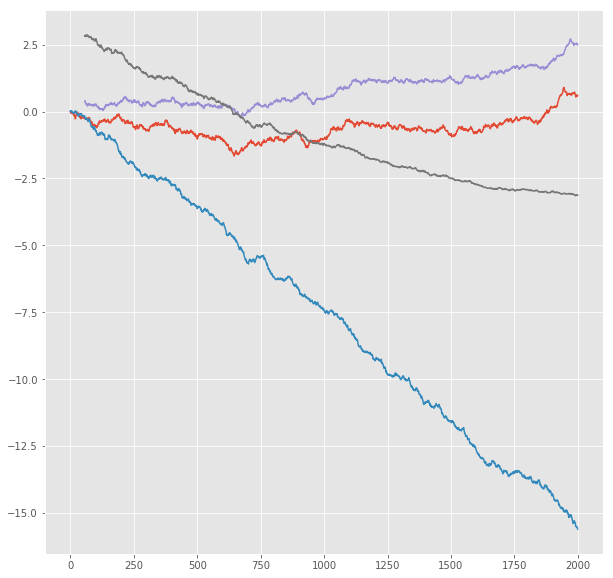

R^2 score for regression on Error: 0.3515
k = 0.8207


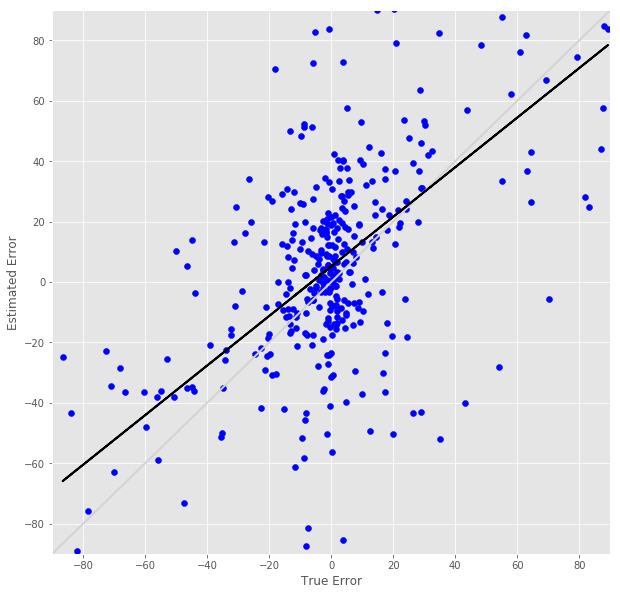

R^2 score for regression on RT: 0.0742
k = 0.2988


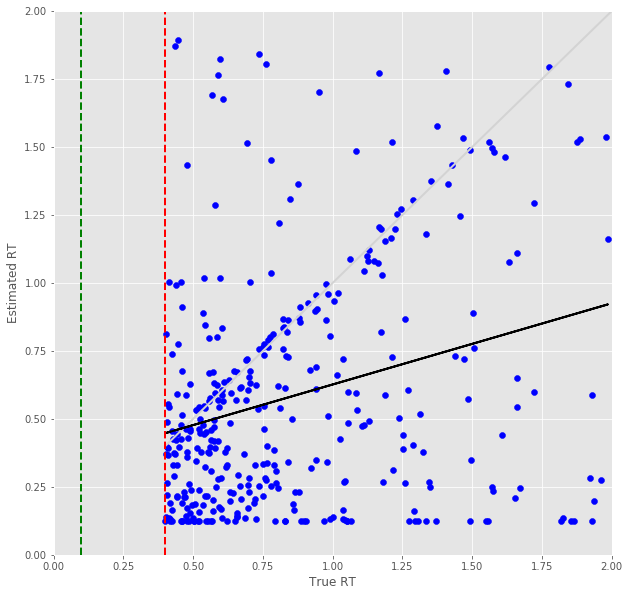

Error Prediction Score: 0.4660 RMSE
RT Prediction Score: 0.4603 RMSE
Error Prediction Corr: 0.7799
RT Prediction Corr: 0.4149
R^2 score for regression on Error: 0.6082
k = 1.0479


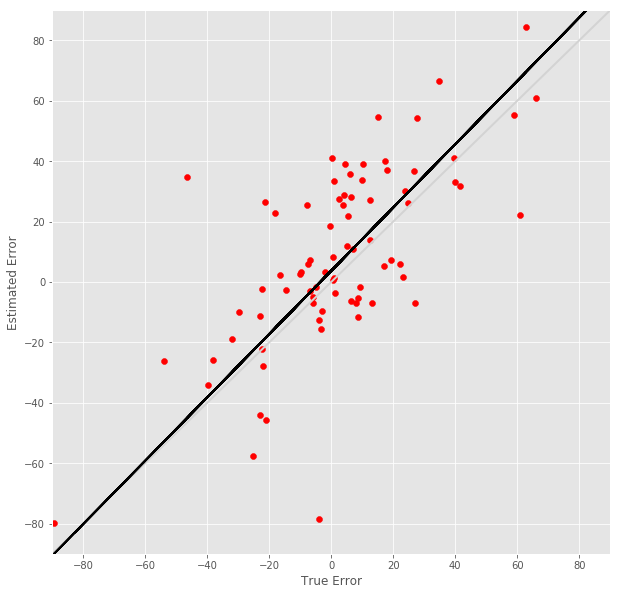

R^2 score for regression on RT: 0.1721
k = 0.5639


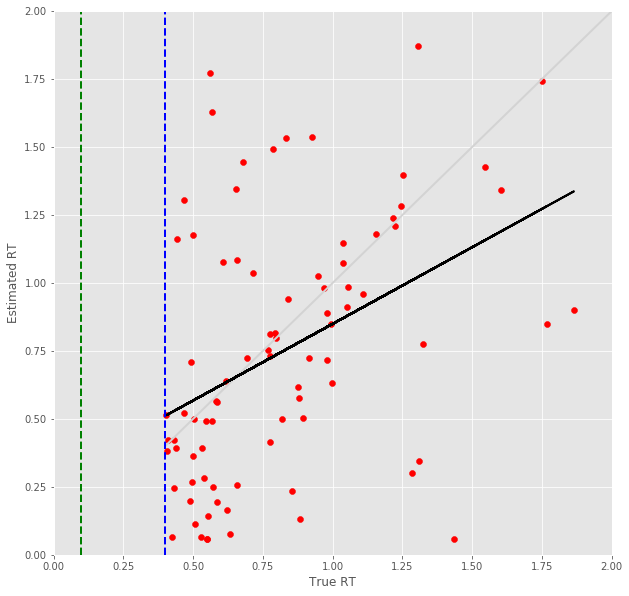

27 -step(s) forecast:
Test Score for 27 -steps forecast: 2.8923 RMSE
Predict Score for 27 -steps forecast: 4.4724 RMSE
Error Test Score for 27 -steps forecast: 0.5622 RMSE
RT Test Score for 27 -steps forecast: 0.5794 RMSE
Error Test Corr for 27 -steps forecast: 0.5865
RT Test Corr for 27 -steps forecast: 0.2600


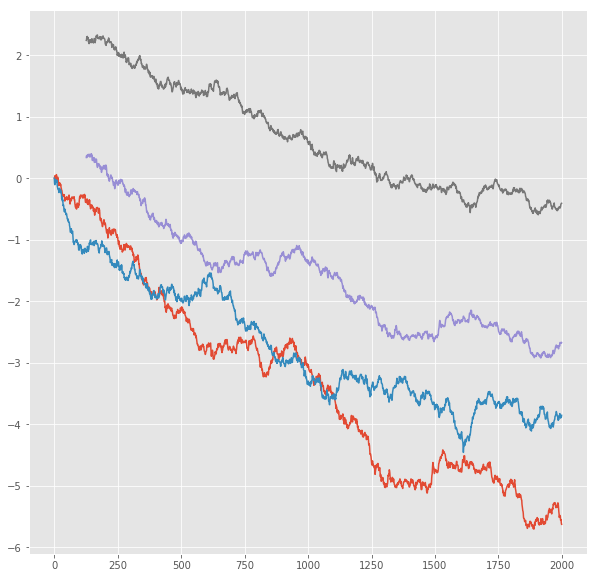

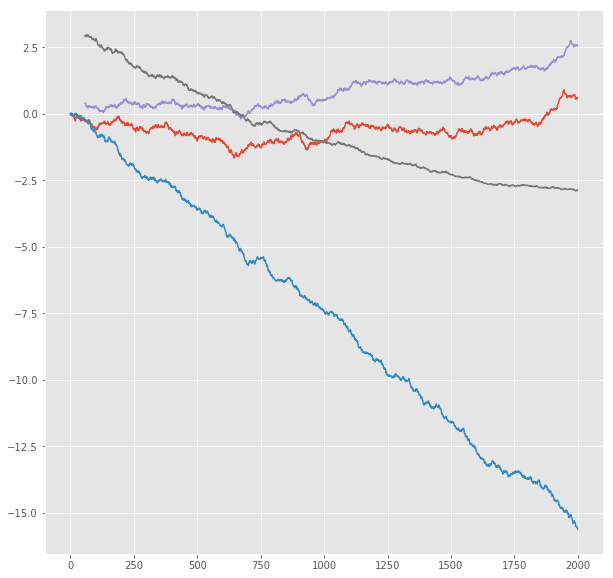

R^2 score for regression on Error: 0.3440
k = 0.8217


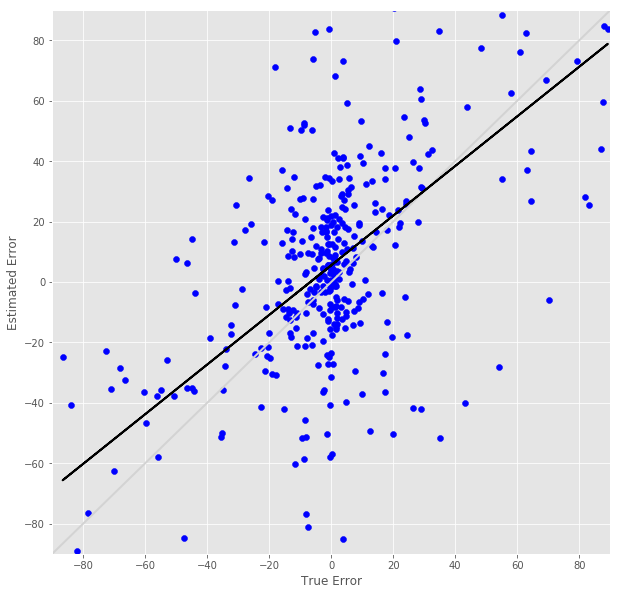

R^2 score for regression on RT: 0.0676
k = 0.2828


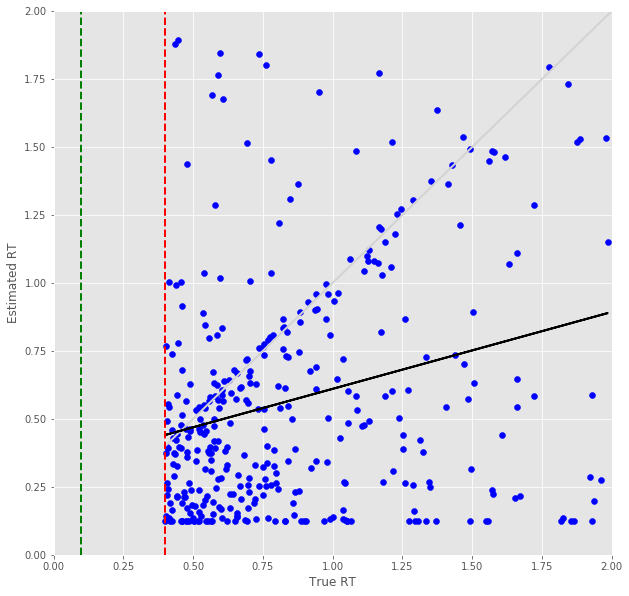

Error Prediction Score: 0.4762 RMSE
RT Prediction Score: 0.4615 RMSE
Error Prediction Corr: 0.7767
RT Prediction Corr: 0.4374
R^2 score for regression on Error: 0.6032
k = 1.0584


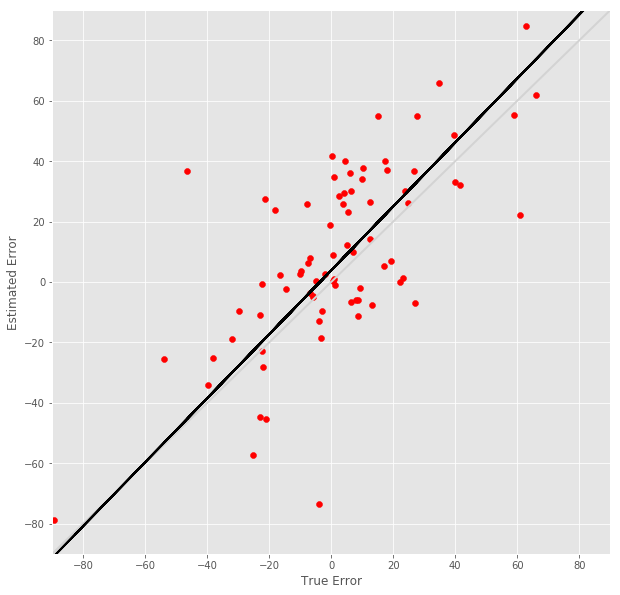

R^2 score for regression on RT: 0.1913
k = 0.6044


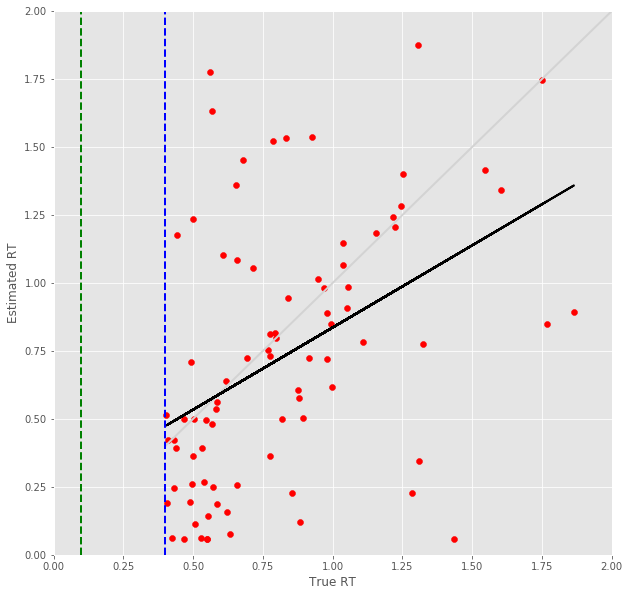

28 -step(s) forecast:
Test Score for 28 -steps forecast: 2.9780 RMSE
Predict Score for 28 -steps forecast: 4.6792 RMSE
Error Test Score for 28 -steps forecast: 0.5783 RMSE
RT Test Score for 28 -steps forecast: 0.5908 RMSE
Error Test Corr for 28 -steps forecast: 0.5653
RT Test Corr for 28 -steps forecast: 0.2469


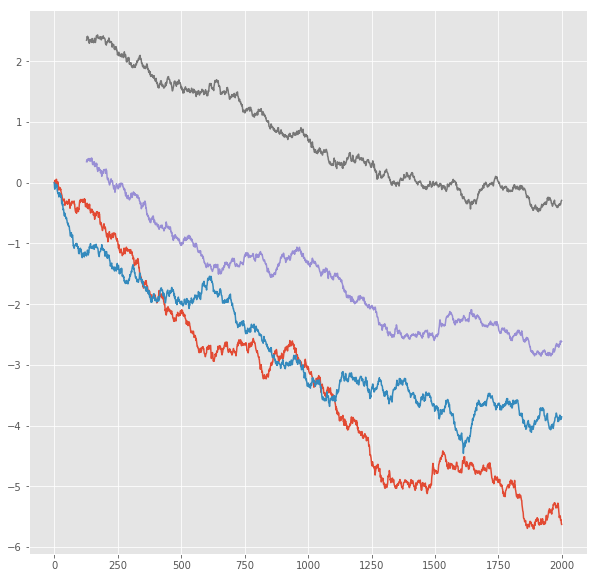

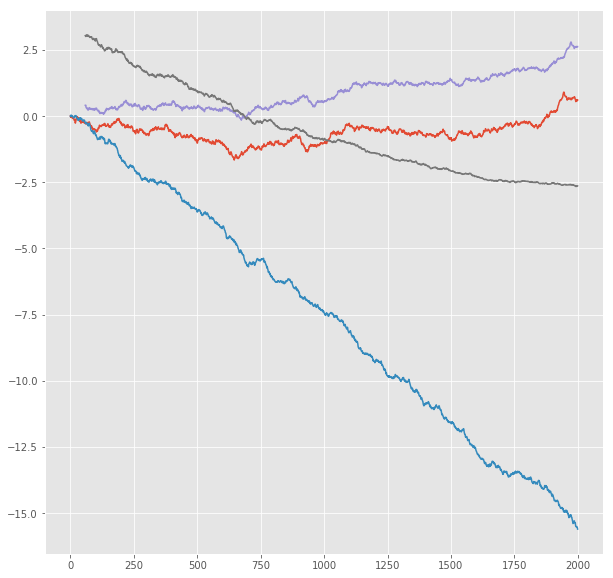

R^2 score for regression on Error: 0.3195
k = 0.8010


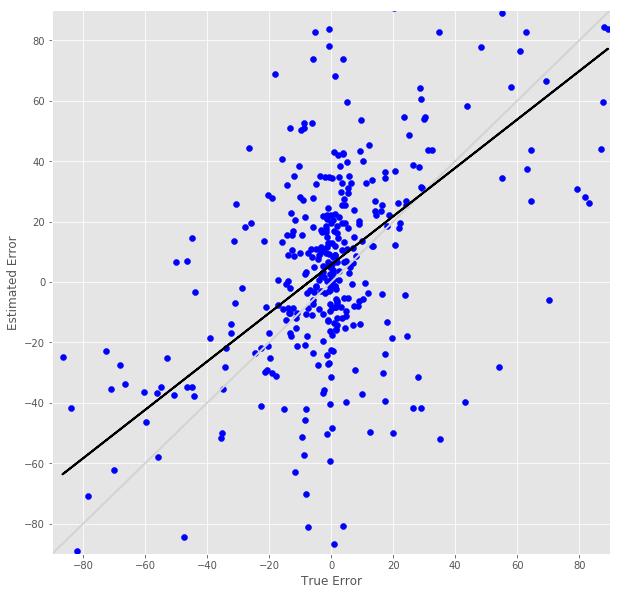

R^2 score for regression on RT: 0.0609
k = 0.2706


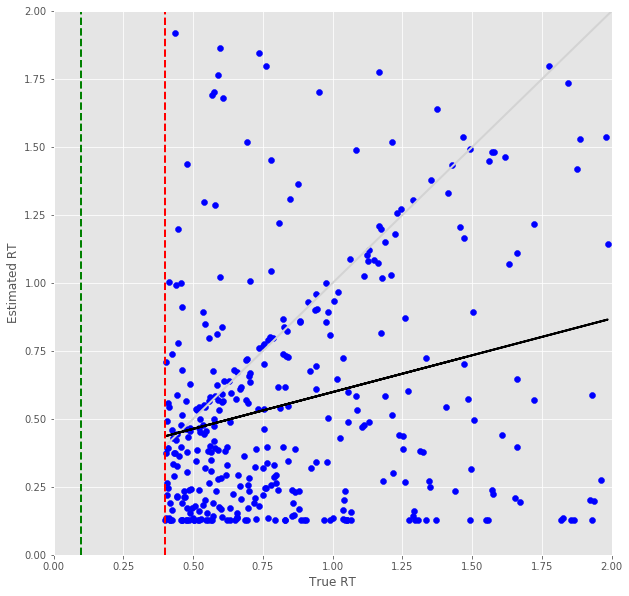

Error Prediction Score: 0.4921 RMSE
RT Prediction Score: 0.4689 RMSE
Error Prediction Corr: 0.7655
RT Prediction Corr: 0.4332
R^2 score for regression on Error: 0.5861
k = 1.0528


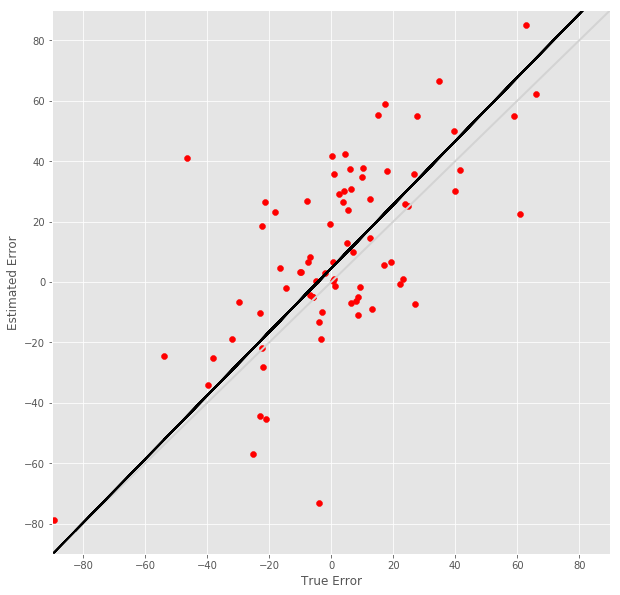

R^2 score for regression on RT: 0.1877
k = 0.6074


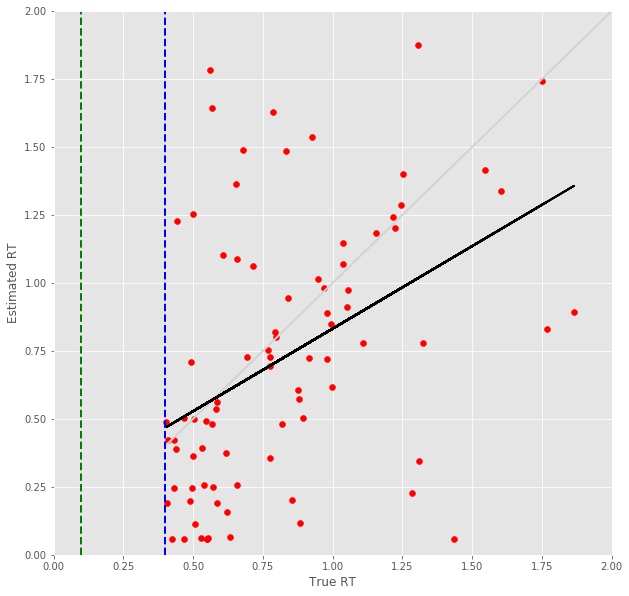

29 -step(s) forecast:
Test Score for 29 -steps forecast: 3.0631 RMSE
Predict Score for 29 -steps forecast: 4.9035 RMSE
Error Test Score for 29 -steps forecast: 0.5874 RMSE
RT Test Score for 29 -steps forecast: 0.5920 RMSE
Error Test Corr for 29 -steps forecast: 0.5593
RT Test Corr for 29 -steps forecast: 0.2485


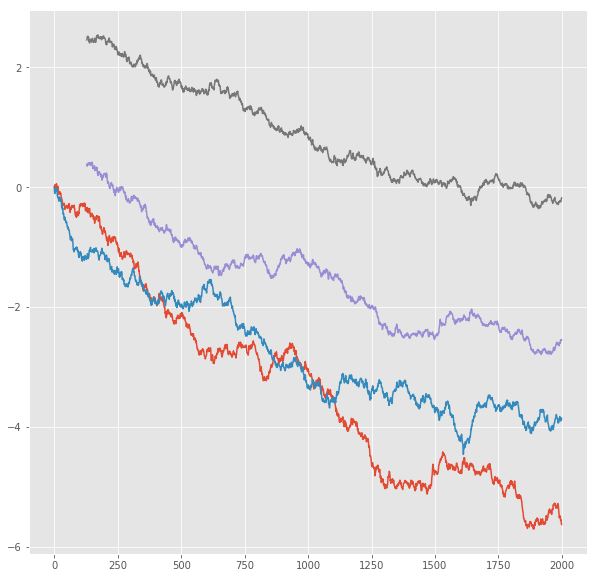

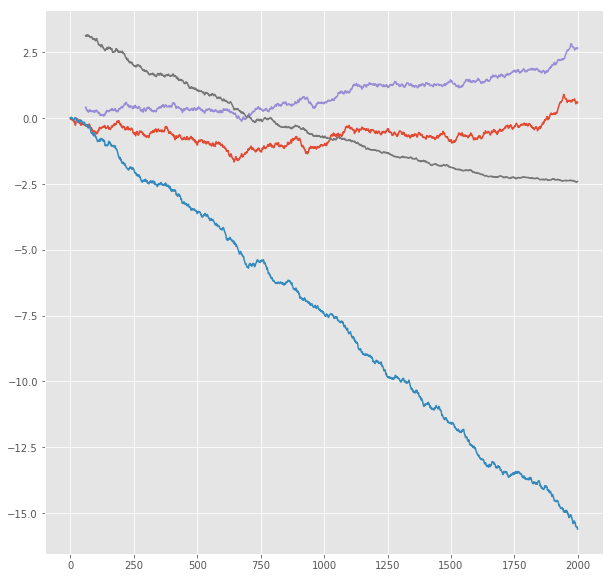

R^2 score for regression on Error: 0.3128
k = 0.8010


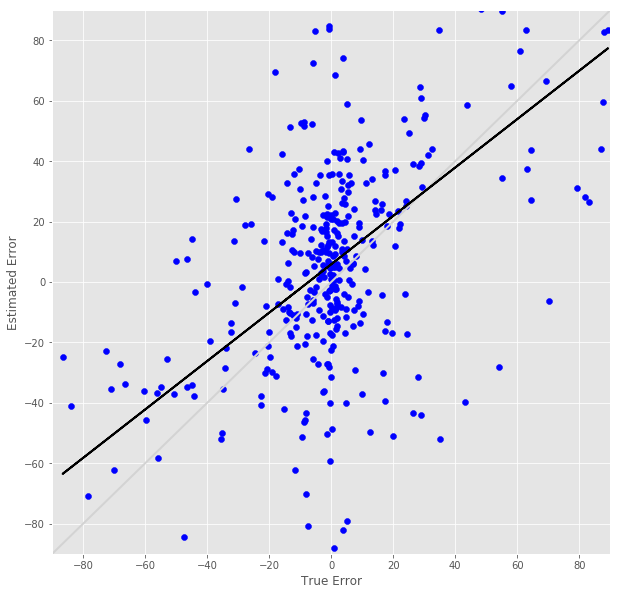

R^2 score for regression on RT: 0.0618
k = 0.2700


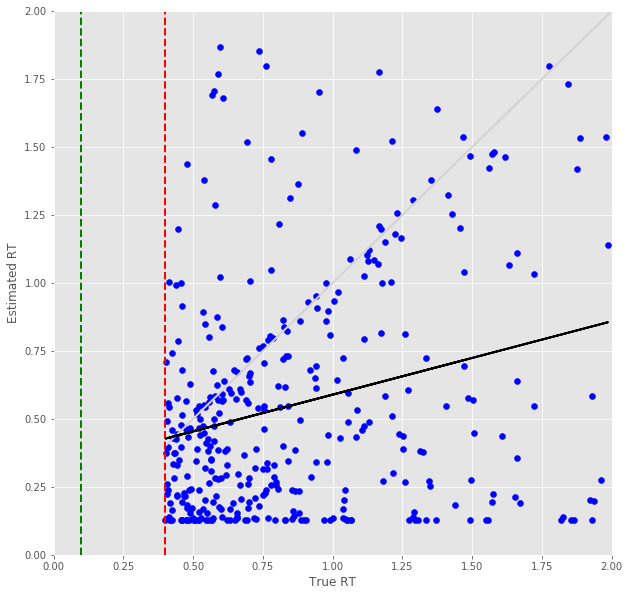

Error Prediction Score: 0.5089 RMSE
RT Prediction Score: 0.4852 RMSE
Error Prediction Corr: 0.7541
RT Prediction Corr: 0.4042
R^2 score for regression on Error: 0.5686
k = 1.0597


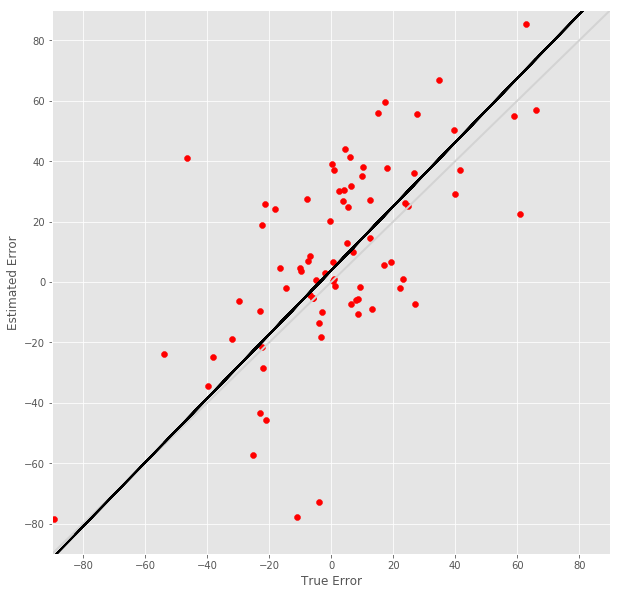

R^2 score for regression on RT: 0.1634
k = 0.5678


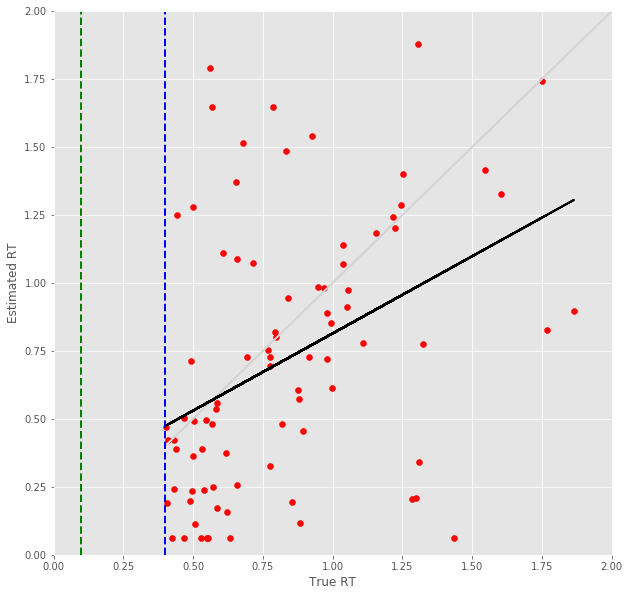

30 -step(s) forecast:
Test Score for 30 -steps forecast: 3.1476 RMSE
Predict Score for 30 -steps forecast: 5.1485 RMSE
Error Test Score for 30 -steps forecast: 0.5972 RMSE
RT Test Score for 30 -steps forecast: 0.6079 RMSE
Error Test Corr for 30 -steps forecast: 0.5427
RT Test Corr for 30 -steps forecast: 0.2142


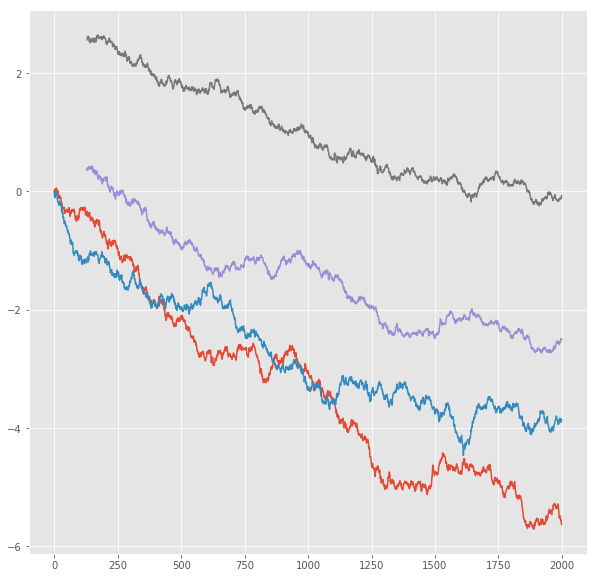

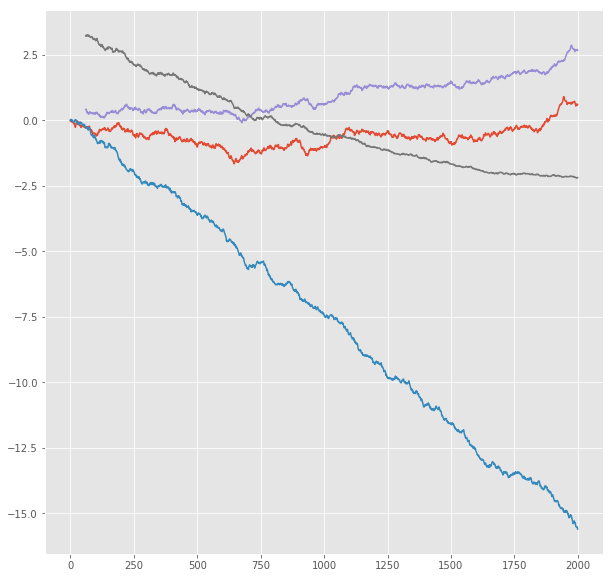

R^2 score for regression on Error: 0.2945
k = 0.7838


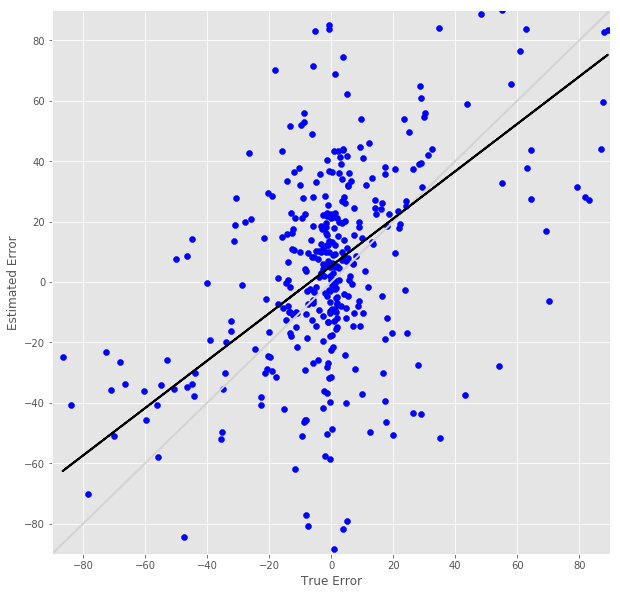

R^2 score for regression on RT: 0.0459
k = 0.2345


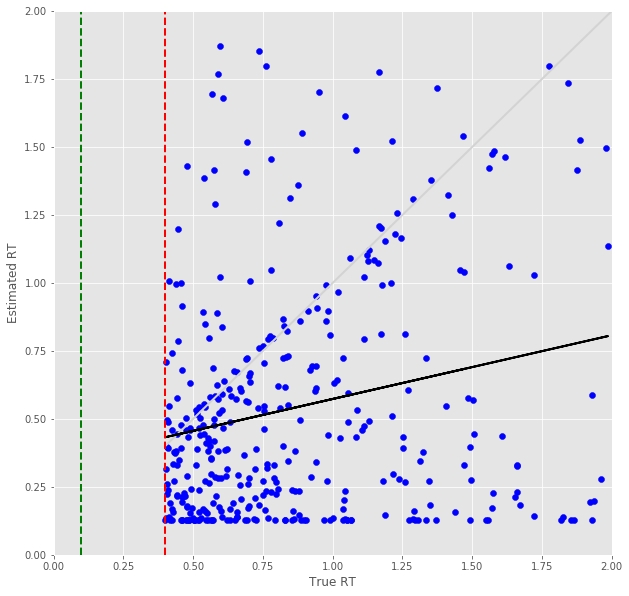

Error Prediction Score: 0.5203 RMSE
RT Prediction Score: 0.4835 RMSE
Error Prediction Corr: 0.7477
RT Prediction Corr: 0.4336
R^2 score for regression on Error: 0.5590
k = 1.0566


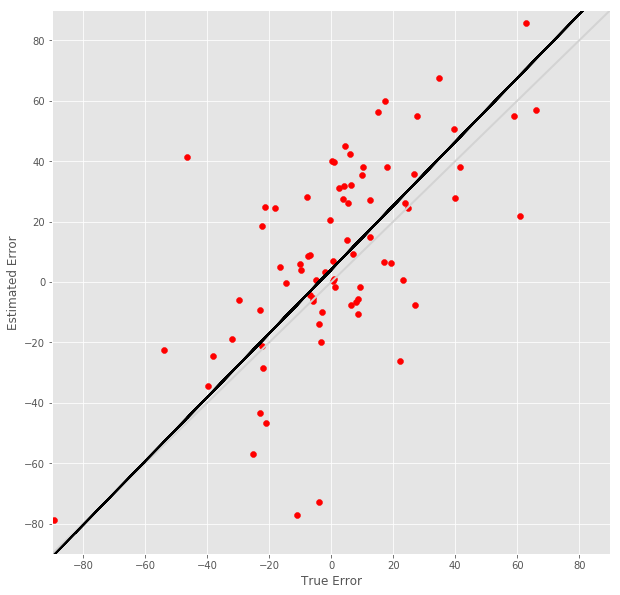

R^2 score for regression on RT: 0.1880
k = 0.6142


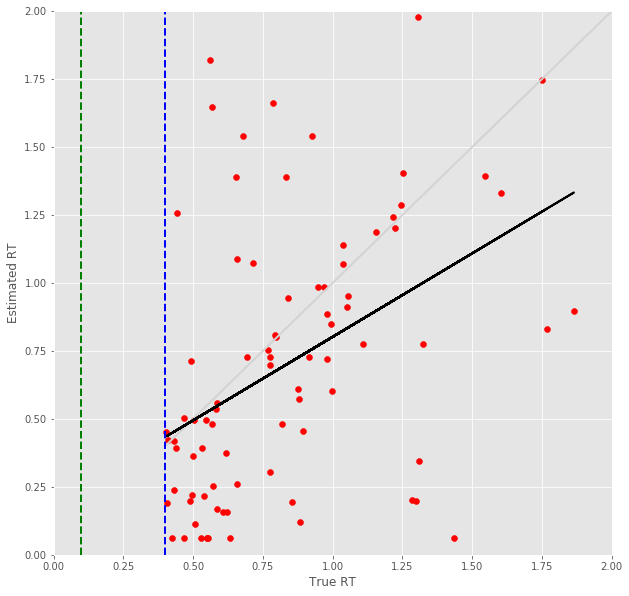

31 -step(s) forecast:
Test Score for 31 -steps forecast: 3.2318 RMSE
Predict Score for 31 -steps forecast: 5.4181 RMSE
Error Test Score for 31 -steps forecast: 0.6070 RMSE
RT Test Score for 31 -steps forecast: 0.6211 RMSE
Error Test Corr for 31 -steps forecast: 0.5384
RT Test Corr for 31 -steps forecast: 0.1984


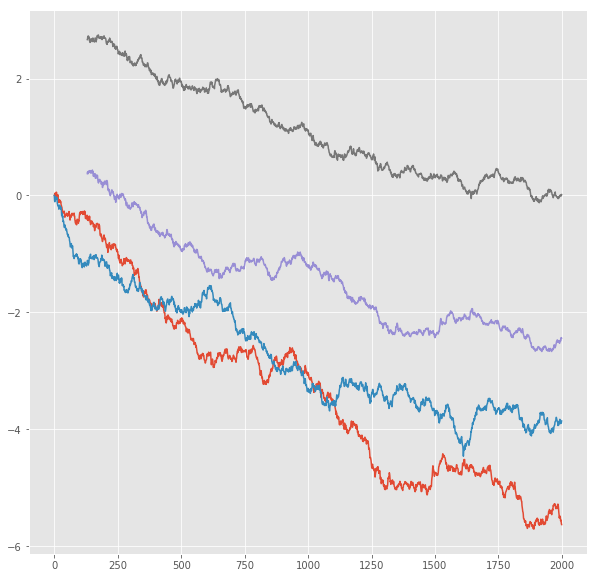

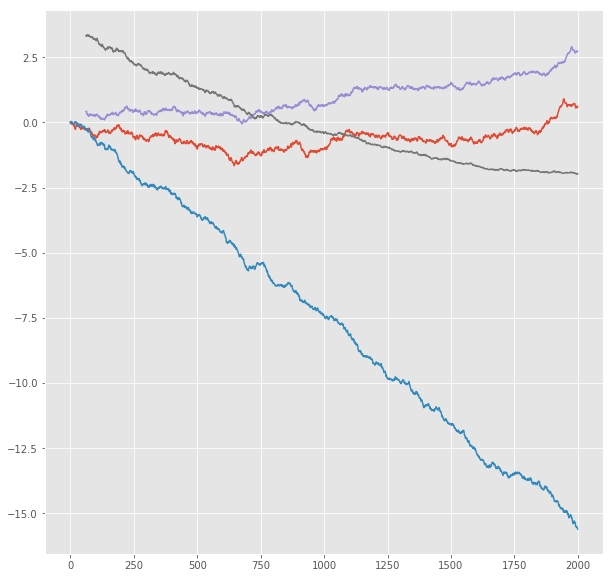

R^2 score for regression on Error: 0.2899
k = 0.7896


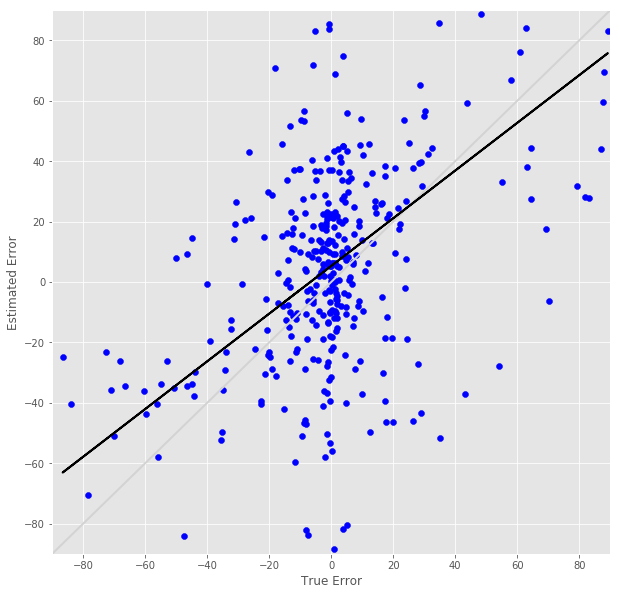

R^2 score for regression on RT: 0.0394
k = 0.2135


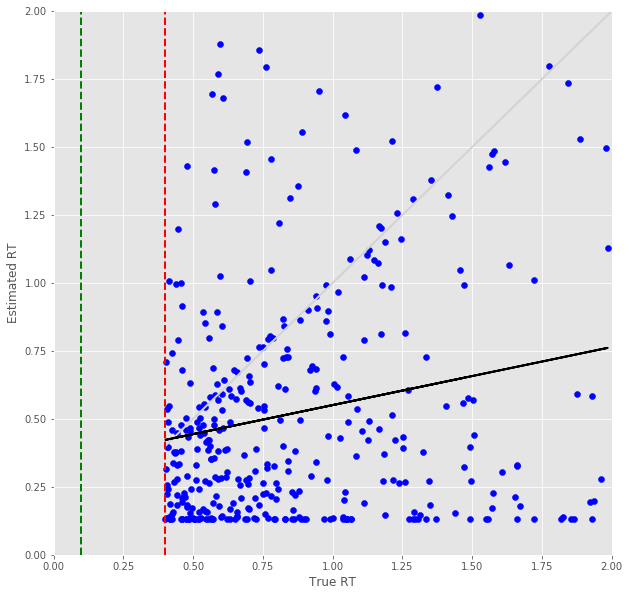

Error Prediction Score: 0.5377 RMSE
RT Prediction Score: 0.5092 RMSE
Error Prediction Corr: 0.7364
RT Prediction Corr: 0.4062
R^2 score for regression on Error: 0.5423
k = 1.0532


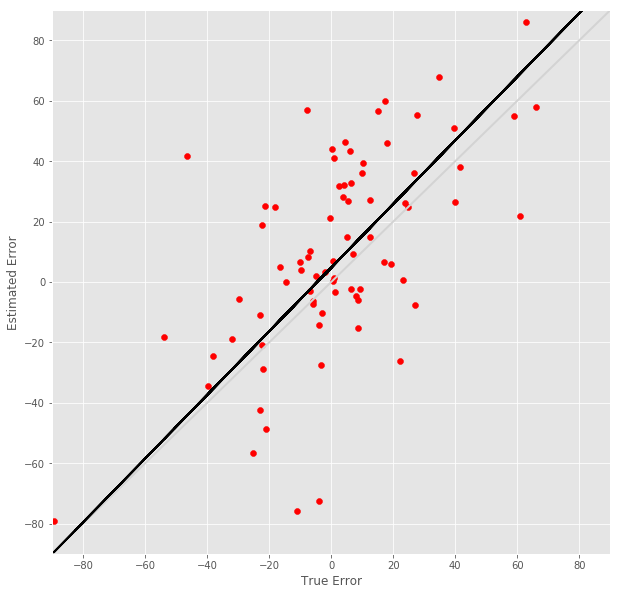

R^2 score for regression on RT: 0.1650
k = 0.5993


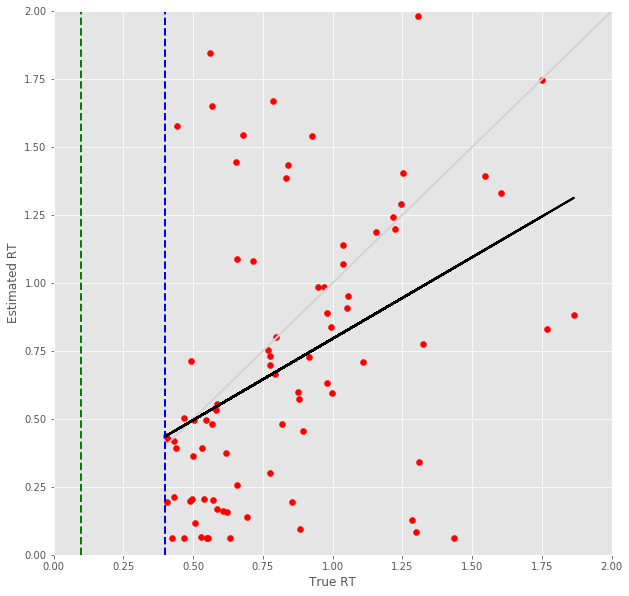

32 -step(s) forecast:
Test Score for 32 -steps forecast: 3.3158 RMSE
Predict Score for 32 -steps forecast: 5.7162 RMSE
Error Test Score for 32 -steps forecast: 0.6224 RMSE
RT Test Score for 32 -steps forecast: 0.6293 RMSE
Error Test Corr for 32 -steps forecast: 0.5264
RT Test Corr for 32 -steps forecast: 0.1932


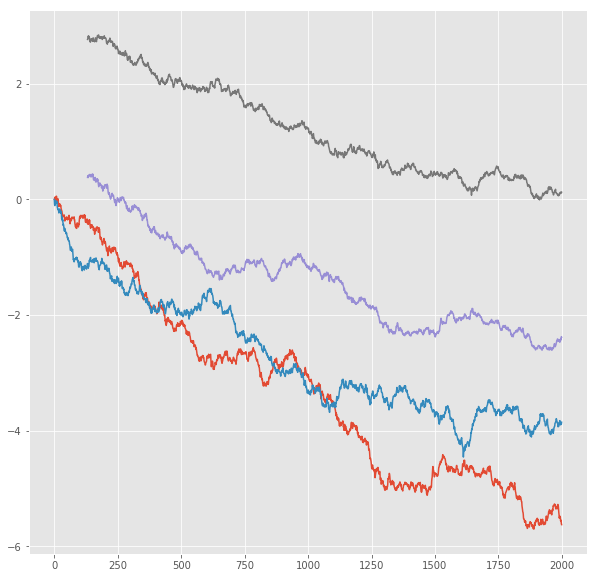

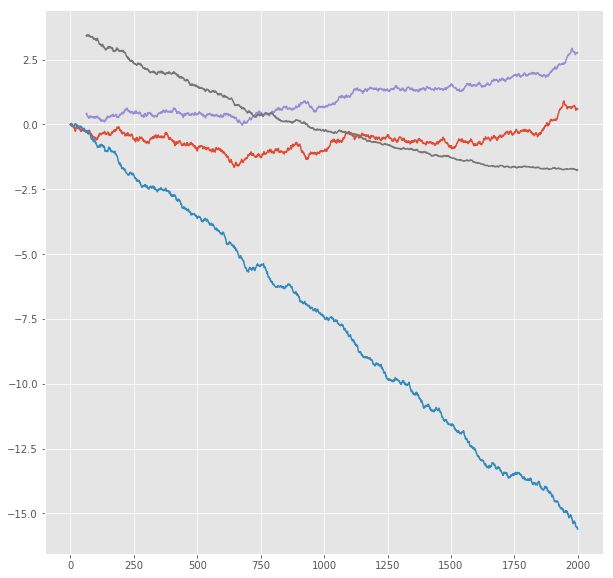

R^2 score for regression on Error: 0.2771
k = 0.7860


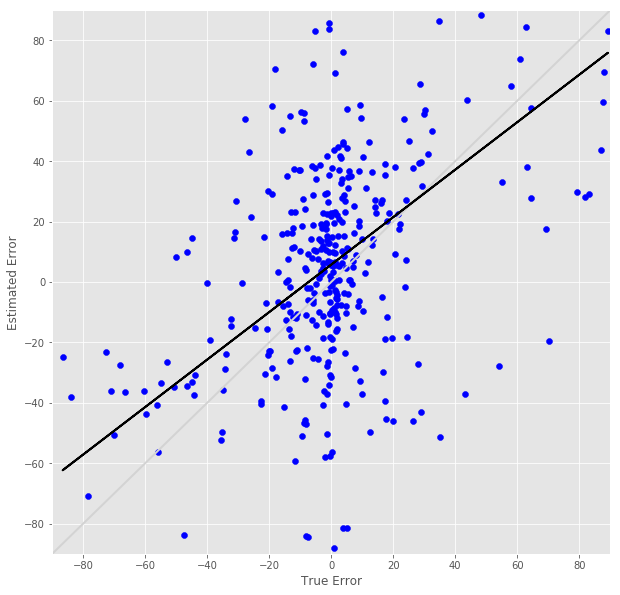

R^2 score for regression on RT: 0.0373
k = 0.2094


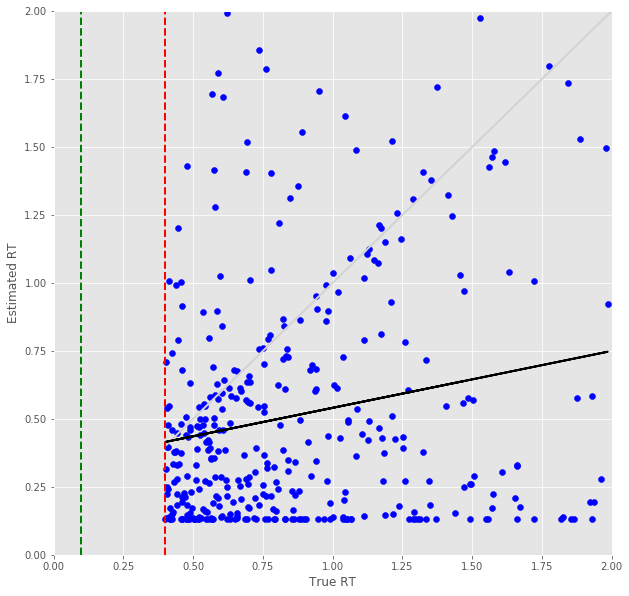

Error Prediction Score: 0.5443 RMSE
RT Prediction Score: 0.5234 RMSE
Error Prediction Corr: 0.7346
RT Prediction Corr: 0.3901
R^2 score for regression on Error: 0.5397
k = 1.0574


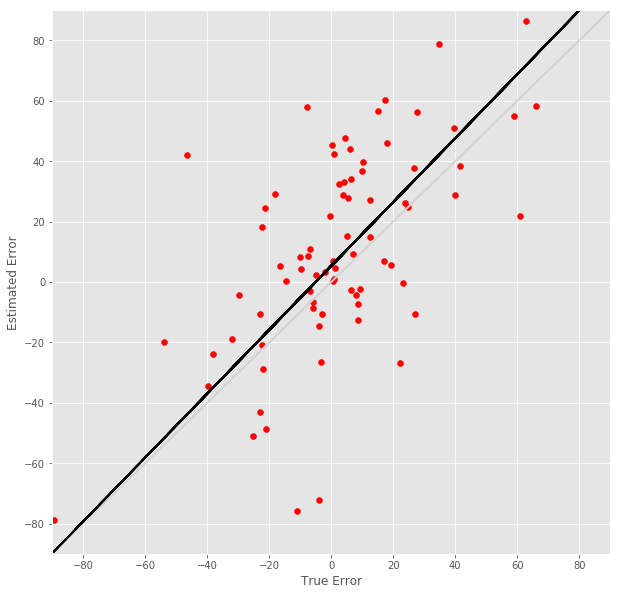

R^2 score for regression on RT: 0.1522
k = 0.5902


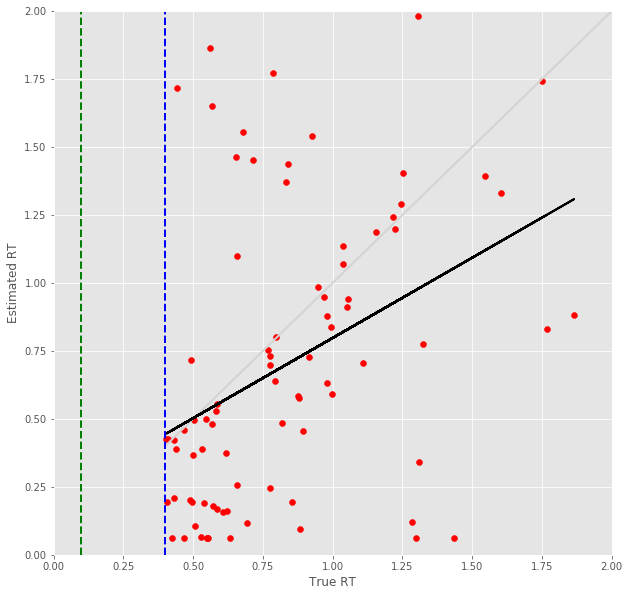

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

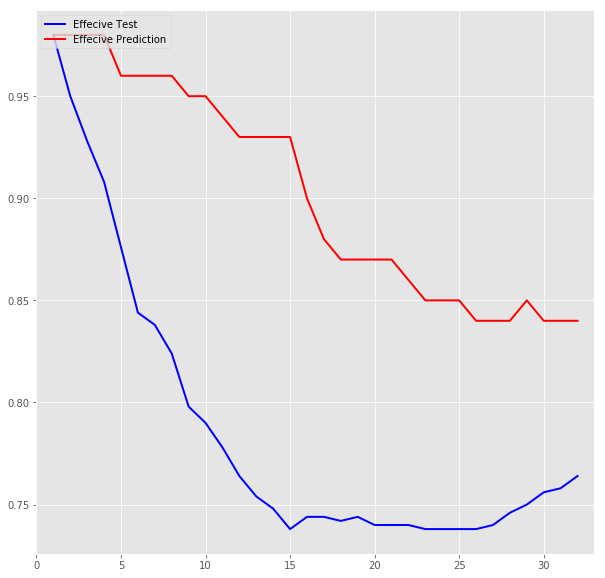

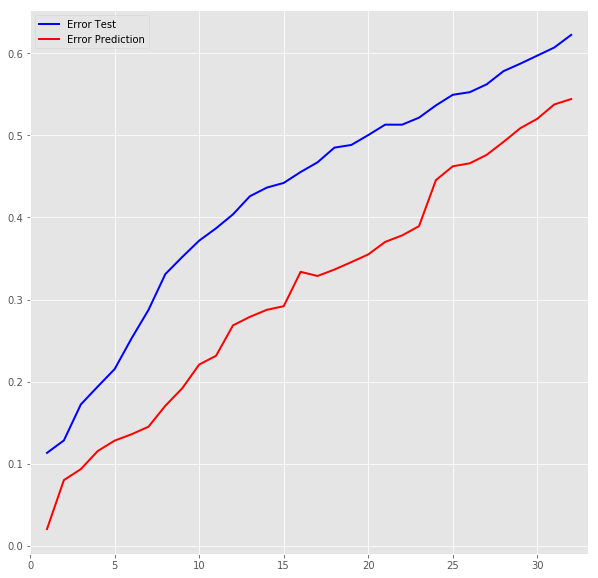

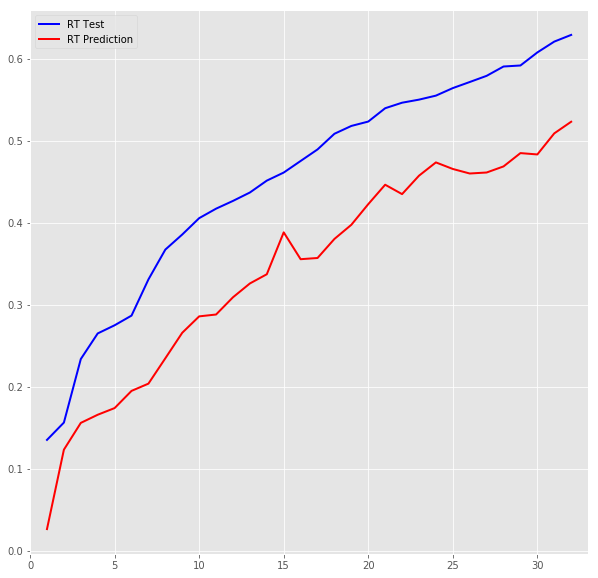

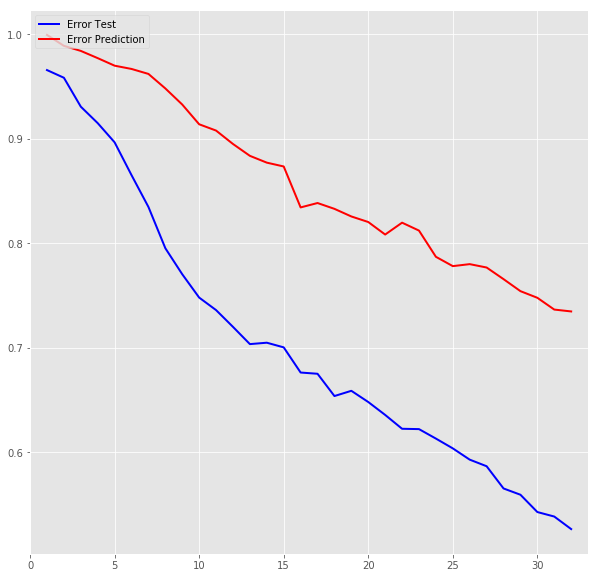

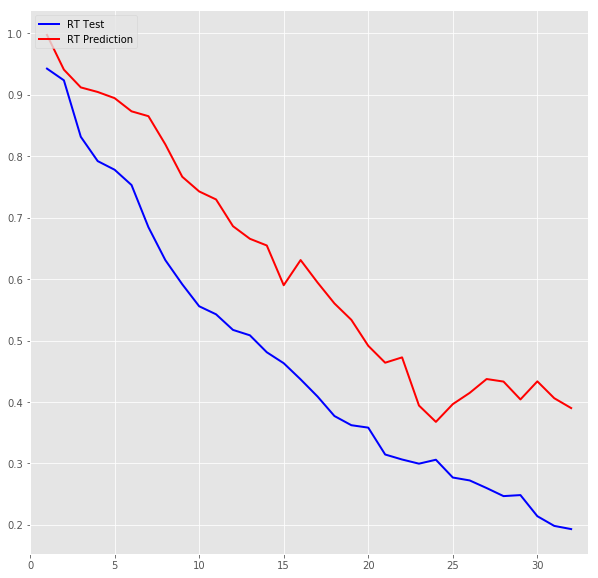

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
